In [1]:
from PIL import Image             # Python Imaging Library
import numpy as np                # Numerical Python 
import matplotlib.pyplot as plt   # Python plotting
import tifffile as tiff
from numba import vectorize
from timeit import default_timer as timer 
from scipy.optimize import curve_fit
import scipy.fftpack as fp
import cv2 as cv
from math import gamma

Filename = 'DUP_tseries_13_715'
images = tiff.imread(Filename + '.tif' )
#images = tiff.imread('myMultipageFile512_0.5_700_cut_500.tif')
shape_img = images.shape
print(shape_img)
N_t = shape_img[0]
pixels = np.min(shape_img[1:2])
print(pixels)
#d_pix = 0.21 #video tanja
#d_pix = 0.1318 #videos de Mayra
#d_pix = 0.18 #videos iniciales part MAyra Florencia
#d_pix = 0.2838
#d_pix = 0.48 #video Erick
d_pix = 0.2741
M = 63
#timestep = 1/30    #tanja
#timestep = 0.1 #Erick
#timestep = 0.244 #Mayra
#timestep = 0.03588  #iniciales florencia
timestep = 0.1395
num_intervals = 130
imagefft_size=[N_t*pixels,pixels]
dfts_und = np.zeros(imagefft_size,'complex64')
Image = images[0]


Fourier_sp_corr = np.zeros([(num_intervals - 1)*pixels, pixels])
Fourier_sp_diff = np.zeros([(num_intervals - 1)*pixels, pixels])


@vectorize(["complex64(complex64, complex64)"], target = 'cpu')
def Complex_mult(a,b):
    #return  (a * b)
    return (a * b)

@vectorize(["float32(complex64, complex64)"], target = 'cpu')
def DF_spectrum(a,b):
    return  (abs(a - b.conjugate()))**2
    

a=0
b=pixels
for i in range(0,N_t):    
    dfts_und[a:b,:]=((d_pix/M)**2)*np.complex64(fp.fft2(images[i]))
    #dfts_und[a:b,:]=((d_pix/M)**2)*cv.dft(np.float32(images[i]), flags = cv.DFT_COMPLEX_OUTPUT)
    print(i)
    a = a+pixels
    b = b+pixels

    
dfts_for = dfts_und.conjugate()
p = N_t - 1
a = 0
b = pixels

delta_array = np.zeros(imagefft_size,'complex64')
delta_array = Complex_mult(dfts_und, dfts_for)
delta_array = np.reshape(delta_array,[N_t, pixels, pixels], order = 'A').mean(axis = 0)
delta_array = (abs(delta_array))
#zero_array = np.zeros(imagefft_size,'complex64')
#zero_array = DF_spectrum(dfts_und, dfts_for)
#zero_array = np.reshape(zero_array,[N_t, pixels, pixels], order = 'A').mean(axis = 0)

for j in range(1,num_intervals):
    start = timer()
    dfts_und = np.delete(dfts_und, np.s_[-pixels:],0 )
    dfts_for = np.delete(dfts_for, np.s_[0:pixels],0 )
    
    diff = DF_spectrum(dfts_und, dfts_for)
    Fourier_sp_diff[a:b, :] = np.reshape(diff,[p, pixels, pixels], order = 'A').mean(axis = 0)
    
    cross_corr = Complex_mult(dfts_und, dfts_for)
    cross_corr_mean = np.reshape(cross_corr,[p, pixels, pixels], order = 'A').mean(axis = 0)
    Fourier_sp_corr[a:b,:] = (abs(cross_corr_mean))
    
    p = p -1
    a = a + pixels
    b = b + pixels
    Complex_mult_time = timer() - start
    print("Complex_mult_time took %f seconds" % Complex_mult_time)
    
Fourier_sp_corr = np.concatenate((delta_array, Fourier_sp_corr), axis=0)    
#Fourier_sp_diff = np.concatenate((zero_array, Fourier_sp_corr), axis=0)     

(715, 256, 256)
256


C:\ProgramData\Anaconda3\lib\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05806685e-05 8.77893854e-06 8.25851021e-06 ... 9.03682485e-06
  8.25851021e-06 8.77893854e-06]
 [9.31242084e-06 9.14504744e-06 7.83868109e-06 ... 8.69844735e-06
  8.86094858e-06 8.74180114e-06]
 [8.90679530e-06 8.47556657e-06 8.32046499e-06 ... 8.86690668e-06
  8.38928827e-06 8.82365475e-06]
 ...
 [8.80980951e-06 8.84701512e-06 8.78365881e-06 ... 8.74538728e-06
  8.17871933e-06 9.13491385e-06]
 [8.90679530e-06 8.82365475e-06 8.38928827e-06 ... 9.29842463e-06
  8.32046499e-06 8.47556657e-06]
 [9.31242084e-06 8.74180114e-06 8.86094858e-06 ... 8.54852624e-06
  7.83868109e-06 9.14504744e-06]]
el max de R es 181


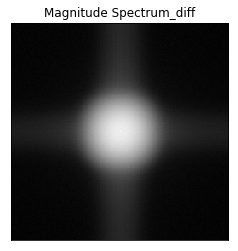

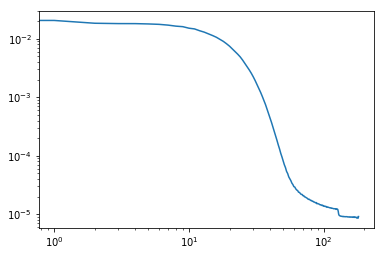

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.42114457e-06 9.02231568e-06 8.04711817e-06 ... 9.00480882e-06
  8.04711817e-06 9.02231568e-06]
 [9.16887257e-06 9.28576901e-06 8.28753218e-06 ... 8.61998069e-06
  8.59111151e-06 8.41552628e-06]
 [8.47872252e-06 8.90218143e-06 8.51755249e-06 ... 8.57786472e-06
  8.28113116e-06 8.97602877e-06]
 ...
 [9.21350602e-06 8.84102519e-06 8.76233116e-06 ... 8.91514992e-06
  8.33473314e-06 8.67671952e-06]
 [8.47872252e-06 8.97602877e-06 8.28113116e-06 ... 9.51740913e-06
  8.51755249e-06 8.90218143e-06]
 [9.16887257e-06 8.41552628e-06 8.59111151e-06 ... 8.63544665e-06
  8.28753218e-06 9.28576901e-06]]
el max de R es 181


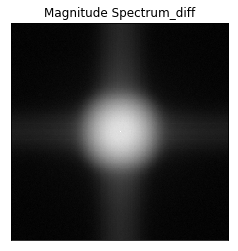

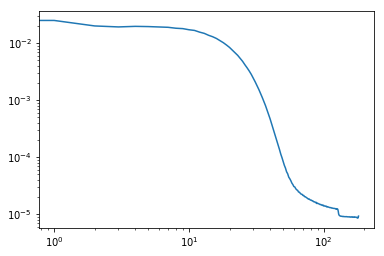

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03509956e-05 9.28486043e-06 8.64317099e-06 ... 8.93124889e-06
  8.64317099e-06 9.28486043e-06]
 [9.08360380e-06 8.68001734e-06 8.50132437e-06 ... 8.89031253e-06
  8.95695939e-06 8.69525502e-06]
 [8.89789499e-06 8.84442215e-06 8.42755890e-06 ... 8.98220969e-06
  8.57819487e-06 8.91323270e-06]
 ...
 [8.70813801e-06 8.79396339e-06 8.70096665e-06 ... 9.10600102e-06
  8.54087557e-06 8.70359963e-06]
 [8.89789499e-06 8.91323270e-06 8.57819487e-06 ... 9.08301990e-06
  8.42755890e-06 8.84442215e-06]
 [9.08360380e-06 8.69525502e-06 8.95695939e-06 ... 9.37146706e-06
  8.50132437e-06 8.68001734e-06]]
el max de R es 181


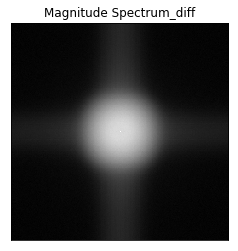

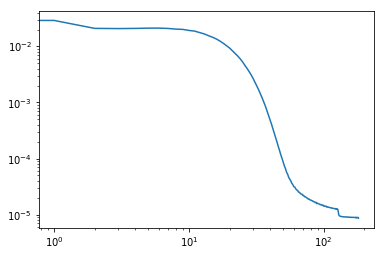

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03553521e-05 8.80908465e-06 9.09418577e-06 ... 8.73596400e-06
  9.09418577e-06 8.80908465e-06]
 [8.92726166e-06 9.06527021e-06 9.25999302e-06 ... 8.42356076e-06
  9.12216728e-06 8.99438601e-06]
 [8.42039935e-06 8.66222581e-06 8.69426094e-06 ... 9.00689156e-06
  8.26452469e-06 8.68487132e-06]
 ...
 [8.89512921e-06 8.91425498e-06 9.20212096e-06 ... 9.02039847e-06
  8.62360230e-06 9.05849811e-06]
 [8.42039935e-06 8.68487132e-06 8.26452469e-06 ... 9.16322551e-06
  8.69426094e-06 8.66222581e-06]
 [8.92726166e-06 8.99438601e-06 9.12216728e-06 ... 9.07958474e-06
  9.25999302e-06 9.06527021e-06]]
el max de R es 181


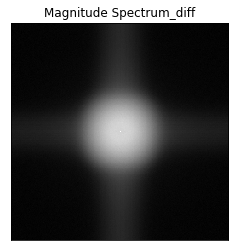

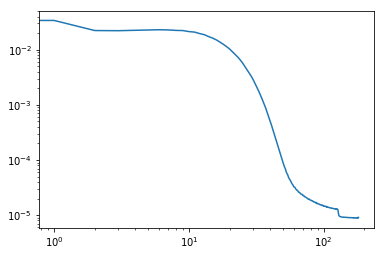

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04326436e-05 9.65703475e-06 8.44093029e-06 ... 8.85318059e-06
  8.44093029e-06 9.65703475e-06]
 [9.03952878e-06 9.36380729e-06 8.62652632e-06 ... 8.58905969e-06
  8.99836232e-06 8.73681711e-06]
 [8.72041619e-06 8.86158614e-06 8.51945060e-06 ... 8.74461693e-06
  8.73151021e-06 8.78479932e-06]
 ...
 [9.07039339e-06 8.67161270e-06 9.10196468e-06 ... 8.81481174e-06
  8.53881920e-06 8.94062669e-06]
 [8.72041619e-06 8.78479932e-06 8.73151021e-06 ... 9.38224821e-06
  8.51945060e-06 8.86158614e-06]
 [9.03952878e-06 8.73681711e-06 8.99836232e-06 ... 9.05496017e-06
  8.62652632e-06 9.36380729e-06]]
el max de R es 181


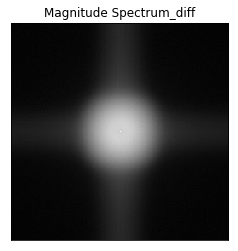

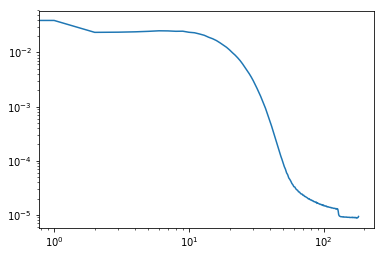

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.90391345e-06 8.78200899e-06 8.57326359e-06 ... 9.00818395e-06
  8.57326359e-06 8.78200899e-06]
 [8.84978817e-06 9.02000193e-06 8.84950896e-06 ... 8.52535322e-06
  8.66574283e-06 8.80387779e-06]
 [8.91590480e-06 9.07945287e-06 8.31357011e-06 ... 8.97760310e-06
  8.82003678e-06 8.95076755e-06]
 ...
 [8.70353233e-06 8.83107805e-06 9.12487849e-06 ... 8.88019440e-06
  8.42474492e-06 8.59452211e-06]
 [8.91590480e-06 8.95076755e-06 8.82003678e-06 ... 9.89299133e-06
  8.31357011e-06 9.07945287e-06]
 [8.84978817e-06 8.80387779e-06 8.66574283e-06 ... 9.32867533e-06
  8.84950896e-06 9.02000193e-06]]
el max de R es 181


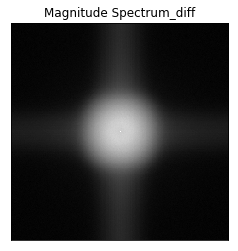

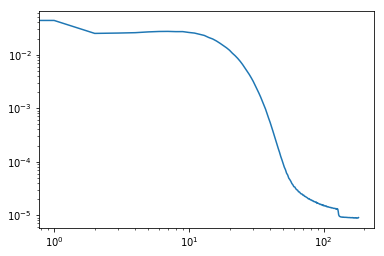

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.92844707e-06 9.28833197e-06 8.37754851e-06 ... 8.85923328e-06
  8.37754851e-06 9.28833197e-06]
 [8.99550378e-06 9.19883587e-06 9.09444952e-06 ... 8.86190173e-06
  9.07004414e-06 8.91886884e-06]
 [9.15021792e-06 8.86356702e-06 8.38234428e-06 ... 9.06242531e-06
  9.08237416e-06 9.10424751e-06]
 ...
 [8.88659360e-06 8.85147892e-06 9.14550310e-06 ... 8.52759240e-06
  8.36861000e-06 8.73747740e-06]
 [9.15021792e-06 9.10424751e-06 9.08237416e-06 ... 9.09004939e-06
  8.38234428e-06 8.86356702e-06]
 [8.99550378e-06 8.91886884e-06 9.07004414e-06 ... 8.31830312e-06
  9.09444952e-06 9.19883587e-06]]
el max de R es 181


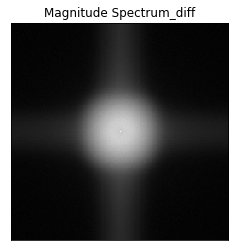

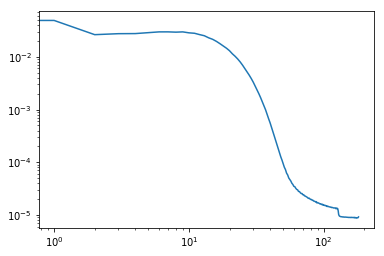

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.63038110e-06 9.20787079e-06 7.89522255e-06 ... 8.90010506e-06
  7.89522255e-06 9.20787079e-06]
 [8.70477470e-06 9.40883001e-06 8.69745872e-06 ... 8.77020830e-06
  8.56803672e-06 8.96561960e-06]
 [9.16040881e-06 8.88600061e-06 8.15386829e-06 ... 8.68340157e-06
  8.92649223e-06 9.08982838e-06]
 ...
 [8.80008247e-06 8.84649853e-06 9.03792443e-06 ... 8.60776709e-06
  8.37772222e-06 8.99505994e-06]
 [9.16040881e-06 9.08982838e-06 8.92649223e-06 ... 9.36015840e-06
  8.15386829e-06 8.88600061e-06]
 [8.70477470e-06 8.96561960e-06 8.56803672e-06 ... 8.75272144e-06
  8.69745872e-06 9.40883001e-06]]
el max de R es 181


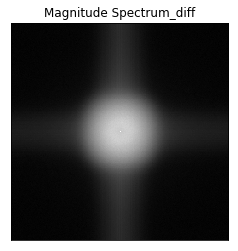

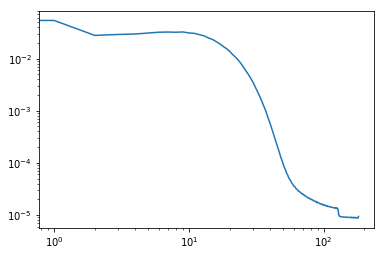

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01014284e-05 8.94692585e-06 7.98562542e-06 ... 9.03627188e-06
  7.98562542e-06 8.94692585e-06]
 [9.12273481e-06 9.11274765e-06 8.89790954e-06 ... 8.57101986e-06
  9.10322342e-06 8.89709190e-06]
 [8.70709482e-06 8.89862076e-06 8.25250936e-06 ... 8.35750689e-06
  8.36301115e-06 9.11875759e-06]
 ...
 [8.85784812e-06 9.01590192e-06 8.95599442e-06 ... 8.90249885e-06
  8.09053745e-06 8.64289086e-06]
 [8.70709482e-06 9.11875759e-06 8.36301115e-06 ... 8.92334629e-06
  8.25250936e-06 8.89862076e-06]
 [9.12273481e-06 8.89709190e-06 9.10322342e-06 ... 8.80544940e-06
  8.89790954e-06 9.11274765e-06]]
el max de R es 181


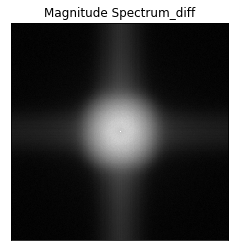

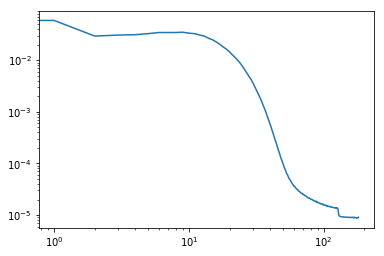

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05120416e-05 9.28261124e-06 8.61121043e-06 ... 8.86206362e-06
  8.61121043e-06 9.28261124e-06]
 [8.52427274e-06 9.00705891e-06 8.58147541e-06 ... 8.49171374e-06
  8.85642385e-06 8.52503308e-06]
 [8.79681920e-06 9.46047476e-06 9.05553952e-06 ... 9.02792635e-06
  8.27158601e-06 8.63384139e-06]
 ...
 [8.85697227e-06 8.54266182e-06 8.96715210e-06 ... 8.85131249e-06
  8.20584592e-06 8.63770219e-06]
 [8.79681920e-06 8.63384139e-06 8.27158601e-06 ... 9.33813317e-06
  9.05553952e-06 9.46047476e-06]
 [8.52427274e-06 8.52503308e-06 8.85642385e-06 ... 9.30041460e-06
  8.58147541e-06 9.00705891e-06]]
el max de R es 181


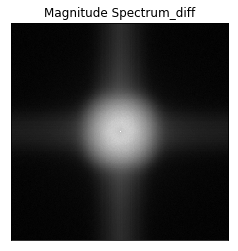

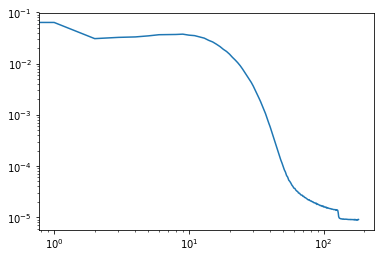

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03650073e-05 9.07593221e-06 8.63638979e-06 ... 8.93199012e-06
  8.63638979e-06 9.07593221e-06]
 [9.45412194e-06 9.34459877e-06 8.66597475e-06 ... 9.14842440e-06
  8.96259917e-06 8.99655606e-06]
 [9.02772354e-06 9.02014017e-06 8.56658698e-06 ... 8.28062002e-06
  8.68945881e-06 8.80750667e-06]
 ...
 [8.67059680e-06 8.79574418e-06 9.02670126e-06 ... 8.78738319e-06
  8.27161875e-06 8.78581614e-06]
 [9.02772354e-06 8.80750667e-06 8.68945881e-06 ... 9.19015929e-06
  8.56658698e-06 9.02014017e-06]
 [9.45412194e-06 8.99655606e-06 8.96259917e-06 ... 9.26083794e-06
  8.66597475e-06 9.34459877e-06]]
el max de R es 181


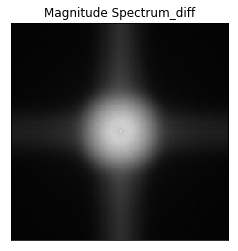

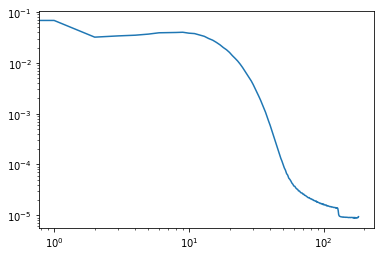

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.10512528e-05 9.66077369e-06 8.54310747e-06 ... 8.52108860e-06
  8.54310747e-06 9.66077369e-06]
 [8.99349288e-06 9.43520627e-06 8.62048819e-06 ... 8.60444743e-06
  9.08455513e-06 8.56974384e-06]
 [9.12658743e-06 8.46118382e-06 8.87863280e-06 ... 8.59029660e-06
  8.57938539e-06 8.87975330e-06]
 ...
 [8.55457711e-06 9.02276315e-06 9.23369953e-06 ... 9.40494010e-06
  8.29537476e-06 8.94575896e-06]
 [9.12658743e-06 8.87975330e-06 8.57938539e-06 ... 8.70770782e-06
  8.87863280e-06 8.46118382e-06]
 [8.99349288e-06 8.56974384e-06 9.08455513e-06 ... 9.16013687e-06
  8.62048819e-06 9.43520627e-06]]
el max de R es 181


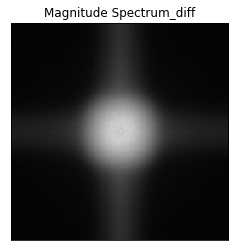

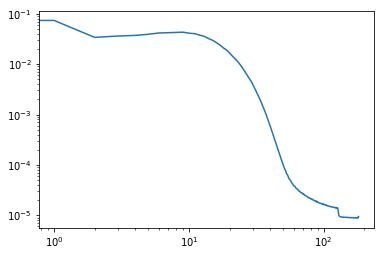

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.58785313e-06 9.18717160e-06 9.13718213e-06 ... 8.87826991e-06
  9.13718213e-06 9.18717160e-06]
 [9.10806921e-06 8.91431955e-06 8.33612739e-06 ... 8.20551850e-06
  8.70388340e-06 8.40692064e-06]
 [9.19271588e-06 8.79308209e-06 8.75933074e-06 ... 8.66829123e-06
  8.67301696e-06 8.53259917e-06]
 ...
 [9.04228546e-06 8.80685457e-06 8.49327716e-06 ... 9.09429673e-06
  7.91864477e-06 8.39132736e-06]
 [9.19271588e-06 8.53259917e-06 8.67301696e-06 ... 8.78566243e-06
  8.75933074e-06 8.79308209e-06]
 [9.10806921e-06 8.40692064e-06 8.70388340e-06 ... 8.92530898e-06
  8.33612739e-06 8.91431955e-06]]
el max de R es 181


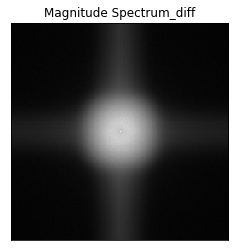

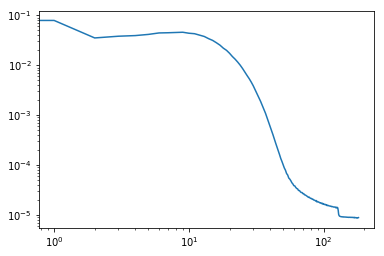

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05359404e-05 8.89412786e-06 8.86115595e-06 ... 8.82300264e-06
  8.86115595e-06 8.89412786e-06]
 [8.81232972e-06 9.57122484e-06 8.29581586e-06 ... 8.36995696e-06
  8.64485355e-06 8.78695300e-06]
 [8.83325993e-06 8.45389422e-06 8.35988249e-06 ... 8.68070583e-06
  8.67852850e-06 8.96652273e-06]
 ...
 [8.63015157e-06 9.00767373e-06 9.12133510e-06 ... 9.07755839e-06
  8.39315180e-06 9.18183832e-06]
 [8.83325993e-06 8.96652273e-06 8.67852850e-06 ... 9.33733918e-06
  8.35988249e-06 8.45389422e-06]
 [8.81232972e-06 8.78695300e-06 8.64485355e-06 ... 8.68358893e-06
  8.29581586e-06 9.57122484e-06]]
el max de R es 181


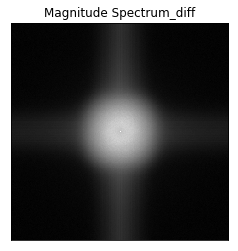

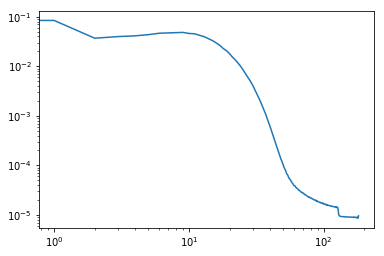

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.00980787e-05 9.19708964e-06 8.73292720e-06 ... 8.79037452e-06
  8.73292720e-06 9.19708964e-06]
 [9.13529220e-06 9.27838664e-06 8.45509385e-06 ... 9.01966723e-06
  8.84921701e-06 8.47768661e-06]
 [8.85797090e-06 8.67938525e-06 7.95165397e-06 ... 9.34165655e-06
  8.69359974e-06 8.88335853e-06]
 ...
 [8.60555338e-06 8.47379852e-06 9.01222120e-06 ... 8.96285746e-06
  8.28446264e-06 8.72199234e-06]
 [8.85797090e-06 8.88335853e-06 8.69359974e-06 ... 9.77249601e-06
  7.95165397e-06 8.67938525e-06]
 [9.13529220e-06 8.47768661e-06 8.84921701e-06 ... 8.93583365e-06
  8.45509385e-06 9.27838664e-06]]
el max de R es 181


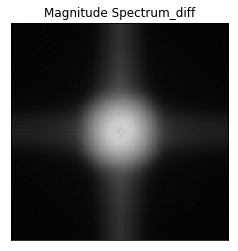

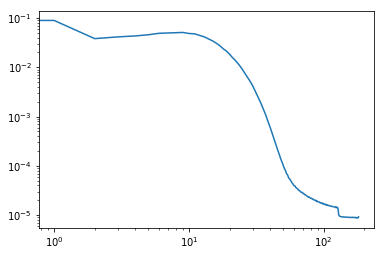

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05249455e-05 9.00297437e-06 8.54782138e-06 ... 8.73092176e-06
  8.54782138e-06 9.00297437e-06]
 [9.46651744e-06 8.81038432e-06 8.89233252e-06 ... 8.60574346e-06
  8.79281379e-06 8.48461241e-06]
 [8.65246147e-06 9.10292238e-06 8.30741465e-06 ... 8.98006965e-06
  8.57927716e-06 9.11197185e-06]
 ...
 [8.59409192e-06 8.83592566e-06 8.61060653e-06 ... 8.48784020e-06
  8.25981260e-06 9.03331511e-06]
 [8.65246147e-06 9.11197185e-06 8.57927716e-06 ... 9.39714846e-06
  8.30741465e-06 9.10292238e-06]
 [9.46651744e-06 8.48461241e-06 8.79281379e-06 ... 9.10616200e-06
  8.89233252e-06 8.81038432e-06]]
el max de R es 181


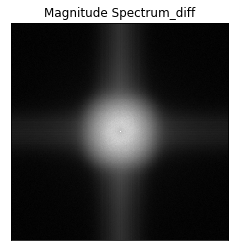

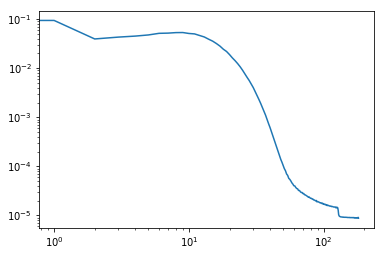

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02977556e-05 9.37222103e-06 8.00579801e-06 ... 9.04655371e-06
  8.00579801e-06 9.37222103e-06]
 [8.83599660e-06 9.54783991e-06 8.39042332e-06 ... 8.28147586e-06
  8.55768030e-06 8.29426335e-06]
 [8.85467398e-06 9.14141856e-06 8.17807449e-06 ... 8.92448679e-06
  8.39775475e-06 8.61457193e-06]
 ...
 [8.93630931e-06 8.47595584e-06 9.17560101e-06 ... 9.10797826e-06
  8.37118478e-06 8.66053779e-06]
 [8.85467398e-06 8.61457193e-06 8.39775475e-06 ... 9.48612615e-06
  8.17807449e-06 9.14141856e-06]
 [8.83599660e-06 8.29426335e-06 8.55768030e-06 ... 9.03656655e-06
  8.39042332e-06 9.54783991e-06]]
el max de R es 181


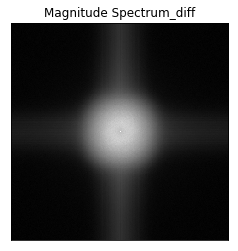

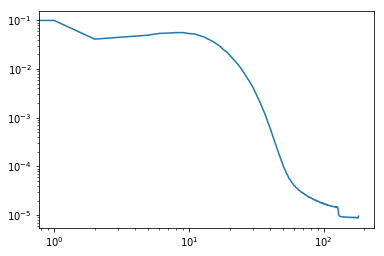

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01557825e-05 9.56754593e-06 8.60530145e-06 ... 8.69668384e-06
  8.60530145e-06 9.56754593e-06]
 [8.74563466e-06 9.25263430e-06 8.54633709e-06 ... 8.42095960e-06
  8.74453144e-06 8.47233059e-06]
 [8.78264018e-06 8.99347924e-06 8.78781066e-06 ... 8.99408769e-06
  8.47417959e-06 9.25982658e-06]
 ...
 [8.74101534e-06 8.64952472e-06 9.03297496e-06 ... 9.17083071e-06
  8.36462823e-06 8.76798822e-06]
 [8.78264018e-06 9.25982658e-06 8.47417959e-06 ... 9.56328222e-06
  8.78781066e-06 8.99347924e-06]
 [8.74563466e-06 8.47233059e-06 8.74453144e-06 ... 9.49962669e-06
  8.54633709e-06 9.25263430e-06]]
el max de R es 181


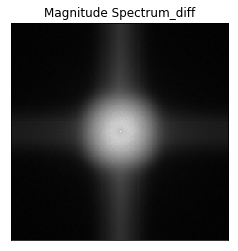

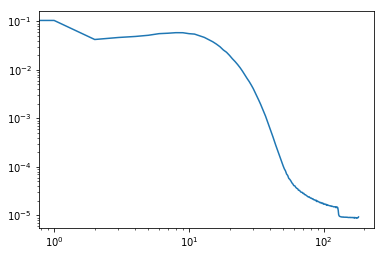

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.06271236e-05 9.32903913e-06 8.77237653e-06 ... 8.96563870e-06
  8.77237653e-06 9.32903913e-06]
 [8.81793494e-06 8.99051156e-06 8.61632179e-06 ... 9.04900571e-06
  9.08358379e-06 9.18882051e-06]
 [9.49743117e-06 8.85975442e-06 8.97419523e-06 ... 8.87514580e-06
  8.23965001e-06 8.49928256e-06]
 ...
 [8.75776550e-06 8.73511635e-06 8.90667161e-06 ... 8.78908486e-06
  8.57850227e-06 8.73429053e-06]
 [9.49743117e-06 8.49928256e-06 8.23965001e-06 ... 9.87604653e-06
  8.97419523e-06 8.85975442e-06]
 [8.81793494e-06 9.18882051e-06 9.08358379e-06 ... 8.90162300e-06
  8.61632179e-06 8.99051156e-06]]
el max de R es 181


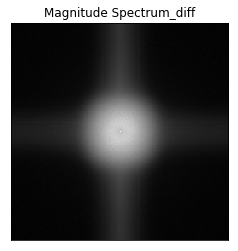

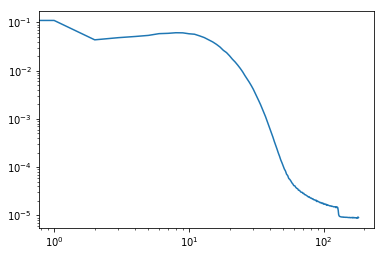

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04403071e-05 9.13284293e-06 8.10481015e-06 ... 9.07614594e-06
  8.10481015e-06 9.13284293e-06]
 [9.13061649e-06 9.52852952e-06 8.60981891e-06 ... 8.84005476e-06
  9.18937621e-06 8.81522919e-06]
 [9.19084141e-06 8.51763070e-06 8.59199372e-06 ... 9.14750763e-06
  8.24796462e-06 8.93805645e-06]
 ...
 [8.50305696e-06 8.63360401e-06 9.29831094e-06 ... 8.77421735e-06
  8.52680751e-06 8.84805013e-06]
 [9.19084141e-06 8.93805645e-06 8.24796462e-06 ... 9.05692468e-06
  8.59199372e-06 8.51763070e-06]
 [9.13061649e-06 8.81522919e-06 9.18937621e-06 ... 9.14047814e-06
  8.60981891e-06 9.52852952e-06]]
el max de R es 181


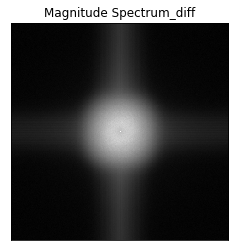

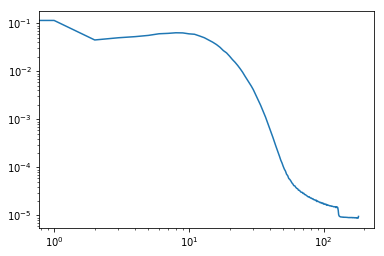

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.33403044e-06 8.55605686e-06 8.61545686e-06 ... 9.31805971e-06
  8.61545686e-06 8.55605686e-06]
 [8.79624622e-06 8.92414937e-06 8.89797957e-06 ... 8.88695922e-06
  8.76610284e-06 9.11978168e-06]
 [8.81433880e-06 8.51103596e-06 8.39840231e-06 ... 9.26770554e-06
  8.47134106e-06 8.59029569e-06]
 ...
 [8.52937410e-06 8.39573568e-06 9.26948815e-06 ... 9.23399602e-06
  8.47980755e-06 8.87621809e-06]
 [8.81433880e-06 8.59029569e-06 8.47134106e-06 ... 9.29946054e-06
  8.39840231e-06 8.51103596e-06]
 [8.79624622e-06 9.11978168e-06 8.76610284e-06 ... 8.65144284e-06
  8.89797957e-06 8.92414937e-06]]
el max de R es 181


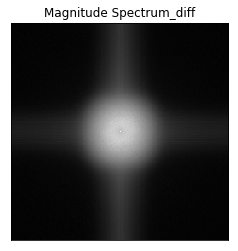

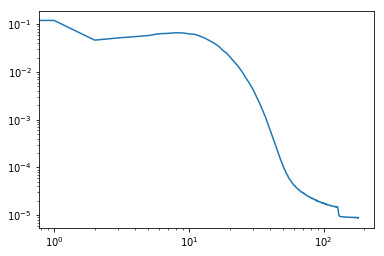

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.07899150e-05 9.17702619e-06 8.64850699e-06 ... 8.33649665e-06
  8.64850699e-06 9.17702619e-06]
 [8.76009108e-06 9.42885436e-06 8.61772969e-06 ... 8.59334523e-06
  8.75983915e-06 8.57043869e-06]
 [8.76680951e-06 8.72385317e-06 8.45455816e-06 ... 9.10989456e-06
  8.49124990e-06 9.15919009e-06]
 ...
 [9.03972614e-06 8.62635898e-06 8.97432074e-06 ... 9.08577113e-06
  8.54962764e-06 8.59988086e-06]
 [8.76680951e-06 9.15919009e-06 8.49124990e-06 ... 9.20152797e-06
  8.45455816e-06 8.72385317e-06]
 [8.76009108e-06 8.57043869e-06 8.75983915e-06 ... 9.27356723e-06
  8.61772969e-06 9.42885436e-06]]
el max de R es 181


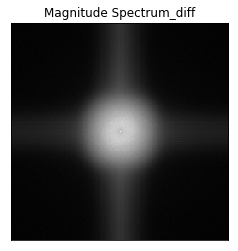

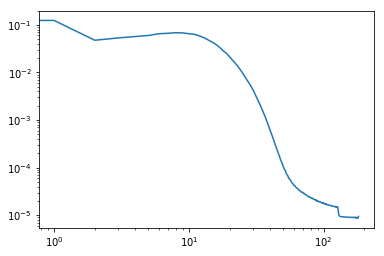

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.00245634e-05 8.82893346e-06 8.80104653e-06 ... 8.66796563e-06
  8.80104653e-06 8.82893346e-06]
 [9.00352552e-06 9.14162865e-06 8.66282426e-06 ... 8.44350507e-06
  8.78780429e-06 9.01136809e-06]
 [9.04233730e-06 8.67329345e-06 8.08695495e-06 ... 8.50996912e-06
  8.75912974e-06 9.37090681e-06]
 ...
 [8.93411197e-06 8.95970970e-06 9.27045585e-06 ... 9.30731949e-06
  8.31107445e-06 8.78779792e-06]
 [9.04233730e-06 9.37090681e-06 8.75912974e-06 ... 9.32330477e-06
  8.08695495e-06 8.67329345e-06]
 [9.00352552e-06 9.01136809e-06 8.78780429e-06 ... 9.10351173e-06
  8.66282426e-06 9.14162865e-06]]
el max de R es 181


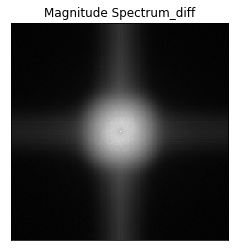

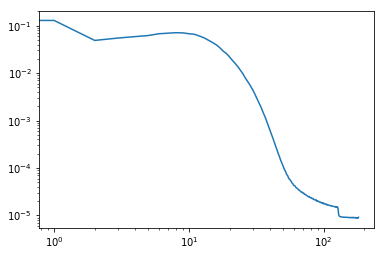

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.91009983e-06 8.44643910e-06 8.56002134e-06 ... 8.86428643e-06
  8.56002134e-06 8.44643910e-06]
 [8.62066827e-06 9.16621866e-06 8.75489513e-06 ... 8.29431610e-06
  8.33091963e-06 8.87084389e-06]
 [9.12661653e-06 8.85591453e-06 8.38665619e-06 ... 8.81720644e-06
  8.66386017e-06 8.79277832e-06]
 ...
 [8.22954735e-06 8.58020212e-06 8.70780786e-06 ... 8.97807058e-06
  8.45597606e-06 8.77831189e-06]
 [9.12661653e-06 8.79277832e-06 8.66386017e-06 ... 9.32909370e-06
  8.38665619e-06 8.85591453e-06]
 [8.62066827e-06 8.87084389e-06 8.33091963e-06 ... 9.21928859e-06
  8.75489513e-06 9.16621866e-06]]
el max de R es 181


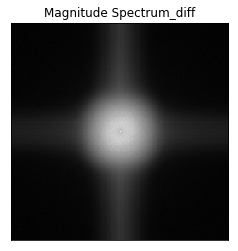

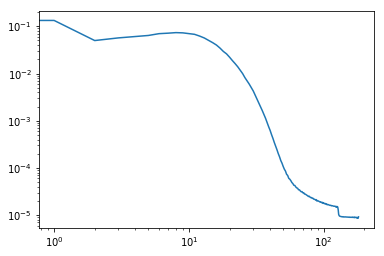

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.93391677e-06 8.90307092e-06 8.34433922e-06 ... 8.91354284e-06
  8.34433922e-06 8.90307092e-06]
 [8.89773673e-06 9.94371931e-06 8.46795774e-06 ... 8.52709400e-06
  8.60475302e-06 8.48501713e-06]
 [8.62998877e-06 9.09603023e-06 8.10002894e-06 ... 8.65436323e-06
  8.60927139e-06 8.69657379e-06]
 ...
 [8.94990171e-06 8.74743000e-06 9.23329299e-06 ... 8.95927315e-06
  8.54905829e-06 8.61747139e-06]
 [8.62998877e-06 8.69657379e-06 8.60927139e-06 ... 8.98013241e-06
  8.10002894e-06 9.09603023e-06]
 [8.89773673e-06 8.48501713e-06 8.60475302e-06 ... 8.76279319e-06
  8.46795774e-06 9.94371931e-06]]
el max de R es 181


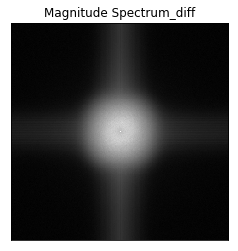

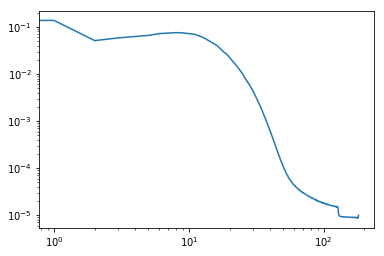

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.09111124e-05 9.24615870e-06 7.95847336e-06 ... 8.87484020e-06
  7.95847336e-06 9.24615870e-06]
 [8.85338977e-06 8.89006242e-06 8.62873367e-06 ... 8.21085905e-06
  9.07219601e-06 8.60947239e-06]
 [8.87845363e-06 8.43828093e-06 8.72471628e-06 ... 9.31624527e-06
  8.66856226e-06 8.77169987e-06]
 ...
 [9.01676867e-06 8.87625265e-06 9.08922084e-06 ... 8.80088191e-06
  8.09861831e-06 8.95832000e-06]
 [8.87845363e-06 8.77169987e-06 8.66856226e-06 ... 9.42465431e-06
  8.72471628e-06 8.43828093e-06]
 [8.85338977e-06 8.60947239e-06 9.07219601e-06 ... 8.89277999e-06
  8.62873367e-06 8.89006242e-06]]
el max de R es 181


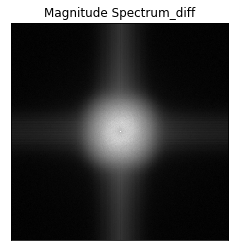

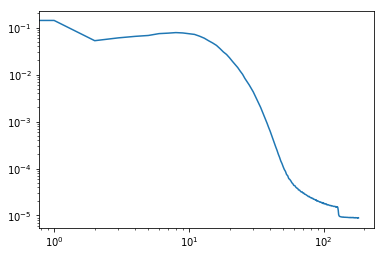

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01701789e-05 9.17440320e-06 8.66021855e-06 ... 9.30427996e-06
  8.66021855e-06 9.17440320e-06]
 [8.80569041e-06 9.22099480e-06 8.54556674e-06 ... 8.50246943e-06
  8.89314106e-06 8.61872923e-06]
 [9.00858413e-06 8.84504971e-06 8.67551898e-06 ... 9.02979991e-06
  8.95454195e-06 8.95026551e-06]
 ...
 [8.87078750e-06 8.62153502e-06 8.66927985e-06 ... 8.34441471e-06
  8.35652372e-06 8.59979446e-06]
 [9.00858413e-06 8.95026551e-06 8.95454195e-06 ... 9.36216020e-06
  8.67551898e-06 8.84504971e-06]
 [8.80569041e-06 8.61872923e-06 8.89314106e-06 ... 9.40102382e-06
  8.54556674e-06 9.22099480e-06]]
el max de R es 181


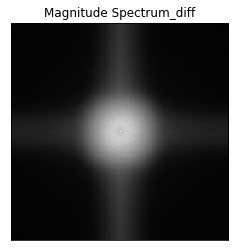

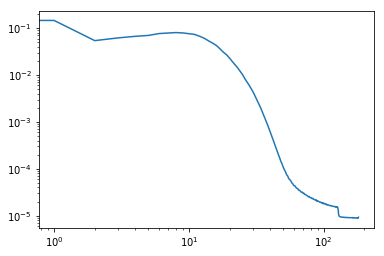

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05621475e-05 8.85480858e-06 8.33102695e-06 ... 8.27083295e-06
  8.33102695e-06 8.85480858e-06]
 [9.22855725e-06 9.48776869e-06 8.60236651e-06 ... 8.38483902e-06
  9.23584594e-06 8.06849584e-06]
 [9.13932217e-06 9.18575643e-06 8.71143402e-06 ... 8.98887902e-06
  9.00377745e-06 8.91147283e-06]
 ...
 [8.96873007e-06 8.88230807e-06 9.36498054e-06 ... 9.20057664e-06
  8.48771651e-06 9.16971567e-06]
 [9.13932217e-06 8.91147283e-06 9.00377745e-06 ... 8.94541881e-06
  8.71143402e-06 9.18575643e-06]
 [9.22855725e-06 8.06849584e-06 9.23584594e-06 ... 9.00012310e-06
  8.60236651e-06 9.48776869e-06]]
el max de R es 181


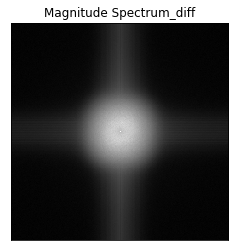

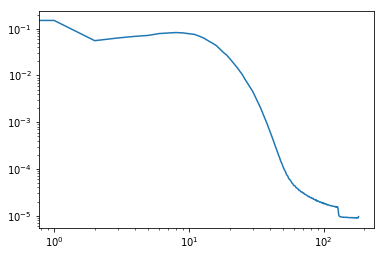

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01058477e-05 9.15173041e-06 8.41375368e-06 ... 8.77144703e-06
  8.41375368e-06 9.15173041e-06]
 [8.96501388e-06 8.93317065e-06 8.57501891e-06 ... 8.88682007e-06
  8.83913344e-06 8.70272652e-06]
 [8.61433091e-06 9.07366029e-06 8.30316094e-06 ... 9.12105043e-06
  9.19410286e-06 9.18164915e-06]
 ...
 [9.05355319e-06 8.31929174e-06 8.90208685e-06 ... 8.62953675e-06
  8.31803118e-06 8.92228854e-06]
 [8.61433091e-06 9.18164915e-06 9.19410286e-06 ... 9.21229457e-06
  8.30316094e-06 9.07366029e-06]
 [8.96501388e-06 8.70272652e-06 8.83913344e-06 ... 8.78656192e-06
  8.57501891e-06 8.93317065e-06]]
el max de R es 181


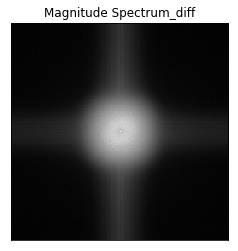

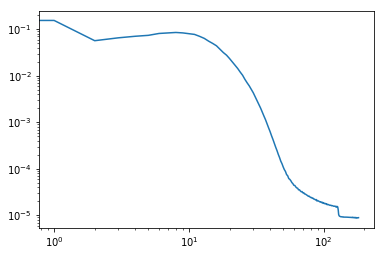

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04524715e-05 9.01749172e-06 9.29958151e-06 ... 8.64540471e-06
  9.29958151e-06 9.01749172e-06]
 [9.02134616e-06 9.46521777e-06 8.71359589e-06 ... 8.36598792e-06
  8.89385774e-06 8.70474469e-06]
 [8.79772688e-06 8.87336500e-06 8.82407039e-06 ... 9.25715995e-06
  8.67564995e-06 8.66943719e-06]
 ...
 [9.00821851e-06 8.67132894e-06 9.44709973e-06 ... 8.63651985e-06
  8.25767802e-06 9.15619057e-06]
 [8.79772688e-06 8.66943719e-06 8.67564995e-06 ... 9.47155149e-06
  8.82407039e-06 8.87336500e-06]
 [9.02134616e-06 8.70474469e-06 8.89385774e-06 ... 8.73557201e-06
  8.71359589e-06 9.46521777e-06]]
el max de R es 181


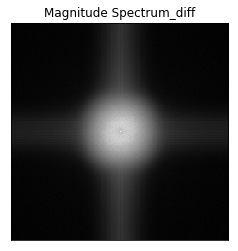

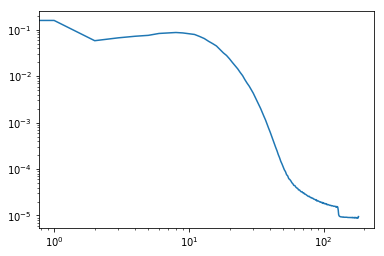

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01459627e-05 8.94835193e-06 8.68790084e-06 ... 9.13627082e-06
  8.68790084e-06 8.94835193e-06]
 [8.90001502e-06 9.22888739e-06 8.71288375e-06 ... 8.46011881e-06
  8.77486309e-06 8.68900952e-06]
 [8.81733013e-06 8.56712086e-06 8.62583420e-06 ... 8.96126585e-06
  8.57827308e-06 9.16697627e-06]
 ...
 [8.86657199e-06 8.80287189e-06 9.28567988e-06 ... 8.83049051e-06
  8.89124840e-06 8.77768980e-06]
 [8.81733013e-06 9.16697627e-06 8.57827308e-06 ... 9.27653491e-06
  8.62583420e-06 8.56712086e-06]
 [8.90001502e-06 8.68900952e-06 8.77486309e-06 ... 8.72629516e-06
  8.71288375e-06 9.22888739e-06]]
el max de R es 181


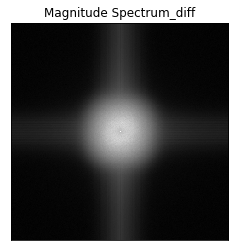

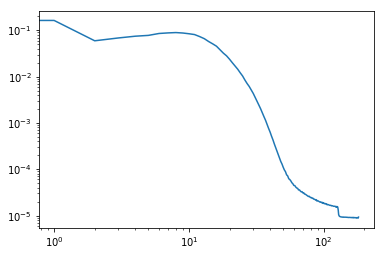

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02289305e-05 9.24973483e-06 8.71065276e-06 ... 8.70604799e-06
  8.71065276e-06 9.24973483e-06]
 [8.87748229e-06 9.09335358e-06 8.72206874e-06 ... 8.45958857e-06
  8.46722196e-06 8.75087153e-06]
 [9.12780433e-06 9.13362055e-06 8.55575126e-06 ... 9.00365558e-06
  8.70042459e-06 8.99240331e-06]
 ...
 [8.24613289e-06 8.80505559e-06 9.04996432e-06 ... 9.12061205e-06
  8.44838814e-06 8.80307289e-06]
 [9.12780433e-06 8.99240331e-06 8.70042459e-06 ... 9.27736437e-06
  8.55575126e-06 9.13362055e-06]
 [8.87748229e-06 8.75087153e-06 8.46722196e-06 ... 8.93173001e-06
  8.72206874e-06 9.09335358e-06]]
el max de R es 181


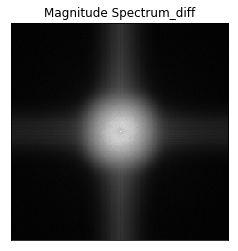

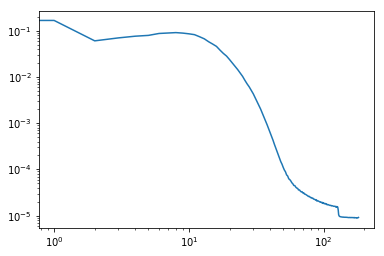

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04338233e-05 9.13110398e-06 8.39377662e-06 ... 9.09958453e-06
  8.39377662e-06 9.13110398e-06]
 [8.98412327e-06 9.37370078e-06 8.81506276e-06 ... 8.49138542e-06
  8.69695486e-06 8.89069179e-06]
 [8.84269139e-06 8.74448415e-06 8.86150610e-06 ... 8.53982419e-06
  8.84133988e-06 8.90601768e-06]
 ...
 [8.76688500e-06 8.81729557e-06 9.15012879e-06 ... 9.16907265e-06
  8.47212959e-06 9.25330005e-06]
 [8.84269139e-06 8.90601768e-06 8.84133988e-06 ... 9.65126583e-06
  8.86150610e-06 8.74448415e-06]
 [8.98412327e-06 8.89069179e-06 8.69695486e-06 ... 8.79776235e-06
  8.81506276e-06 9.37370078e-06]]
el max de R es 181


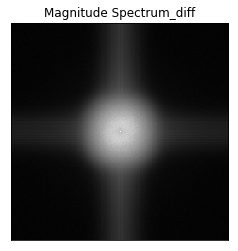

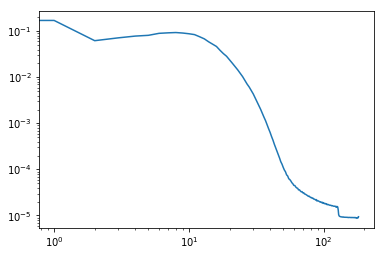

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03673628e-05 9.12012365e-06 8.38268897e-06 ... 9.00118084e-06
  8.38268897e-06 9.12012365e-06]
 [9.22324307e-06 9.12089763e-06 8.76675585e-06 ... 8.57174382e-06
  9.19253216e-06 8.51019013e-06]
 [8.70863369e-06 8.59819465e-06 9.01182102e-06 ... 9.03677665e-06
  8.56568113e-06 9.06309288e-06]
 ...
 [8.75573824e-06 8.58850399e-06 9.16672616e-06 ... 9.25007043e-06
  8.50854485e-06 8.91520449e-06]
 [8.70863369e-06 9.06309288e-06 8.56568113e-06 ... 9.42357474e-06
  9.01182102e-06 8.59819465e-06]
 [9.22324307e-06 8.51019013e-06 9.19253216e-06 ... 8.97519112e-06
  8.76675585e-06 9.12089763e-06]]
el max de R es 181


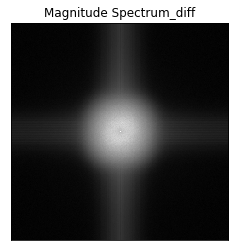

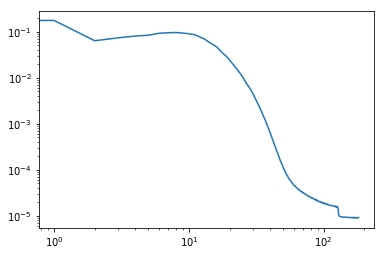

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.10083101e-05 8.99474526e-06 8.54106565e-06 ... 8.84953170e-06
  8.54106565e-06 8.99474526e-06]
 [8.83964276e-06 9.59912904e-06 8.75847218e-06 ... 8.62143770e-06
  9.07651975e-06 8.49062690e-06]
 [8.53258189e-06 8.87456645e-06 8.39136464e-06 ... 8.90028059e-06
  7.97704161e-06 8.43532416e-06]
 ...
 [8.59686133e-06 8.80510834e-06 8.39929999e-06 ... 8.95230642e-06
  8.44701390e-06 8.61502940e-06]
 [8.53258189e-06 8.43532416e-06 7.97704161e-06 ... 9.60768830e-06
  8.39136464e-06 8.87456645e-06]
 [8.83964276e-06 8.49062690e-06 9.07651975e-06 ... 9.12515588e-06
  8.75847218e-06 9.59912904e-06]]
el max de R es 181


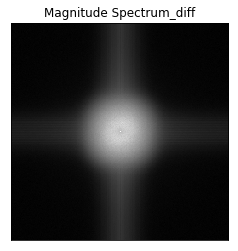

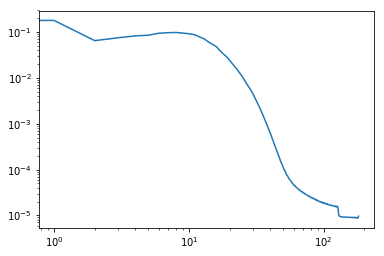

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02113818e-05 9.44026669e-06 8.73120553e-06 ... 8.49887783e-06
  8.73120553e-06 9.44026669e-06]
 [8.82614859e-06 9.40731206e-06 8.68443567e-06 ... 8.68379084e-06
  8.96656275e-06 9.03970704e-06]
 [8.28784960e-06 8.50795095e-06 8.67465405e-06 ... 8.97769405e-06
  8.41154906e-06 8.88989598e-06]
 ...
 [8.85633290e-06 9.17944180e-06 9.41559756e-06 ... 9.18436581e-06
  8.33454669e-06 8.80943935e-06]
 [8.28784960e-06 8.88989598e-06 8.41154906e-06 ... 9.29863199e-06
  8.67465405e-06 8.50795095e-06]
 [8.82614859e-06 9.03970704e-06 8.96656275e-06 ... 9.24586220e-06
  8.68443567e-06 9.40731206e-06]]
el max de R es 181


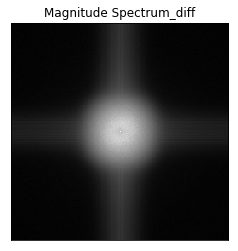

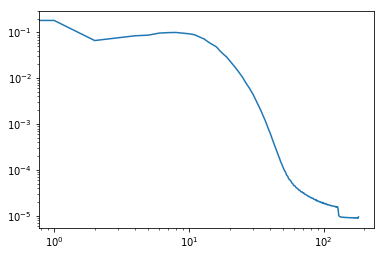

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.10648498e-05 8.91299169e-06 8.36170693e-06 ... 8.36326672e-06
  8.36170693e-06 8.91299169e-06]
 [9.01943349e-06 8.77659386e-06 8.46156490e-06 ... 8.08520781e-06
  8.81237247e-06 8.79664822e-06]
 [8.50351807e-06 9.04272747e-06 8.39081622e-06 ... 8.95934136e-06
  8.54817608e-06 8.81840606e-06]
 ...
 [9.06663445e-06 8.34982347e-06 9.57666452e-06 ... 8.69483301e-06
  8.40864504e-06 8.75445039e-06]
 [8.50351807e-06 8.81840606e-06 8.54817608e-06 ... 9.29114049e-06
  8.39081622e-06 9.04272747e-06]
 [9.01943349e-06 8.79664822e-06 8.81237247e-06 ... 8.88556224e-06
  8.46156490e-06 8.77659386e-06]]
el max de R es 181


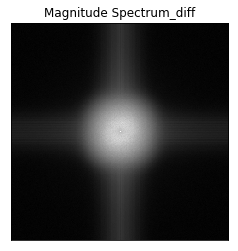

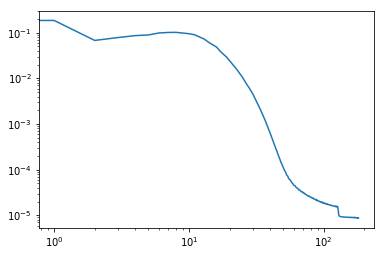

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01083851e-05 9.24310461e-06 8.56208135e-06 ... 8.91277523e-06
  8.56208135e-06 9.24310461e-06]
 [9.01707062e-06 9.48386059e-06 8.11872087e-06 ... 8.80919652e-06
  8.74485340e-06 8.60775708e-06]
 [8.55928556e-06 8.99918541e-06 8.81205779e-06 ... 9.03276668e-06
  9.10853578e-06 8.73023782e-06]
 ...
 [9.01332533e-06 8.78645460e-06 9.04888384e-06 ... 8.76600279e-06
  8.30461613e-06 8.72698092e-06]
 [8.55928556e-06 8.73023782e-06 9.10853578e-06 ... 8.89337207e-06
  8.81205779e-06 8.99918541e-06]
 [9.01707062e-06 8.60775708e-06 8.74485340e-06 ... 8.62134311e-06
  8.11872087e-06 9.48386059e-06]]
el max de R es 181


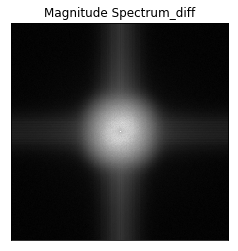

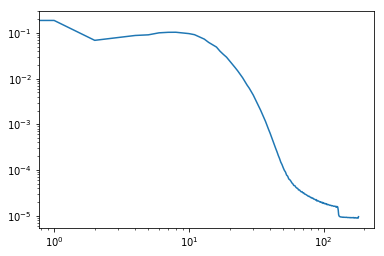

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01077230e-05 9.00643772e-06 9.09598020e-06 ... 8.82662425e-06
  9.09598020e-06 9.00643772e-06]
 [9.06243804e-06 8.53807614e-06 8.56942188e-06 ... 8.60705950e-06
  8.95046924e-06 8.50160177e-06]
 [8.61444551e-06 8.75588285e-06 8.61533317e-06 ... 8.73900626e-06
  8.75786645e-06 8.74143279e-06]
 ...
 [8.38244887e-06 8.44965598e-06 9.22645268e-06 ... 9.29117596e-06
  8.57275245e-06 9.00570831e-06]
 [8.61444551e-06 8.74143279e-06 8.75786645e-06 ... 9.73152328e-06
  8.61533317e-06 8.75588285e-06]
 [9.06243804e-06 8.50160177e-06 8.95046924e-06 ... 8.71963312e-06
  8.56942188e-06 8.53807614e-06]]
el max de R es 181


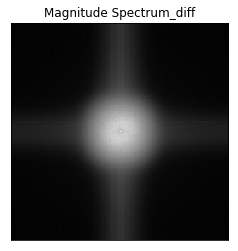

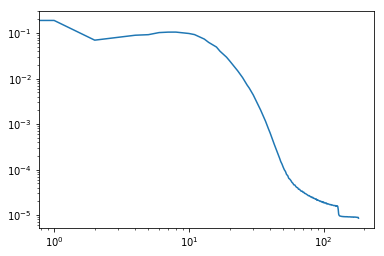

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.07402657e-05 8.66240498e-06 8.08697860e-06 ... 8.79324944e-06
  8.08697860e-06 8.66240498e-06]
 [8.72407418e-06 9.36145898e-06 8.69144878e-06 ... 8.58661861e-06
  8.85429381e-06 8.07691686e-06]
 [8.58290696e-06 8.77805815e-06 8.07252582e-06 ... 9.01454678e-06
  8.81043707e-06 8.82607037e-06]
 ...
 [8.91191303e-06 8.60689306e-06 9.24098367e-06 ... 9.04476747e-06
  8.84491965e-06 8.69695123e-06]
 [8.58290696e-06 8.82607037e-06 8.81043707e-06 ... 9.04898206e-06
  8.07252582e-06 8.77805815e-06]
 [8.72407418e-06 8.07691686e-06 8.85429381e-06 ... 8.73652425e-06
  8.69144878e-06 9.36145898e-06]]
el max de R es 181


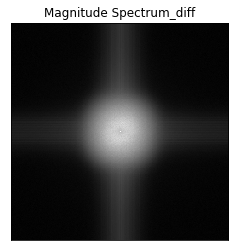

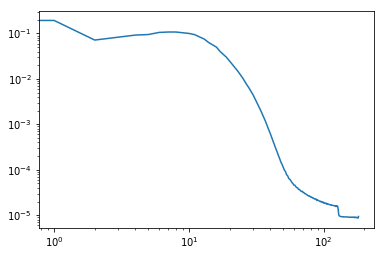

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.08485729e-05 8.74721900e-06 8.32854312e-06 ... 8.65519814e-06
  8.32854312e-06 8.74721900e-06]
 [8.77881212e-06 9.09674600e-06 8.79153049e-06 ... 8.63492551e-06
  8.45312934e-06 8.60705950e-06]
 [8.38566029e-06 8.60943965e-06 8.88898103e-06 ... 8.46636976e-06
  9.06681180e-06 8.86303587e-06]
 ...
 [8.97402788e-06 8.77749881e-06 9.10875042e-06 ... 9.16484441e-06
  8.35152605e-06 8.94318964e-06]
 [8.38566029e-06 8.86303587e-06 9.06681180e-06 ... 9.04775879e-06
  8.88898103e-06 8.60943965e-06]
 [8.77881212e-06 8.60705950e-06 8.45312934e-06 ... 8.96017627e-06
  8.79153049e-06 9.09674600e-06]]
el max de R es 181


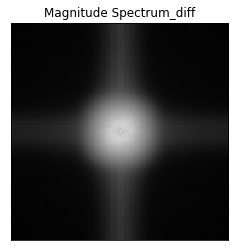

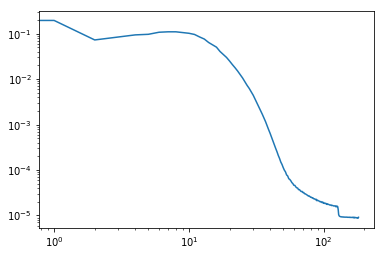

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03847633e-05 9.32309013e-06 8.53458732e-06 ... 8.84455130e-06
  8.53458732e-06 9.32309013e-06]
 [9.01113526e-06 8.90782121e-06 8.48602303e-06 ... 8.09295761e-06
  8.82204858e-06 9.25743643e-06]
 [8.84170640e-06 9.19647118e-06 8.83571829e-06 ... 8.99738370e-06
  8.75389014e-06 8.86247835e-06]
 ...
 [8.82381300e-06 8.77906041e-06 8.44059105e-06 ... 9.00511805e-06
  8.54969767e-06 8.43353519e-06]
 [8.84170640e-06 8.86247835e-06 8.75389014e-06 ... 9.56646272e-06
  8.83571829e-06 9.19647118e-06]
 [9.01113526e-06 9.25743643e-06 8.82204858e-06 ... 9.17777470e-06
  8.48602303e-06 8.90782121e-06]]
el max de R es 181


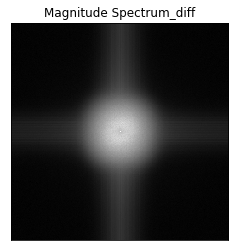

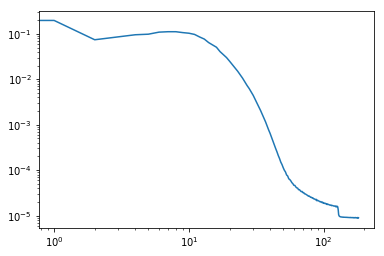

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.12232228e-05 9.45374541e-06 8.50678316e-06 ... 8.99272800e-06
  8.50678316e-06 9.45374541e-06]
 [9.44204839e-06 9.09401570e-06 8.21517733e-06 ... 8.54959762e-06
  8.47362116e-06 8.75025580e-06]
 [9.16378758e-06 8.99058796e-06 8.53941765e-06 ... 8.96749498e-06
  8.64478261e-06 8.75523347e-06]
 ...
 [8.69887663e-06 8.74505622e-06 8.91617583e-06 ... 8.50390006e-06
  8.55543021e-06 9.36439119e-06]
 [9.16378758e-06 8.75523347e-06 8.64478261e-06 ... 9.41419421e-06
  8.53941765e-06 8.99058796e-06]
 [9.44204839e-06 8.75025580e-06 8.47362116e-06 ... 9.04582157e-06
  8.21517733e-06 9.09401570e-06]]
el max de R es 181


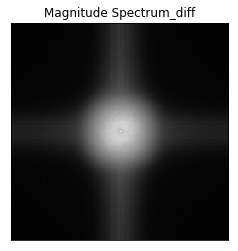

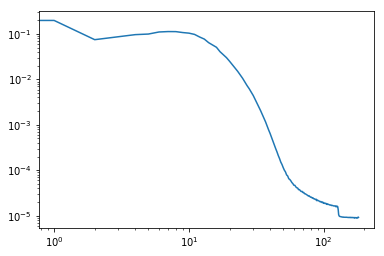

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.13199731e-05 9.63076127e-06 8.31339003e-06 ... 8.41820201e-06
  8.31339003e-06 9.63076127e-06]
 [8.91051786e-06 8.98139751e-06 8.76575814e-06 ... 8.37438438e-06
  8.31352463e-06 9.01711610e-06]
 [9.00448867e-06 9.56024360e-06 8.87820170e-06 ... 9.22213985e-06
  8.54873997e-06 9.00730993e-06]
 ...
 [8.90617230e-06 9.14796510e-06 9.29366070e-06 ... 8.60394084e-06
  8.49934077e-06 8.47267984e-06]
 [9.00448867e-06 9.00730993e-06 8.54873997e-06 ... 9.26680877e-06
  8.87820170e-06 9.56024360e-06]
 [8.91051786e-06 9.01711610e-06 8.31352463e-06 ... 8.82058612e-06
  8.76575814e-06 8.98139751e-06]]
el max de R es 181


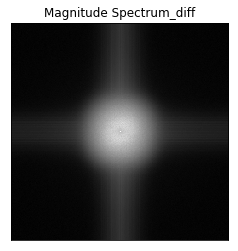

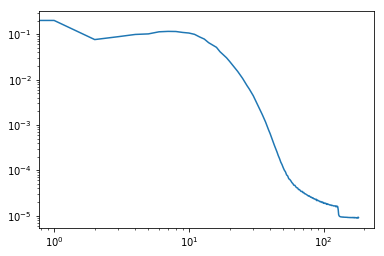

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.06160714e-05 8.77992170e-06 8.55797407e-06 ... 8.57375744e-06
  8.55797407e-06 8.77992170e-06]
 [9.16803856e-06 8.67628205e-06 8.40823759e-06 ... 8.81389315e-06
  8.98471444e-06 8.54803784e-06]
 [8.66880691e-06 9.10435847e-06 8.56154657e-06 ... 9.04192166e-06
  8.84482506e-06 8.80434072e-06]
 ...
 [8.66891151e-06 8.91884793e-06 8.62079469e-06 ... 9.23405969e-06
  8.76890772e-06 8.82119639e-06]
 [8.66880691e-06 8.80434072e-06 8.84482506e-06 ... 9.52729715e-06
  8.56154657e-06 9.10435847e-06]
 [9.16803856e-06 8.54803784e-06 8.98471444e-06 ... 9.21672563e-06
  8.40823759e-06 8.67628205e-06]]
el max de R es 181


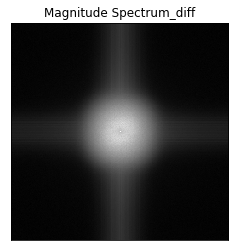

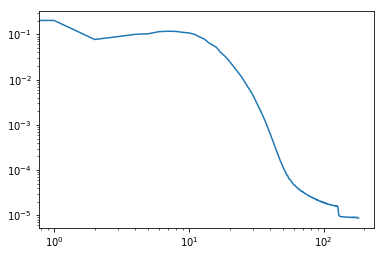

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.12894622e-05 8.89732746e-06 8.18560147e-06 ... 8.82462064e-06
  8.18560147e-06 8.89732746e-06]
 [8.80230891e-06 9.79480683e-06 8.40503617e-06 ... 8.50985180e-06
  8.20129026e-06 8.84419842e-06]
 [9.15114742e-06 9.26412031e-06 8.81229971e-06 ... 8.59344891e-06
  8.87659098e-06 8.38551750e-06]
 ...
 [8.95676840e-06 8.71694829e-06 8.98024064e-06 ... 8.91876334e-06
  8.19258094e-06 8.77719685e-06]
 [9.15114742e-06 8.38551750e-06 8.87659098e-06 ... 9.62274771e-06
  8.81229971e-06 9.26412031e-06]
 [8.80230891e-06 8.84419842e-06 8.20129026e-06 ... 9.21248011e-06
  8.40503617e-06 9.79480683e-06]]
el max de R es 181


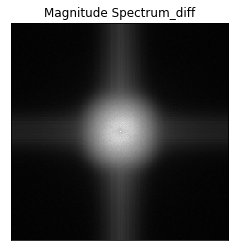

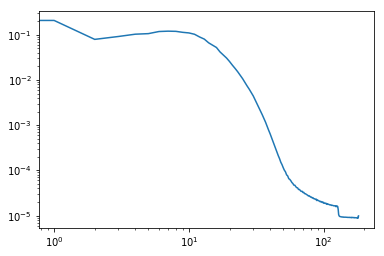

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.06219832e-05 8.90078900e-06 8.85050667e-06 ... 8.64797585e-06
  8.85050667e-06 8.90078900e-06]
 [9.19631020e-06 9.10019662e-06 8.22315360e-06 ... 8.27945041e-06
  9.08197580e-06 8.34724233e-06]
 [8.94977529e-06 8.83328903e-06 9.15560759e-06 ... 9.04809804e-06
  8.76387094e-06 8.95724861e-06]
 ...
 [8.89570492e-06 8.41241763e-06 9.35283697e-06 ... 9.55788164e-06
  7.89376008e-06 8.59306874e-06]
 [8.94977529e-06 8.95724861e-06 8.76387094e-06 ... 9.21233732e-06
  9.15560759e-06 8.83328903e-06]
 [9.19631020e-06 8.34724233e-06 9.08197580e-06 ... 8.92692515e-06
  8.22315360e-06 9.10019662e-06]]
el max de R es 181


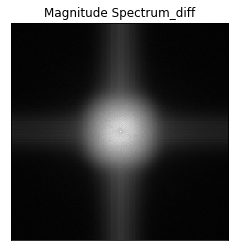

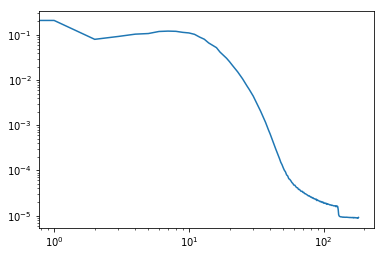

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.09742232e-05 8.88420800e-06 8.18971057e-06 ... 9.15312557e-06
  8.18971057e-06 8.88420800e-06]
 [8.55892358e-06 9.17343095e-06 8.50547531e-06 ... 8.48902800e-06
  9.23485459e-06 8.74710349e-06]
 [9.11748157e-06 9.24462984e-06 8.56982842e-06 ... 8.69948417e-06
  8.85285317e-06 9.21946321e-06]
 ...
 [9.01525254e-06 8.67516610e-06 8.68981169e-06 ... 8.85271129e-06
  8.56874249e-06 8.65947186e-06]
 [9.11748157e-06 9.21946321e-06 8.85285317e-06 ... 9.39321762e-06
  8.56982842e-06 9.24462984e-06]
 [8.55892358e-06 8.74710349e-06 9.23485459e-06 ... 8.98271901e-06
  8.50547531e-06 9.17343095e-06]]
el max de R es 181


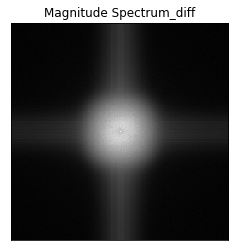

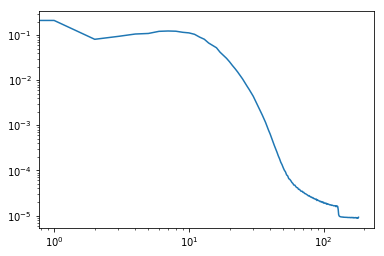

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.00902498e-05 8.94392997e-06 8.94669665e-06 ... 8.54541213e-06
  8.94669665e-06 8.94392997e-06]
 [9.31991235e-06 8.97745849e-06 8.58313615e-06 ... 9.00825307e-06
  8.64609592e-06 8.65146194e-06]
 [8.73282261e-06 9.03091950e-06 8.27029089e-06 ... 9.21130413e-06
  8.72428791e-06 8.64605772e-06]
 ...
 [8.82633594e-06 8.99239876e-06 9.41927374e-06 ... 8.75926617e-06
  8.50027754e-06 8.94239747e-06]
 [8.73282261e-06 8.64605772e-06 8.72428791e-06 ... 9.17307716e-06
  8.27029089e-06 9.03091950e-06]
 [9.31991235e-06 8.65146194e-06 8.64609592e-06 ... 9.07131925e-06
  8.58313615e-06 8.97745849e-06]]
el max de R es 181


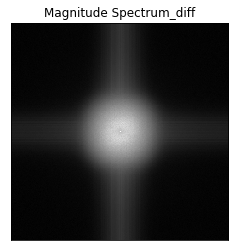

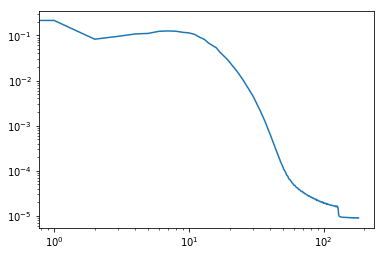

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02523145e-05 9.10374001e-06 8.43442740e-06 ... 8.73094359e-06
  8.43442740e-06 9.10374001e-06]
 [8.80469452e-06 8.60480850e-06 9.10436120e-06 ... 8.84061137e-06
  8.83806024e-06 8.02467548e-06]
 [9.05993784e-06 8.93031847e-06 8.56258430e-06 ... 8.78079118e-06
  9.02965894e-06 9.22408162e-06]
 ...
 [8.94406912e-06 8.87561237e-06 8.87047736e-06 ... 9.20634466e-06
  8.16676675e-06 8.57607938e-06]
 [9.05993784e-06 9.22408162e-06 9.02965894e-06 ... 9.27105339e-06
  8.56258430e-06 8.93031847e-06]
 [8.80469452e-06 8.02467548e-06 8.83806024e-06 ... 8.71961765e-06
  9.10436120e-06 8.60480850e-06]]
el max de R es 181


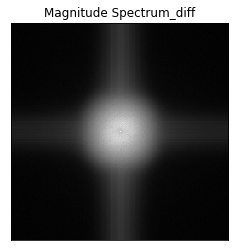

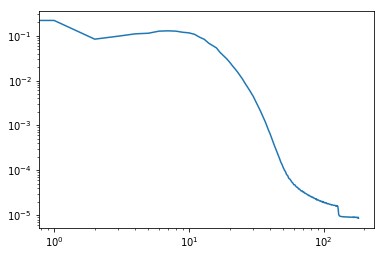

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.94113088e-06 9.19190643e-06 8.31865145e-06 ... 8.51929781e-06
  8.31865145e-06 9.19190643e-06]
 [9.30181250e-06 9.29705766e-06 8.66236678e-06 ... 8.41221572e-06
  9.10213021e-06 8.70048189e-06]
 [8.57034138e-06 8.80986681e-06 8.86809084e-06 ... 9.16744102e-06
  8.63587684e-06 9.23612788e-06]
 ...
 [8.20164041e-06 8.45926661e-06 8.97565951e-06 ... 8.89207968e-06
  8.42883856e-06 8.77589537e-06]
 [8.57034138e-06 9.23612788e-06 8.63587684e-06 ... 9.41950839e-06
  8.86809084e-06 8.80986681e-06]
 [9.30181250e-06 8.70048189e-06 9.10213021e-06 ... 8.70741587e-06
  8.66236678e-06 9.29705766e-06]]
el max de R es 181


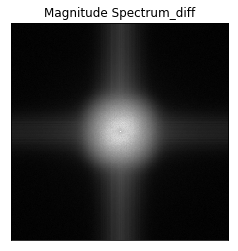

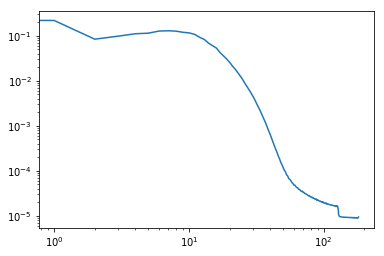

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.99179701e-06 9.07281719e-06 8.29587771e-06 ... 9.02057309e-06
  8.29587771e-06 9.07281719e-06]
 [8.74442958e-06 9.03852742e-06 8.88408431e-06 ... 8.71278007e-06
  8.60261662e-06 8.76310514e-06]
 [8.88315844e-06 8.57484156e-06 8.39539371e-06 ... 8.64004505e-06
  9.18384285e-06 8.64060803e-06]
 ...
 [9.11052484e-06 8.47923366e-06 9.29267026e-06 ... 9.26648863e-06
  8.26235373e-06 8.86269845e-06]
 [8.88315844e-06 8.64060803e-06 9.18384285e-06 ... 9.17885063e-06
  8.39539371e-06 8.57484156e-06]
 [8.74442958e-06 8.76310514e-06 8.60261662e-06 ... 8.75637306e-06
  8.88408431e-06 9.03852742e-06]]
el max de R es 181


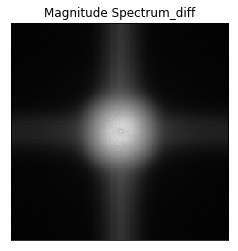

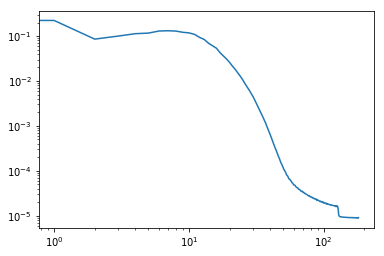

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.08267213e-05 9.40546579e-06 8.30796580e-06 ... 8.55215330e-06
  8.30796580e-06 9.40546579e-06]
 [8.64140566e-06 8.91662057e-06 8.82999757e-06 ... 8.17179171e-06
  8.81278993e-06 8.77596904e-06]
 [9.06173682e-06 9.22467916e-06 8.42431655e-06 ... 9.10232848e-06
  8.58154544e-06 9.21312403e-06]
 ...
 [8.68478674e-06 8.59114789e-06 9.04367516e-06 ... 9.43169380e-06
  8.18281296e-06 8.86145790e-06]
 [9.06173682e-06 9.21312403e-06 8.58154544e-06 ... 9.36210927e-06
  8.42431655e-06 9.22467916e-06]
 [8.64140566e-06 8.77596904e-06 8.81278993e-06 ... 9.17086709e-06
  8.82999757e-06 8.91662057e-06]]
el max de R es 181


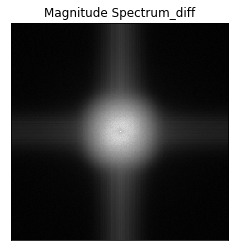

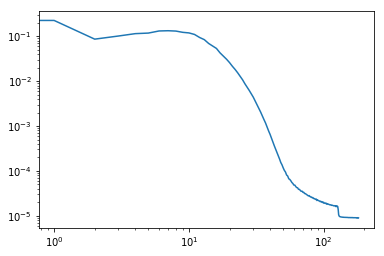

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04814389e-05 9.11805273e-06 8.39954646e-06 ... 8.88803879e-06
  8.39954646e-06 9.11805273e-06]
 [8.48759828e-06 9.35640492e-06 8.63761579e-06 ... 8.56695078e-06
  9.18398746e-06 8.96099664e-06]
 [8.65671700e-06 9.16699719e-06 8.54300197e-06 ... 8.79268737e-06
  8.34744242e-06 9.09497703e-06]
 ...
 [8.82144468e-06 8.85830923e-06 9.52050141e-06 ... 8.99463066e-06
  8.26082669e-06 9.03313685e-06]
 [8.65671700e-06 9.09497703e-06 8.34744242e-06 ... 9.50524918e-06
  8.54300197e-06 9.16699719e-06]
 [8.48759828e-06 8.96099664e-06 9.18398746e-06 ... 8.89979947e-06
  8.63761579e-06 9.35640492e-06]]
el max de R es 181


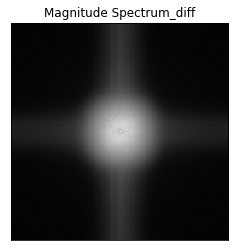

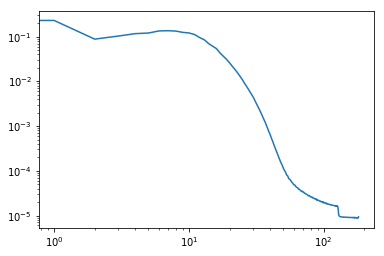

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.85917086e-06 9.19236936e-06 8.53676920e-06 ... 8.56141833e-06
  8.53676920e-06 9.19236936e-06]
 [9.20962430e-06 8.53077654e-06 8.53573238e-06 ... 8.40774919e-06
  8.92511798e-06 8.39310451e-06]
 [8.62127035e-06 8.50960259e-06 8.71283919e-06 ... 8.87895385e-06
  8.53806705e-06 9.41188773e-06]
 ...
 [8.99438601e-06 8.95796711e-06 9.02034662e-06 ... 8.99587303e-06
  8.61638364e-06 8.73285171e-06]
 [8.62127035e-06 9.41188773e-06 8.53806705e-06 ... 9.64904484e-06
  8.71283919e-06 8.50960259e-06]
 [9.20962430e-06 8.39310451e-06 8.92511798e-06 ... 9.08551283e-06
  8.53573238e-06 8.53077654e-06]]
el max de R es 181


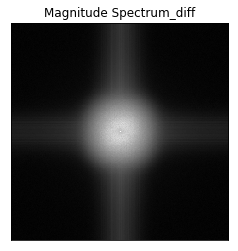

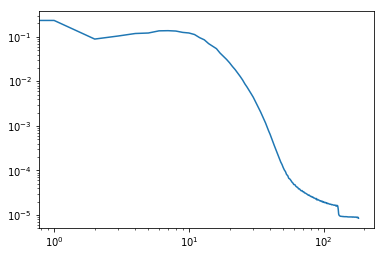

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.07184551e-05 8.65259608e-06 9.02000647e-06 ... 8.97233622e-06
  9.02000647e-06 8.65259608e-06]
 [8.57554096e-06 9.06970308e-06 8.36428353e-06 ... 8.38202868e-06
  9.19311515e-06 8.71184602e-06]
 [9.11110783e-06 8.93852939e-06 8.58935800e-06 ... 9.30576789e-06
  8.96304027e-06 8.65652237e-06]
 ...
 [8.98439703e-06 8.69820269e-06 8.89943203e-06 ... 8.84941892e-06
  8.62519119e-06 8.60759519e-06]
 [9.11110783e-06 8.65652237e-06 8.96304027e-06 ... 9.56985787e-06
  8.58935800e-06 8.93852939e-06]
 [8.57554096e-06 8.71184602e-06 9.19311515e-06 ... 8.72000783e-06
  8.36428353e-06 9.06970308e-06]]
el max de R es 181


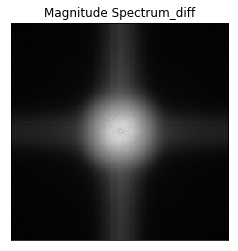

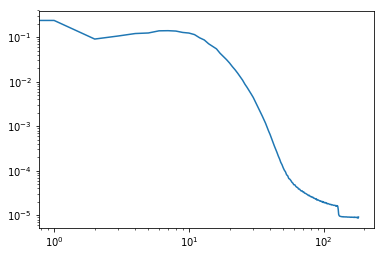

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02457407e-05 9.52285518e-06 8.54241898e-06 ... 8.79880918e-06
  8.54241898e-06 9.52285518e-06]
 [9.30544593e-06 8.99154384e-06 8.76464674e-06 ... 8.84495421e-06
  8.93234028e-06 8.26326868e-06]
 [9.05213165e-06 9.14316024e-06 8.66356095e-06 ... 9.05493744e-06
  8.36521758e-06 9.18518253e-06]
 ...
 [9.09262235e-06 8.77379716e-06 8.88681006e-06 ... 8.75203932e-06
  8.96527035e-06 8.64800768e-06]
 [9.05213165e-06 9.18518253e-06 8.36521758e-06 ... 8.99890983e-06
  8.66356095e-06 9.14316024e-06]
 [9.30544593e-06 8.26326868e-06 8.93234028e-06 ... 8.81067172e-06
  8.76464674e-06 8.99154384e-06]]
el max de R es 181


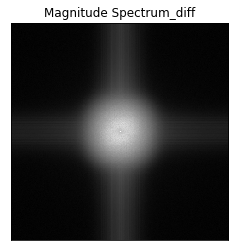

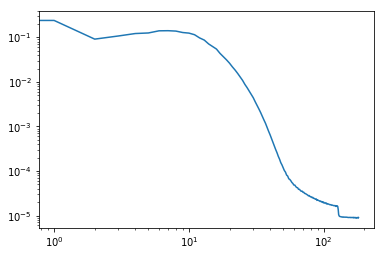

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02607391e-05 9.33385581e-06 8.71213706e-06 ... 8.59282227e-06
  8.71213706e-06 9.33385581e-06]
 [9.08686798e-06 8.74368016e-06 8.57044324e-06 ... 8.69187352e-06
  9.19379818e-06 8.71432349e-06]
 [8.88799877e-06 9.47984427e-06 8.81704818e-06 ... 8.36612435e-06
  8.62535035e-06 8.73471981e-06]
 ...
 [9.31648719e-06 8.90887895e-06 8.85079771e-06 ... 8.93350534e-06
  8.29194232e-06 8.86011003e-06]
 [8.88799877e-06 8.73471981e-06 8.62535035e-06 ... 9.20808543e-06
  8.81704818e-06 9.47984427e-06]
 [9.08686798e-06 8.71432349e-06 9.19379818e-06 ... 8.59345982e-06
  8.57044324e-06 8.74368016e-06]]
el max de R es 181


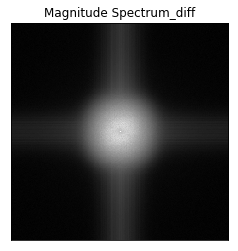

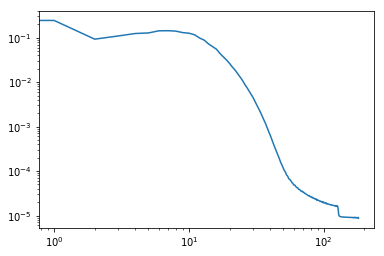

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03395760e-05 8.91093441e-06 8.63561581e-06 ... 9.24173037e-06
  8.63561581e-06 8.91093441e-06]
 [8.97364316e-06 9.16651516e-06 8.62864727e-06 ... 8.27074109e-06
  9.11365987e-06 8.64009507e-06]
 [8.48926538e-06 8.84230030e-06 8.90221872e-06 ... 9.18503247e-06
  8.56770384e-06 8.54154314e-06]
 ...
 [8.51420100e-06 8.69483392e-06 9.25865879e-06 ... 8.88571776e-06
  8.20762671e-06 9.02046850e-06]
 [8.48926538e-06 8.54154314e-06 8.56770384e-06 ... 8.98418693e-06
  8.90221872e-06 8.84230030e-06]
 [8.97364316e-06 8.64009507e-06 9.11365987e-06 ... 9.05857905e-06
  8.62864727e-06 9.16651516e-06]]
el max de R es 181


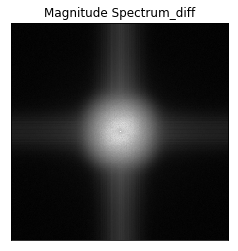

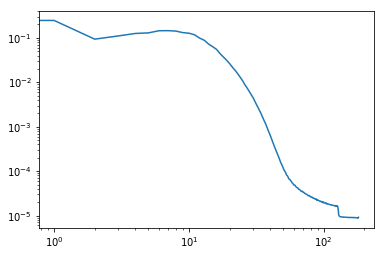

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.99322674e-06 9.26511075e-06 8.55742110e-06 ... 8.65233869e-06
  8.55742110e-06 9.26511075e-06]
 [8.91706350e-06 8.92084336e-06 8.35488663e-06 ... 8.52974699e-06
  8.91466607e-06 8.61072840e-06]
 [8.85188092e-06 8.69507949e-06 8.47765477e-06 ... 8.90761294e-06
  8.67488779e-06 8.97793325e-06]
 ...
 [8.66851860e-06 9.04257377e-06 8.84505789e-06 ... 8.89368312e-06
  8.53570327e-06 8.98563303e-06]
 [8.85188092e-06 8.97793325e-06 8.67488779e-06 ... 9.22794970e-06
  8.47765477e-06 8.69507949e-06]
 [8.91706350e-06 8.61072840e-06 8.91466607e-06 ... 9.20780258e-06
  8.35488663e-06 8.92084336e-06]]
el max de R es 181


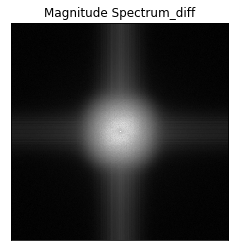

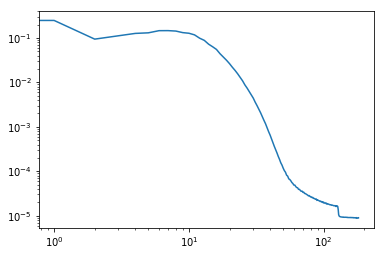

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01269916e-05 9.38806716e-06 8.20335299e-06 ... 8.92379649e-06
  8.20335299e-06 9.38806716e-06]
 [8.90819047e-06 8.65371658e-06 8.54905011e-06 ... 8.30970021e-06
  9.11356983e-06 8.51951700e-06]
 [8.90587489e-06 8.58292606e-06 8.70676922e-06 ... 9.07277717e-06
  8.70940585e-06 9.26450866e-06]
 ...
 [9.05472461e-06 8.39399218e-06 8.89802595e-06 ... 9.12321048e-06
  9.13800613e-06 8.57881514e-06]
 [8.90587489e-06 9.26450866e-06 8.70940585e-06 ... 9.42582483e-06
  8.70676922e-06 8.58292606e-06]
 [8.90819047e-06 8.51951700e-06 9.11356983e-06 ... 9.10322342e-06
  8.54905011e-06 8.65371658e-06]]
el max de R es 181


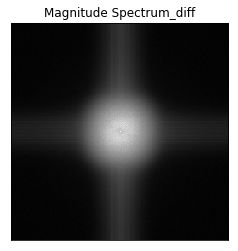

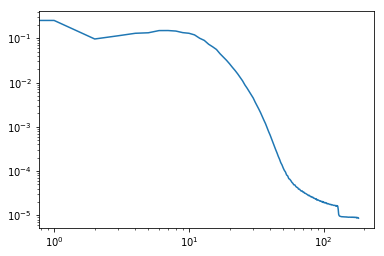

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01413380e-05 9.20135062e-06 7.92598075e-06 ... 8.94073764e-06
  7.92598075e-06 9.20135062e-06]
 [8.99124825e-06 9.86351188e-06 8.68218831e-06 ... 8.81860706e-06
  8.37148218e-06 8.46018247e-06]
 [8.66238770e-06 8.57927898e-06 8.87975330e-06 ... 9.16546287e-06
  8.65856055e-06 8.96849815e-06]
 ...
 [9.07399681e-06 9.10966537e-06 8.94623736e-06 ... 9.05039997e-06
  8.47812953e-06 8.90492447e-06]
 [8.66238770e-06 8.96849815e-06 8.65856055e-06 ... 9.00627037e-06
  8.87975330e-06 8.57927898e-06]
 [8.99124825e-06 8.46018247e-06 8.37148218e-06 ... 9.23869811e-06
  8.68218831e-06 9.86351188e-06]]
el max de R es 181


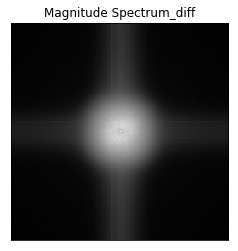

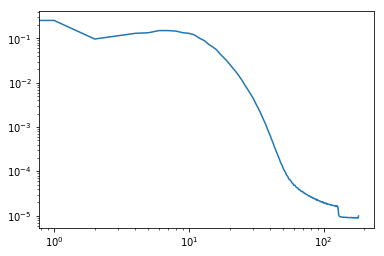

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04955097e-05 9.18566639e-06 8.19524757e-06 ... 8.81512096e-06
  8.19524757e-06 9.18566639e-06]
 [9.24577216e-06 9.55309588e-06 9.01292333e-06 ... 8.79674917e-06
  9.06611058e-06 8.35727769e-06]
 [8.17421369e-06 8.95650555e-06 9.39570873e-06 ... 9.48123125e-06
  8.42735244e-06 9.16750832e-06]
 ...
 [8.58337444e-06 8.51329969e-06 9.27459860e-06 ... 9.01936437e-06
  8.36509753e-06 8.58571821e-06]
 [8.17421369e-06 9.16750832e-06 8.42735244e-06 ... 9.28279042e-06
  9.39570873e-06 8.95650555e-06]
 [9.24577216e-06 8.35727769e-06 9.06611058e-06 ... 8.91194486e-06
  9.01292333e-06 9.55309588e-06]]
el max de R es 181


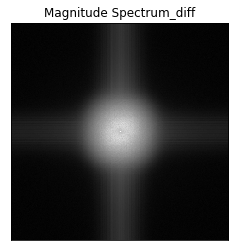

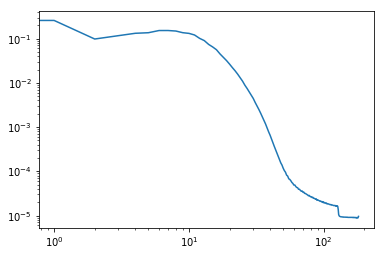

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05735871e-05 9.24854612e-06 8.69104588e-06 ... 8.86822272e-06
  8.69104588e-06 9.24854612e-06]
 [9.39117672e-06 9.10278504e-06 8.50338529e-06 ... 8.89649800e-06
  8.85025929e-06 8.86066482e-06]
 [8.65219499e-06 8.70350505e-06 8.97131940e-06 ... 9.13677195e-06
  8.62075012e-06 8.81111919e-06]
 ...
 [8.82887343e-06 8.42860481e-06 8.71964585e-06 ... 8.92153639e-06
  8.34359162e-06 8.87337683e-06]
 [8.65219499e-06 8.81111919e-06 8.62075012e-06 ... 9.23271455e-06
  8.97131940e-06 8.70350505e-06]
 [9.39117672e-06 8.86066482e-06 8.85025929e-06 ... 9.23473544e-06
  8.50338529e-06 9.10278504e-06]]
el max de R es 181


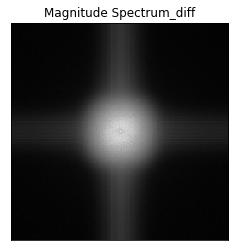

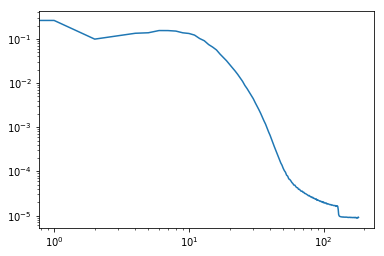

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04533246e-05 9.01983731e-06 8.64965932e-06 ... 8.10404254e-06
  8.64965932e-06 9.01983731e-06]
 [8.93051129e-06 9.41174676e-06 8.53172060e-06 ... 8.08755249e-06
  8.99188126e-06 8.05200852e-06]
 [8.86975704e-06 8.76659215e-06 8.76545892e-06 ... 9.20876573e-06
  8.67873223e-06 8.89334297e-06]
 ...
 [8.99704355e-06 8.61977333e-06 9.44915428e-06 ... 9.35589833e-06
  8.23848131e-06 8.90012234e-06]
 [8.86975704e-06 8.89334297e-06 8.67873223e-06 ... 9.47393710e-06
  8.76545892e-06 8.76659215e-06]
 [8.93051129e-06 8.05200852e-06 8.99188126e-06 ... 9.05269280e-06
  8.53172060e-06 9.41174676e-06]]
el max de R es 181


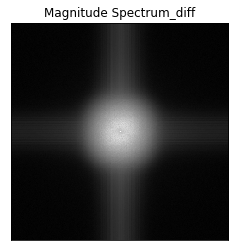

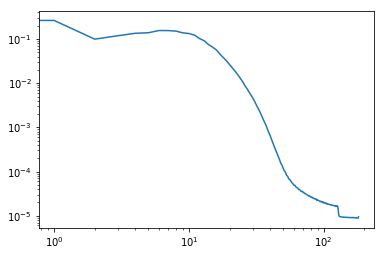

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.07433816e-05 8.88753038e-06 8.35572428e-06 ... 8.65146376e-06
  8.35572428e-06 8.88753038e-06]
 [8.94201185e-06 9.64827541e-06 8.90949468e-06 ... 8.36195613e-06
  8.80564403e-06 9.16367026e-06]
 [9.03387263e-06 8.86109228e-06 8.84592100e-06 ... 8.83180655e-06
  8.43957969e-06 8.91022682e-06]
 ...
 [8.64440517e-06 8.85584632e-06 8.92987828e-06 ... 9.21334959e-06
  8.50657398e-06 8.96586698e-06]
 [9.03387263e-06 8.91022682e-06 8.43957969e-06 ... 9.01414205e-06
  8.84592100e-06 8.86109228e-06]
 [8.94201185e-06 9.16367026e-06 8.80564403e-06 ... 8.74269699e-06
  8.90949468e-06 9.64827541e-06]]
el max de R es 181


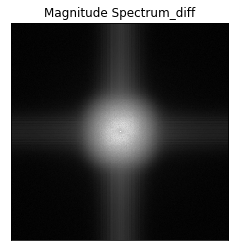

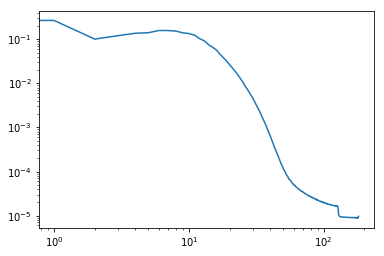

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.78833850e-06 9.22731670e-06 8.81896358e-06 ... 8.73409135e-06
  8.81896358e-06 9.22731670e-06]
 [9.13911845e-06 9.75049261e-06 8.31386478e-06 ... 8.34712318e-06
  9.13297936e-06 8.59272404e-06]
 [8.42618738e-06 8.80856169e-06 9.03502951e-06 ... 9.20617276e-06
  8.45986324e-06 9.07755384e-06]
 ...
 [8.80591779e-06 7.96789573e-06 9.04414537e-06 ... 9.24051619e-06
  8.21215781e-06 9.24538017e-06]
 [8.42618738e-06 9.07755384e-06 8.45986324e-06 ... 9.84034614e-06
  9.03502951e-06 8.80856169e-06]
 [9.13911845e-06 8.59272404e-06 9.13297936e-06 ... 9.04329954e-06
  8.31386478e-06 9.75049261e-06]]
el max de R es 181


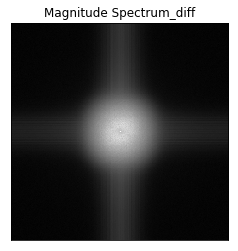

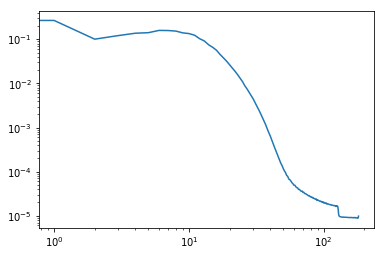

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04169558e-05 9.53306153e-06 8.01000897e-06 ... 8.93201741e-06
  8.01000897e-06 9.53306153e-06]
 [8.47293086e-06 9.16234330e-06 8.71841530e-06 ... 8.26225096e-06
  8.52333869e-06 8.37734206e-06]
 [8.90284900e-06 8.84079327e-06 8.79584150e-06 ... 9.13550321e-06
  8.54571408e-06 9.07806771e-06]
 ...
 [9.07747562e-06 8.04648062e-06 9.59083081e-06 ... 9.09232404e-06
  8.76995637e-06 8.60396631e-06]
 [8.90284900e-06 9.07806771e-06 8.54571408e-06 ... 9.33780757e-06
  8.79584150e-06 8.84079327e-06]
 [8.47293086e-06 8.37734206e-06 8.52333869e-06 ... 8.52104677e-06
  8.71841530e-06 9.16234330e-06]]
el max de R es 181


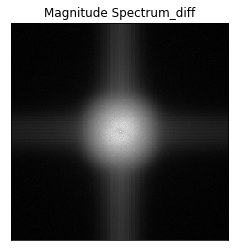

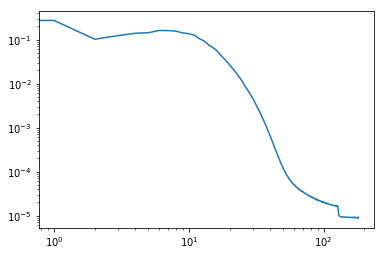

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.88307875e-06 9.30443639e-06 8.50145807e-06 ... 8.13351744e-06
  8.50145807e-06 9.30443639e-06]
 [8.98577764e-06 9.77022228e-06 8.94979621e-06 ... 8.26101405e-06
  9.16383397e-06 8.71580960e-06]
 [8.67309427e-06 9.10698964e-06 8.50854758e-06 ... 9.11517327e-06
  8.94425739e-06 9.14413795e-06]
 ...
 [8.95062203e-06 8.79202616e-06 9.15482269e-06 ... 9.56038912e-06
  8.22194488e-06 9.43717350e-06]
 [8.67309427e-06 9.14413795e-06 8.94425739e-06 ... 9.53752624e-06
  8.50854758e-06 9.10698964e-06]
 [8.98577764e-06 8.71580960e-06 9.16383397e-06 ... 8.99114366e-06
  8.94979621e-06 9.77022228e-06]]
el max de R es 181


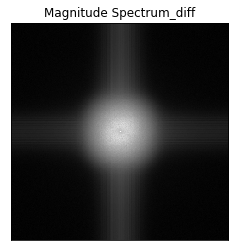

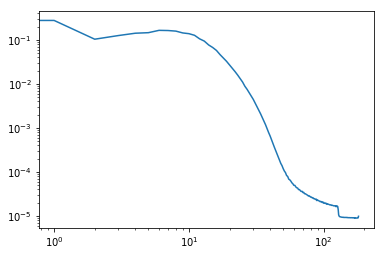

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01412779e-05 9.10077688e-06 8.20181958e-06 ... 8.46766216e-06
  8.20181958e-06 9.10077688e-06]
 [8.78787887e-06 8.76004742e-06 8.70263466e-06 ... 8.35493302e-06
  9.12934411e-06 8.73658701e-06]
 [8.94890763e-06 9.29199268e-06 9.13854365e-06 ... 9.37383356e-06
  8.93212928e-06 8.61390618e-06]
 ...
 [8.98935468e-06 8.71730026e-06 9.07733647e-06 ... 9.10618019e-06
  8.44024544e-06 8.47069441e-06]
 [8.94890763e-06 8.61390618e-06 8.93212928e-06 ... 9.10900508e-06
  9.13854365e-06 9.29199268e-06]
 [8.78787887e-06 8.73658701e-06 9.12934411e-06 ... 8.69843916e-06
  8.70263466e-06 8.76004742e-06]]
el max de R es 181


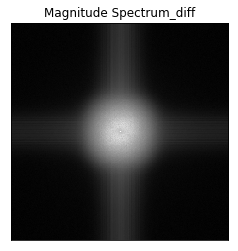

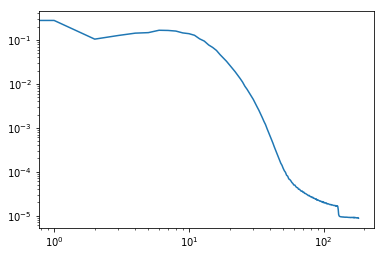

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02722324e-05 9.38848370e-06 8.80352673e-06 ... 9.39451365e-06
  8.80352673e-06 9.38848370e-06]
 [8.81913002e-06 8.93126980e-06 8.76742160e-06 ... 8.75152000e-06
  9.10328072e-06 8.93307606e-06]
 [8.49738535e-06 8.96120127e-06 8.44485658e-06 ... 8.39403947e-06
  8.74222042e-06 8.66049231e-06]
 ...
 [8.38940468e-06 8.93183824e-06 9.17603120e-06 ... 9.01119074e-06
  8.29506462e-06 8.71929842e-06]
 [8.49738535e-06 8.66049231e-06 8.74222042e-06 ... 9.18043679e-06
  8.44485658e-06 8.96120127e-06]
 [8.81913002e-06 8.93307606e-06 9.10328072e-06 ... 9.08288530e-06
  8.76742160e-06 8.93126980e-06]]
el max de R es 181


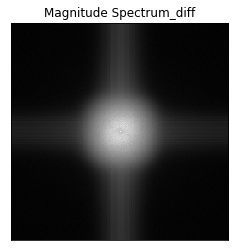

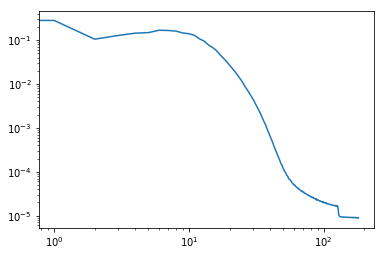

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.86071063e-06 8.93567631e-06 8.28505836e-06 ... 8.89273815e-06
  8.28505836e-06 8.93567631e-06]
 [8.62831075e-06 9.41969120e-06 8.69185078e-06 ... 8.29340115e-06
  9.17454236e-06 8.36936761e-06]
 [9.02263855e-06 8.89065814e-06 8.57061877e-06 ... 9.05250454e-06
  8.69397445e-06 9.06714013e-06]
 ...
 [8.76525792e-06 8.91548916e-06 9.23615153e-06 ... 9.41746839e-06
  8.68123243e-06 9.36628385e-06]
 [9.02263855e-06 9.06714013e-06 8.69397445e-06 ... 9.11129518e-06
  8.57061877e-06 8.89065814e-06]
 [8.62831075e-06 8.36936761e-06 9.17454236e-06 ... 8.71707107e-06
  8.69185078e-06 9.41969120e-06]]
el max de R es 181


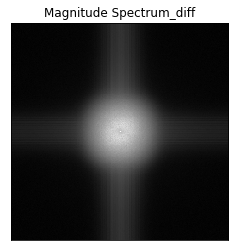

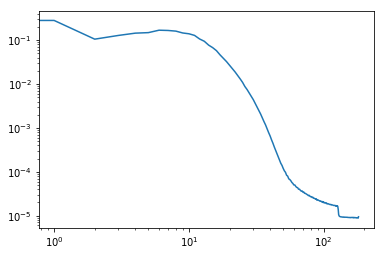

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.06882726e-05 9.28893769e-06 8.50305514e-06 ... 8.78734591e-06
  8.50305514e-06 9.28893769e-06]
 [8.55184589e-06 9.36148172e-06 8.62098204e-06 ... 9.01186195e-06
  8.69678843e-06 8.68380448e-06]
 [8.74971647e-06 8.60904493e-06 8.81385222e-06 ... 9.14926022e-06
  9.05934667e-06 8.60350974e-06]
 ...
 [9.25051427e-06 8.90442243e-06 9.26791927e-06 ... 8.83996745e-06
  8.56194856e-06 9.10197650e-06]
 [8.74971647e-06 8.60350974e-06 9.05934667e-06 ... 9.48144225e-06
  8.81385222e-06 8.60904493e-06]
 [8.55184589e-06 8.68380448e-06 8.69678843e-06 ... 8.90766842e-06
  8.62098204e-06 9.36148172e-06]]
el max de R es 181


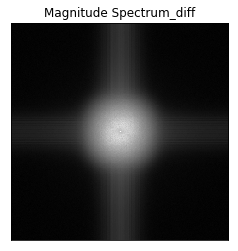

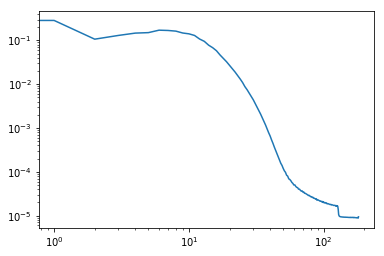

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02977619e-05 9.12194446e-06 8.23777918e-06 ... 8.78330684e-06
  8.23777918e-06 9.12194446e-06]
 [9.57066186e-06 9.63647199e-06 8.73691533e-06 ... 8.17397995e-06
  8.77382899e-06 8.50879951e-06]
 [9.00621035e-06 8.63112291e-06 8.39847053e-06 ... 9.33210140e-06
  8.67968993e-06 9.19818194e-06]
 ...
 [8.70491749e-06 8.43030102e-06 9.05844718e-06 ... 9.17829766e-06
  8.50461947e-06 8.98581311e-06]
 [9.00621035e-06 9.19818194e-06 8.67968993e-06 ... 9.56670010e-06
  8.39847053e-06 8.63112291e-06]
 [9.57066186e-06 8.50879951e-06 8.77382899e-06 ... 9.22065465e-06
  8.73691533e-06 9.63647199e-06]]
el max de R es 181


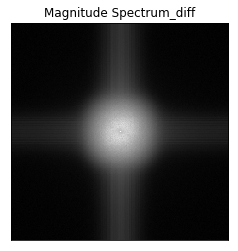

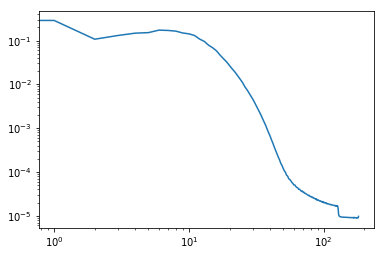

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01801288e-05 9.20543425e-06 8.26282940e-06 ... 8.63369314e-06
  8.26282940e-06 9.20543425e-06]
 [9.00560372e-06 9.62250942e-06 8.43561611e-06 ... 8.22902257e-06
  9.14357770e-06 8.42913687e-06]
 [8.89531384e-06 9.10207564e-06 8.45474733e-06 ... 9.17108264e-06
  8.50331799e-06 9.13896019e-06]
 ...
 [8.88185423e-06 9.01902604e-06 9.40197606e-06 ... 8.89022704e-06
  8.34390812e-06 8.95566063e-06]
 [8.89531384e-06 9.13896019e-06 8.50331799e-06 ... 9.46533601e-06
  8.45474733e-06 9.10207564e-06]
 [9.00560372e-06 8.42913687e-06 9.14357770e-06 ... 8.15818203e-06
  8.43561611e-06 9.62250942e-06]]
el max de R es 181


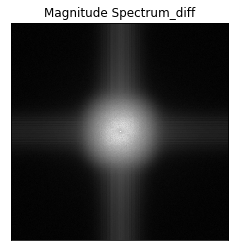

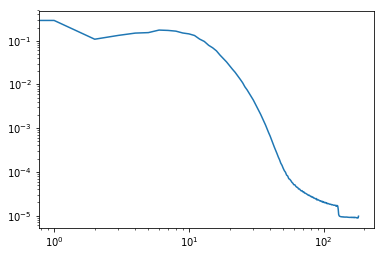

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.00665320e-05 9.55115593e-06 8.61672288e-06 ... 8.95638732e-06
  8.61672288e-06 9.55115593e-06]
 [8.69768337e-06 9.18139995e-06 8.42469308e-06 ... 9.07455160e-06
  8.65210859e-06 8.56809402e-06]
 [8.58724707e-06 9.02443844e-06 8.80996049e-06 ... 9.41901271e-06
  8.26890755e-06 9.12802716e-06]
 ...
 [9.07466620e-06 8.38038341e-06 9.11077314e-06 ... 9.06955393e-06
  7.93532126e-06 9.17248690e-06]
 [8.58724707e-06 9.12802716e-06 8.26890755e-06 ... 9.71310965e-06
  8.80996049e-06 9.02443844e-06]
 [8.69768337e-06 8.56809402e-06 8.65210859e-06 ... 8.78767332e-06
  8.42469308e-06 9.18139995e-06]]
el max de R es 181


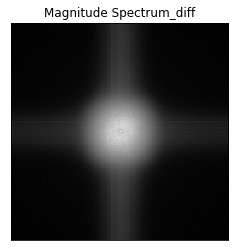

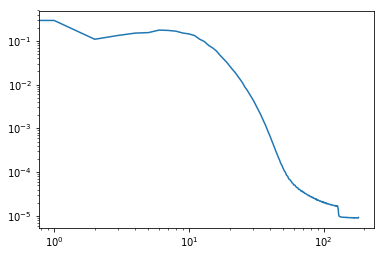

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03080574e-05 9.49130299e-06 8.59018019e-06 ... 8.54560767e-06
  8.59018019e-06 9.49130299e-06]
 [8.65453421e-06 9.32589137e-06 8.90114279e-06 ... 9.00474333e-06
  8.91746276e-06 8.71792963e-06]
 [8.94165896e-06 8.96961956e-06 8.36713571e-06 ... 8.65963284e-06
  8.30553199e-06 8.58074509e-06]
 ...
 [8.51061577e-06 9.08355105e-06 8.76833019e-06 ... 9.13893382e-06
  8.59869579e-06 9.12267387e-06]
 [8.94165896e-06 8.58074509e-06 8.30553199e-06 ... 9.00483883e-06
  8.36713571e-06 8.96961956e-06]
 [8.65453421e-06 8.71792963e-06 8.91746276e-06 ... 8.90531373e-06
  8.90114279e-06 9.32589137e-06]]
el max de R es 181


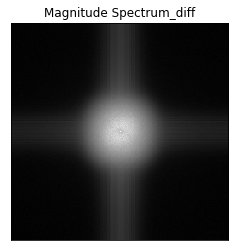

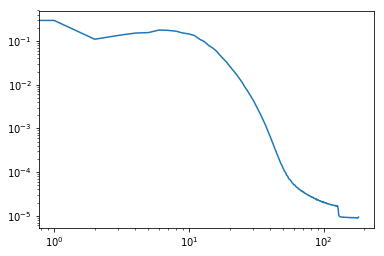

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01083569e-05 9.08379388e-06 8.27892836e-06 ... 8.95792891e-06
  8.27892836e-06 9.08379388e-06]
 [9.15102646e-06 9.42589213e-06 8.73011231e-06 ... 8.27683652e-06
  8.88212435e-06 8.20171317e-06]
 [8.93058677e-06 9.02914780e-06 8.81483447e-06 ... 8.92724256e-06
  8.70929489e-06 8.83800567e-06]
 ...
 [8.82152744e-06 8.23960818e-06 9.31652357e-06 ... 9.17753368e-06
  8.83479788e-06 8.93234846e-06]
 [8.93058677e-06 8.83800567e-06 8.70929489e-06 ... 9.48630350e-06
  8.81483447e-06 9.02914780e-06]
 [9.15102646e-06 8.20171317e-06 8.88212435e-06 ... 9.19689046e-06
  8.73011231e-06 9.42589213e-06]]
el max de R es 181


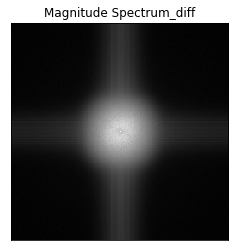

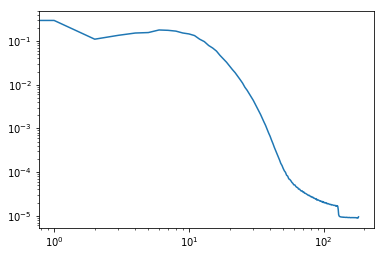

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.06278621e-05 9.32341845e-06 8.45632803e-06 ... 8.60169439e-06
  8.45632803e-06 9.32341845e-06]
 [8.69190899e-06 8.97158407e-06 8.50411107e-06 ... 8.45784416e-06
  8.83337270e-06 8.64109552e-06]
 [8.76776085e-06 9.20860475e-06 8.68824281e-06 ... 8.83594748e-06
  8.40428675e-06 8.96747770e-06]
 ...
 [8.88140949e-06 8.92580010e-06 9.43181385e-06 ... 8.78645551e-06
  8.23283335e-06 9.01704061e-06]
 [8.76776085e-06 8.96747770e-06 8.40428675e-06 ... 9.29206362e-06
  8.68824281e-06 9.20860475e-06]
 [8.69190899e-06 8.64109552e-06 8.83337270e-06 ... 8.67741983e-06
  8.50411107e-06 8.97158407e-06]]
el max de R es 181


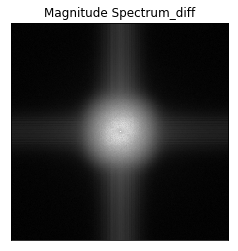

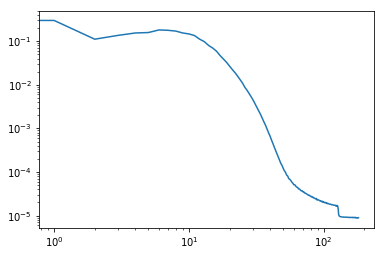

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01900941e-05 8.86483213e-06 8.58821113e-06 ... 8.79566142e-06
  8.58821113e-06 8.86483213e-06]
 [8.99009137e-06 9.21486117e-06 9.13354597e-06 ... 8.55608778e-06
  9.28633017e-06 8.86418366e-06]
 [8.69997984e-06 8.93911238e-06 8.70875374e-06 ... 9.18352362e-06
  8.56532915e-06 8.98165763e-06]
 ...
 [8.87760325e-06 8.47191313e-06 8.60004639e-06 ... 9.19577542e-06
  7.90566901e-06 9.03998080e-06]
 [8.69997984e-06 8.98165763e-06 8.56532915e-06 ... 9.18829664e-06
  8.70875374e-06 8.93911238e-06]
 [8.99009137e-06 8.86418366e-06 9.28633017e-06 ... 9.05058459e-06
  9.13354597e-06 9.21486117e-06]]
el max de R es 181


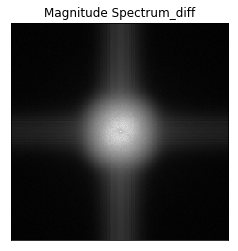

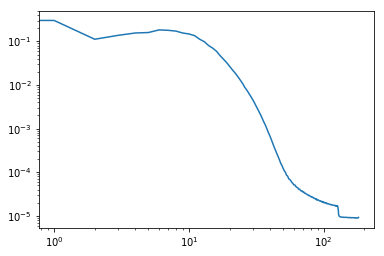

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04987175e-05 9.49557852e-06 8.98836333e-06 ... 8.35472747e-06
  8.98836333e-06 9.49557852e-06]
 [9.31319482e-06 9.14706743e-06 8.89841158e-06 ... 8.50343349e-06
  8.73601039e-06 8.68776260e-06]
 [8.90699903e-06 8.80838434e-06 8.69191535e-06 ... 8.95084031e-06
  8.69717314e-06 9.13568510e-06]
 ...
 [8.96216807e-06 8.73041063e-06 9.32268449e-06 ... 9.09720256e-06
  8.47947285e-06 8.48571835e-06]
 [8.90699903e-06 9.13568510e-06 8.69717314e-06 ... 9.31445993e-06
  8.69191535e-06 8.80838434e-06]
 [9.31319482e-06 8.68776260e-06 8.73601039e-06 ... 8.42956706e-06
  8.89841158e-06 9.14706743e-06]]
el max de R es 181


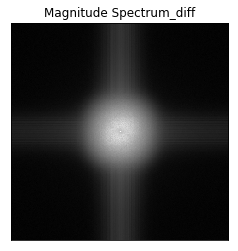

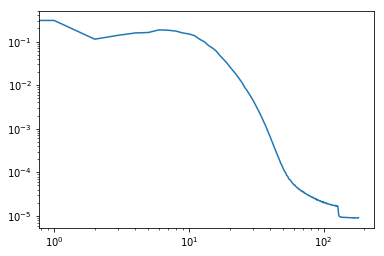

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03702732e-05 8.86455018e-06 8.73462341e-06 ... 8.24146082e-06
  8.73462341e-06 8.86455018e-06]
 [9.29056841e-06 8.84098972e-06 8.54841437e-06 ... 8.68643565e-06
  8.97542304e-06 8.79771414e-06]
 [8.98456437e-06 8.59422380e-06 9.04536500e-06 ... 9.09243408e-06
  8.81588585e-06 8.64651884e-06]
 ...
 [9.13842723e-06 8.65427864e-06 9.11010284e-06 ... 9.24690630e-06
  8.39034510e-06 9.76927640e-06]
 [8.98456437e-06 8.64651884e-06 8.81588585e-06 ... 9.73315036e-06
  9.04536500e-06 8.59422380e-06]
 [9.29056841e-06 8.79771414e-06 8.97542304e-06 ... 8.56152383e-06
  8.54841437e-06 8.84098972e-06]]
el max de R es 181


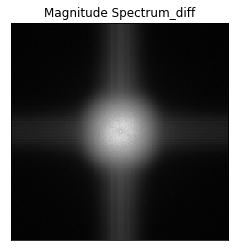

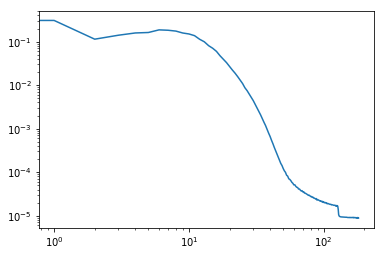

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03194006e-05 9.10161543e-06 8.52828362e-06 ... 8.79712752e-06
  8.52828362e-06 9.10161543e-06]
 [8.83981920e-06 9.51652692e-06 8.64463982e-06 ... 8.45456361e-06
  9.16401950e-06 8.41757628e-06]
 [8.96850634e-06 9.17610578e-06 8.67413746e-06 ... 8.74816851e-06
  8.82457425e-06 8.85322243e-06]
 ...
 [8.82545100e-06 8.64143476e-06 9.24853248e-06 ... 8.97469909e-06
  8.27478470e-06 8.72725104e-06]
 [8.96850634e-06 8.85322243e-06 8.82457425e-06 ... 9.29779981e-06
  8.67413746e-06 9.17610578e-06]
 [8.83981920e-06 8.41757628e-06 9.16401950e-06 ... 8.39043605e-06
  8.64463982e-06 9.51652692e-06]]
el max de R es 181


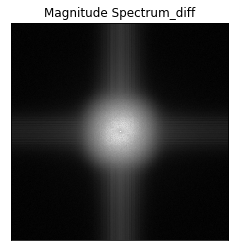

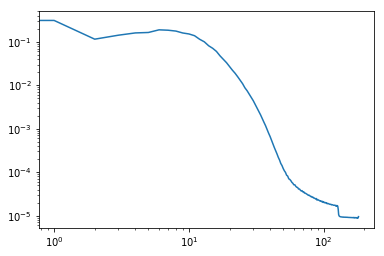

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02009462e-05 8.98406233e-06 8.42917962e-06 ... 8.82884888e-06
  8.42917962e-06 8.98406233e-06]
 [9.11720053e-06 9.28460668e-06 8.74143734e-06 ... 8.54874634e-06
  8.76950708e-06 8.32836122e-06]
 [8.73815043e-06 9.35743083e-06 9.08841866e-06 ... 8.95212997e-06
  8.41028850e-06 8.56720271e-06]
 ...
 [8.80002608e-06 8.53800339e-06 9.14177053e-06 ... 9.11722600e-06
  8.24401832e-06 8.81255164e-06]
 [8.73815043e-06 8.56720271e-06 8.41028850e-06 ... 9.37202913e-06
  9.08841866e-06 9.35743083e-06]
 [9.11720053e-06 8.32836122e-06 8.76950708e-06 ... 9.11219831e-06
  8.74143734e-06 9.28460668e-06]]
el max de R es 181


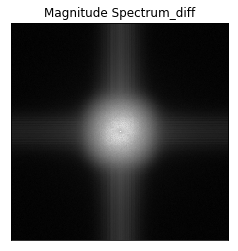

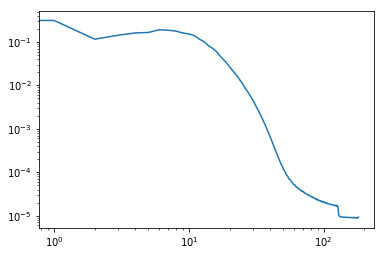

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.65359141e-06 9.00275154e-06 8.51926143e-06 ... 8.50641663e-06
  8.51926143e-06 9.00275154e-06]
 [8.60479213e-06 9.96172912e-06 8.50382821e-06 ... 8.49249227e-06
  8.93464585e-06 8.42753798e-06]
 [8.53460187e-06 8.77136699e-06 8.65637503e-06 ... 9.10069775e-06
  8.19398701e-06 8.96473921e-06]
 ...
 [8.30793488e-06 8.20281184e-06 8.82443601e-06 ... 9.14595057e-06
  8.19938123e-06 9.02830561e-06]
 [8.53460187e-06 8.96473921e-06 8.19398701e-06 ... 9.62150443e-06
  8.65637503e-06 8.77136699e-06]
 [8.60479213e-06 8.42753798e-06 8.93464585e-06 ... 9.25559380e-06
  8.50382821e-06 9.96172912e-06]]
el max de R es 181


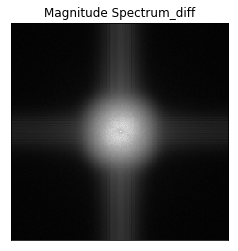

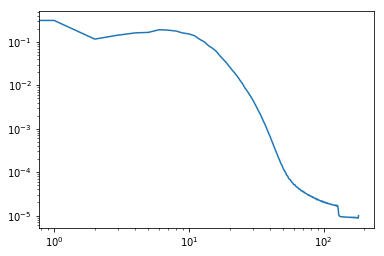

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04930568e-05 9.36525248e-06 8.46530020e-06 ... 8.64981121e-06
  8.46530020e-06 9.36525248e-06]
 [8.66031496e-06 8.69122596e-06 8.40441044e-06 ... 8.65940729e-06
  9.12136693e-06 8.63577316e-06]
 [8.82833501e-06 8.97538393e-06 8.87535771e-06 ... 8.96788515e-06
  8.48434138e-06 8.98831604e-06]
 ...
 [8.45004797e-06 8.74739908e-06 9.10473773e-06 ... 9.06852620e-06
  8.34105413e-06 8.24354811e-06]
 [8.82833501e-06 8.98831604e-06 8.48434138e-06 ... 9.03671298e-06
  8.87535771e-06 8.97538393e-06]
 [8.66031496e-06 8.63577316e-06 9.12136693e-06 ... 9.03009004e-06
  8.40441044e-06 8.69122596e-06]]
el max de R es 181


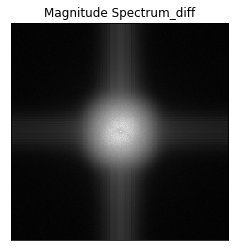

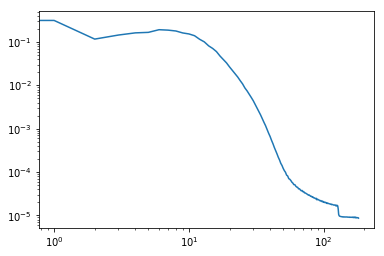

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02363192e-05 9.18806654e-06 8.31184661e-06 ... 8.60860200e-06
  8.31184661e-06 9.18806654e-06]
 [9.16008867e-06 9.03159889e-06 8.44345413e-06 ... 8.82389031e-06
  9.01438216e-06 8.48115815e-06]
 [8.69334690e-06 9.13585336e-06 9.01814474e-06 ... 8.90950560e-06
  8.66164555e-06 8.78744686e-06]
 ...
 [9.02981265e-06 9.14210796e-06 9.13332042e-06 ... 8.67388371e-06
  8.81561300e-06 8.65724633e-06]
 [8.69334690e-06 8.78744686e-06 8.66164555e-06 ... 9.20445473e-06
  9.01814474e-06 9.13585336e-06]
 [9.16008867e-06 8.48115815e-06 9.01438216e-06 ... 9.11352527e-06
  8.44345413e-06 9.03159889e-06]]
el max de R es 181


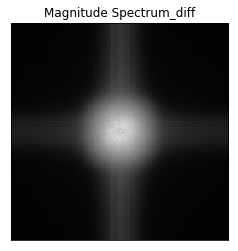

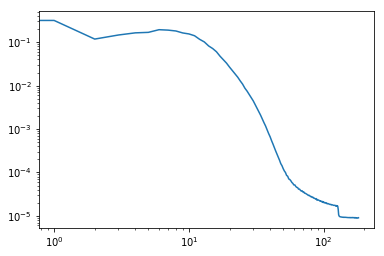

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.60740090e-06 9.18441947e-06 8.30903991e-06 ... 8.91636319e-06
  8.30903991e-06 9.18441947e-06]
 [9.17289253e-06 9.48578145e-06 8.51536333e-06 ... 8.91517448e-06
  9.33340016e-06 8.43954967e-06]
 [8.90237970e-06 8.26900032e-06 9.08437323e-06 ... 9.14343127e-06
  8.63713740e-06 8.86451562e-06]
 ...
 [8.45646628e-06 8.45713930e-06 8.99982115e-06 ... 9.31190789e-06
  8.20658715e-06 8.84299425e-06]
 [8.90237970e-06 8.86451562e-06 8.63713740e-06 ... 9.34952914e-06
  9.08437323e-06 8.26900032e-06]
 [9.17289253e-06 8.43954967e-06 9.33340016e-06 ... 9.27075962e-06
  8.51536333e-06 9.48578145e-06]]
el max de R es 181


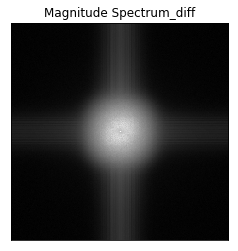

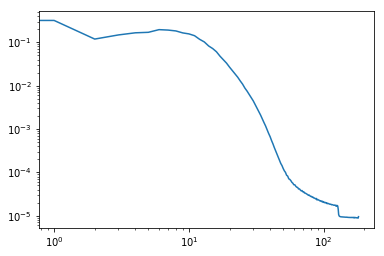

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.01674104e-05 9.24729648e-06 8.79028994e-06 ... 8.71080738e-06
  8.79028994e-06 9.24729648e-06]
 [8.38062260e-06 9.15568762e-06 8.14423402e-06 ... 8.45671912e-06
  8.94089226e-06 8.30277168e-06]
 [8.60497948e-06 9.23869538e-06 8.97209338e-06 ... 9.00079795e-06
  8.55008238e-06 9.02569627e-06]
 ...
 [8.90840511e-06 8.67917879e-06 9.34427590e-06 ... 9.05464640e-06
  8.41399105e-06 9.23229345e-06]
 [8.60497948e-06 9.02569627e-06 8.55008238e-06 ... 9.29236467e-06
  8.97209338e-06 9.23869538e-06]
 [8.38062260e-06 8.30277168e-06 8.94089226e-06 ... 8.80632706e-06
  8.14423402e-06 9.15568762e-06]]
el max de R es 181


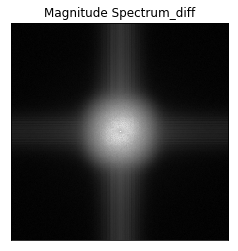

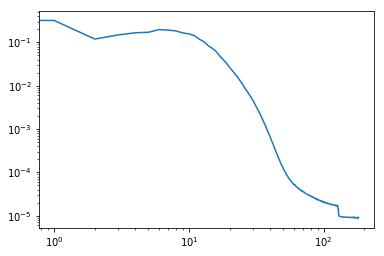

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.00250518e-05 9.19481499e-06 8.48623768e-06 ... 9.41129110e-06
  8.48623768e-06 9.19481499e-06]
 [9.14017164e-06 8.97618702e-06 8.78525043e-06 ... 8.62275556e-06
  8.85835925e-06 8.33105332e-06]
 [8.76610829e-06 9.57556676e-06 9.15439341e-06 ... 9.18333990e-06
  8.35849369e-06 9.27920155e-06]
 ...
 [8.80940661e-06 8.42862573e-06 9.59485260e-06 ... 9.07011236e-06
  8.45320119e-06 8.51033292e-06]
 [8.76610829e-06 9.27920155e-06 8.35849369e-06 ... 9.22816798e-06
  9.15439341e-06 9.57556676e-06]
 [9.14017164e-06 8.33105332e-06 8.85835925e-06 ... 8.87273745e-06
  8.78525043e-06 8.97618702e-06]]
el max de R es 181


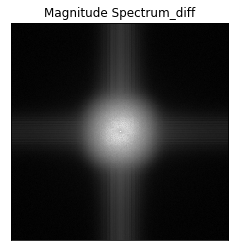

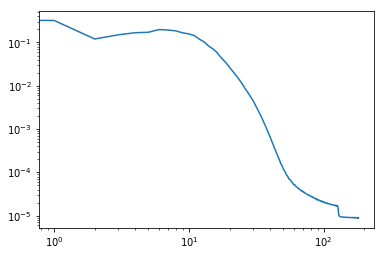

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.73161877e-06 9.10627750e-06 8.53654910e-06 ... 8.91269974e-06
  8.53654910e-06 9.10627750e-06]
 [8.61424815e-06 9.64530591e-06 8.25444295e-06 ... 8.56543011e-06
  9.11085317e-06 8.60333876e-06]
 [9.28339614e-06 8.55658254e-06 8.85159716e-06 ... 8.39737095e-06
  8.69799896e-06 8.65588117e-06]
 ...
 [8.77181537e-06 9.12690211e-06 9.06207060e-06 ... 9.55061660e-06
  8.69639734e-06 9.18944261e-06]
 [9.28339614e-06 8.65588117e-06 8.69799896e-06 ... 9.48391335e-06
  8.85159716e-06 8.55658254e-06]
 [8.61424815e-06 8.60333876e-06 9.11085317e-06 ... 9.02750435e-06
  8.25444295e-06 9.64530591e-06]]
el max de R es 181


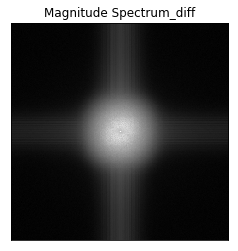

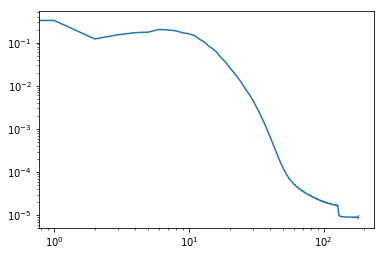

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02980930e-05 9.11453390e-06 8.32768455e-06 ... 9.12349606e-06
  8.32768455e-06 9.11453390e-06]
 [8.82303902e-06 9.26816119e-06 8.70281565e-06 ... 8.23184655e-06
  9.26902976e-06 8.83597750e-06]
 [8.38010965e-06 9.02452302e-06 8.18036369e-06 ... 9.59162298e-06
  8.64707363e-06 9.09015489e-06]
 ...
 [8.94156710e-06 9.03254386e-06 9.69649409e-06 ... 9.10739436e-06
  8.32181649e-06 8.90081537e-06]
 [8.38010965e-06 9.09015489e-06 8.64707363e-06 ... 9.25092536e-06
  8.18036369e-06 9.02452302e-06]
 [8.82303902e-06 8.83597750e-06 9.26902976e-06 ... 8.68624102e-06
  8.70281565e-06 9.26816119e-06]]
el max de R es 181


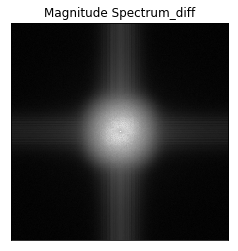

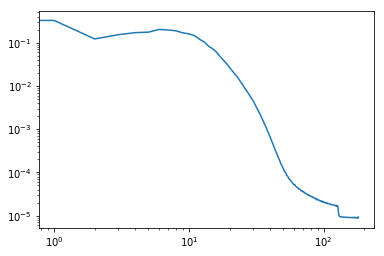

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03000048e-05 8.98165035e-06 9.04293756e-06 ... 8.55299731e-06
  9.04293756e-06 8.98165035e-06]
 [8.99659062e-06 9.38166158e-06 8.54131031e-06 ... 8.58834483e-06
  8.72546570e-06 8.98202688e-06]
 [9.01718977e-06 9.07382582e-06 8.88807335e-06 ... 8.66333994e-06
  9.02925149e-06 9.31897739e-06]
 ...
 [8.56749921e-06 8.44988972e-06 9.36227934e-06 ... 9.01223484e-06
  8.53481743e-06 9.13748318e-06]
 [9.01718977e-06 9.31897739e-06 9.02925149e-06 ... 9.08756829e-06
  8.88807335e-06 9.07382582e-06]
 [8.99659062e-06 8.98202688e-06 8.72546570e-06 ... 8.93232300e-06
  8.54131031e-06 9.38166158e-06]]
el max de R es 181


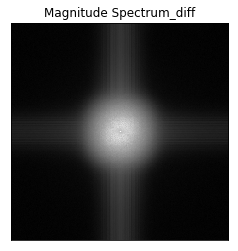

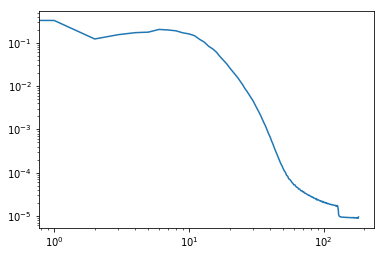

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.96142080e-06 8.99761380e-06 8.57073428e-06 ... 8.97351038e-06
  8.57073428e-06 8.99761380e-06]
 [8.94895311e-06 9.45554257e-06 8.59714419e-06 ... 8.90072442e-06
  9.13766780e-06 9.12015821e-06]
 [8.86939597e-06 9.08933907e-06 9.29023554e-06 ... 8.94297682e-06
  8.67372091e-06 9.43402119e-06]
 ...
 [9.15167038e-06 8.68757252e-06 9.51034963e-06 ... 9.17937632e-06
  8.48774835e-06 8.90074625e-06]
 [8.86939597e-06 9.43402119e-06 8.67372091e-06 ... 9.59122372e-06
  9.29023554e-06 9.08933907e-06]
 [8.94895311e-06 9.12015821e-06 9.13766780e-06 ... 8.77751609e-06
  8.59714419e-06 9.45554257e-06]]
el max de R es 181


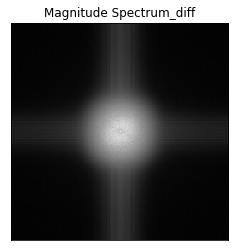

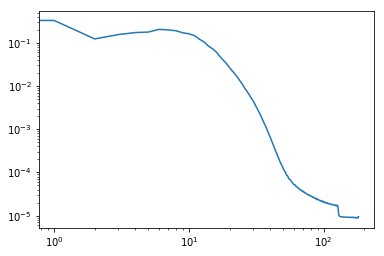

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.09023695e-05 9.18067053e-06 8.57968007e-06 ... 8.56777297e-06
  8.57968007e-06 9.18067053e-06]
 [8.82967561e-06 9.51894253e-06 8.96966412e-06 ... 8.57574560e-06
  8.84494693e-06 8.71063185e-06]
 [9.27414476e-06 8.48768377e-06 8.72463806e-06 ... 8.95513858e-06
  8.65414859e-06 9.18814931e-06]
 ...
 [8.61954777e-06 8.64304366e-06 9.51420589e-06 ... 9.54415191e-06
  7.96770837e-06 8.82876793e-06]
 [9.27414476e-06 9.18814931e-06 8.65414859e-06 ... 9.49689274e-06
  8.72463806e-06 8.48768377e-06]
 [8.82967561e-06 8.71063185e-06 8.84494693e-06 ... 8.94750974e-06
  8.96966412e-06 9.51894253e-06]]
el max de R es 181


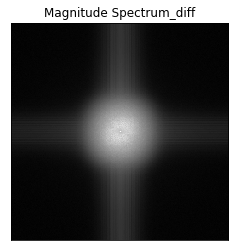

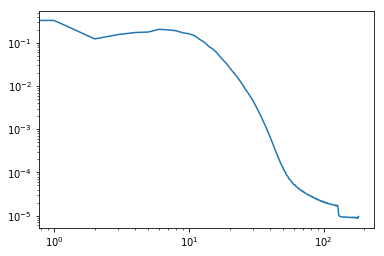

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04571573e-05 9.40179052e-06 8.63670994e-06 ... 9.13011354e-06
  8.63670994e-06 9.40179052e-06]
 [8.77561524e-06 8.93761080e-06 8.58055682e-06 ... 8.21741287e-06
  9.22181425e-06 8.74504894e-06]
 [9.24788128e-06 8.79707204e-06 8.89744479e-06 ... 8.99669612e-06
  8.85372901e-06 9.25920176e-06]
 ...
 [9.08177662e-06 8.31680973e-06 8.97636255e-06 ... 9.20094590e-06
  8.47262163e-06 8.52692119e-06]
 [9.24788128e-06 9.25920176e-06 8.85372901e-06 ... 9.60119814e-06
  8.89744479e-06 8.79707204e-06]
 [8.77561524e-06 8.74504894e-06 9.22181425e-06 ... 8.77778348e-06
  8.58055682e-06 8.93761080e-06]]
el max de R es 181


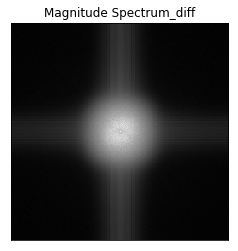

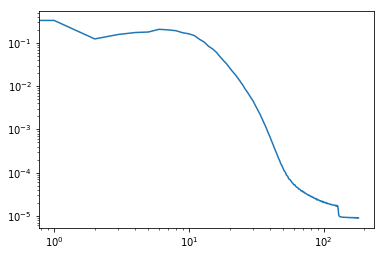

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03419197e-05 9.05307297e-06 8.28237080e-06 ... 9.08358652e-06
  8.28237080e-06 9.05307297e-06]
 [9.13056920e-06 9.44161729e-06 8.74089437e-06 ... 9.07390404e-06
  9.15189776e-06 8.40401844e-06]
 [9.02682405e-06 8.41567726e-06 8.66254504e-06 ... 8.59677584e-06
  8.83904249e-06 8.78971787e-06]
 ...
 [8.97843893e-06 8.95705398e-06 9.19124795e-06 ... 9.19049580e-06
  8.11938207e-06 9.03575801e-06]
 [9.02682405e-06 8.78971787e-06 8.83904249e-06 ... 9.19530885e-06
  8.66254504e-06 8.41567726e-06]
 [9.13056920e-06 8.40401844e-06 9.15189776e-06 ... 9.24652522e-06
  8.74089437e-06 9.44161729e-06]]
el max de R es 181


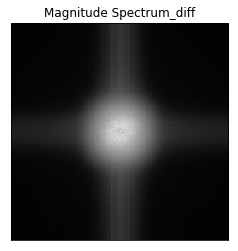

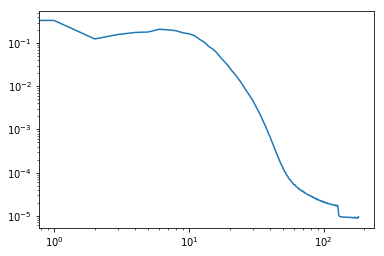

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.66342122e-06 8.91885702e-06 8.67179097e-06 ... 8.73598492e-06
  8.67179097e-06 8.91885702e-06]
 [8.90826141e-06 8.82489076e-06 8.82078530e-06 ... 8.49742446e-06
  9.35119260e-06 8.67630388e-06]
 [8.59126067e-06 8.90171850e-06 9.15924556e-06 ... 9.41102553e-06
  8.47441333e-06 8.52343601e-06]
 ...
 [9.10437939e-06 8.44278657e-06 9.40172322e-06 ... 9.09234950e-06
  8.58786461e-06 8.74238867e-06]
 [8.59126067e-06 8.52343601e-06 8.47441333e-06 ... 9.45986176e-06
  9.15924556e-06 8.90171850e-06]
 [8.90826141e-06 8.67630388e-06 9.35119260e-06 ... 8.66820119e-06
  8.82078530e-06 8.82489076e-06]]
el max de R es 181


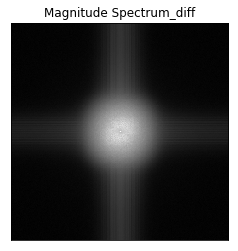

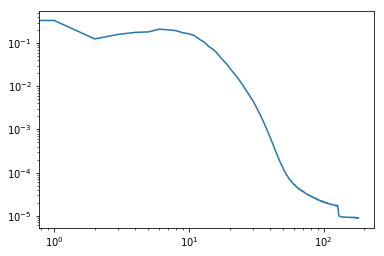

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.99743497e-06 9.13579424e-06 8.48687978e-06 ... 8.70898930e-06
  8.48687978e-06 9.13579424e-06]
 [9.33485899e-06 8.86979979e-06 8.63322202e-06 ... 8.75726892e-06
  9.45318789e-06 8.51311870e-06]
 [9.09205028e-06 8.68809002e-06 8.99866063e-06 ... 8.82619042e-06
  8.60386263e-06 8.74839861e-06]
 ...
 [8.86697399e-06 8.93294055e-06 9.21093033e-06 ... 9.00930718e-06
  8.58800558e-06 9.08030779e-06]
 [9.09205028e-06 8.74839861e-06 8.60386263e-06 ... 9.27362089e-06
  8.99866063e-06 8.68809002e-06]
 [9.33485899e-06 8.51311870e-06 9.45318789e-06 ... 8.90625324e-06
  8.63322202e-06 8.86979979e-06]]
el max de R es 181


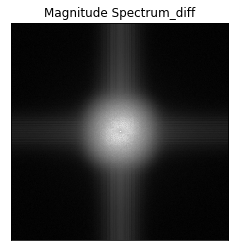

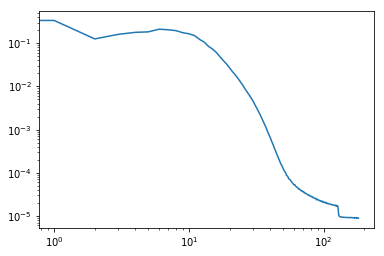

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.53316339e-06 9.34736272e-06 8.78555329e-06 ... 9.01329349e-06
  8.78555329e-06 9.34736272e-06]
 [8.82032782e-06 9.28982718e-06 8.65276434e-06 ... 8.33273043e-06
  9.22275740e-06 8.20555124e-06]
 [8.68157895e-06 8.60437558e-06 8.49505523e-06 ... 8.74768284e-06
  8.88175873e-06 8.90947558e-06]
 ...
 [9.04719764e-06 8.53653182e-06 9.40805967e-06 ... 9.19176728e-06
  8.36469735e-06 9.11449933e-06]
 [8.68157895e-06 8.90947558e-06 8.88175873e-06 ... 9.04869194e-06
  8.49505523e-06 8.60437558e-06]
 [8.82032782e-06 8.20555124e-06 9.22275740e-06 ... 8.57581017e-06
  8.65276434e-06 9.28982718e-06]]
el max de R es 181


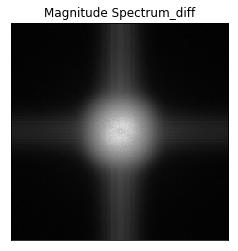

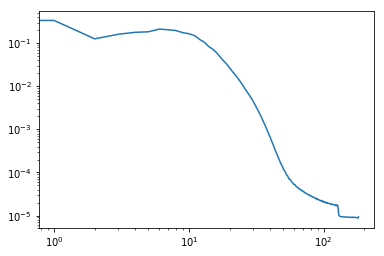

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.81146877e-06 8.94969526e-06 8.30704539e-06 ... 8.69585892e-06
  8.30704539e-06 8.94969526e-06]
 [9.06635069e-06 9.35872504e-06 8.90099454e-06 ... 8.71024531e-06
  9.11785901e-06 8.78353876e-06]
 [8.88380328e-06 8.83609573e-06 8.65652873e-06 ... 9.47819353e-06
  8.66729170e-06 8.68702500e-06]
 ...
 [9.12063842e-06 8.87548686e-06 9.37449568e-06 ... 9.18426940e-06
  8.15998555e-06 8.99923907e-06]
 [8.88380328e-06 8.68702500e-06 8.66729170e-06 ... 9.23317475e-06
  8.65652873e-06 8.83609573e-06]
 [9.06635069e-06 8.78353876e-06 9.11785901e-06 ... 8.90625961e-06
  8.90099454e-06 9.35872504e-06]]
el max de R es 181


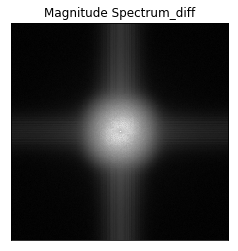

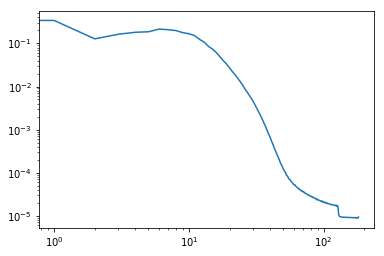

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04619521e-05 9.08987658e-06 8.33684862e-06 ... 8.60622822e-06
  8.33684862e-06 9.08987658e-06]
 [8.99652969e-06 8.97427708e-06 9.14011707e-06 ... 8.07346078e-06
  9.43362738e-06 8.74676243e-06]
 [8.93122888e-06 8.33385002e-06 8.85882764e-06 ... 8.73156296e-06
  8.64522553e-06 8.85446661e-06]
 ...
 [8.66688515e-06 8.66370829e-06 9.15183227e-06 ... 9.50429057e-06
  8.32970181e-06 8.60153523e-06]
 [8.93122888e-06 8.85446661e-06 8.64522553e-06 ... 9.22917388e-06
  8.85882764e-06 8.33385002e-06]
 [8.99652969e-06 8.74676243e-06 9.43362738e-06 ... 8.50334527e-06
  9.14011707e-06 8.97427708e-06]]
el max de R es 181


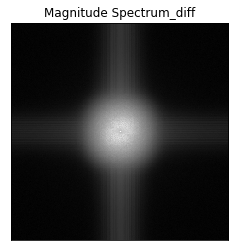

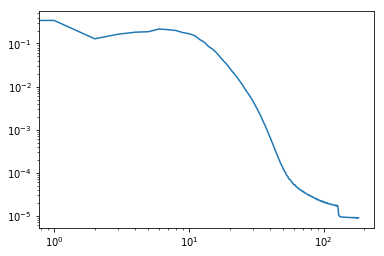

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05049003e-05 9.13819986e-06 8.12719009e-06 ... 8.94524601e-06
  8.12719009e-06 9.13819986e-06]
 [9.26331541e-06 9.17369107e-06 8.62882462e-06 ... 8.83651137e-06
  9.14810698e-06 8.25505231e-06]
 [8.72803412e-06 9.33948286e-06 8.72698274e-06 ... 9.41714006e-06
  8.65183938e-06 8.85452482e-06]
 ...
 [9.00286250e-06 8.15805470e-06 9.11587722e-06 ... 9.28641930e-06
  8.38741471e-06 8.81839787e-06]
 [8.72803412e-06 8.85452482e-06 8.65183938e-06 ... 9.16301178e-06
  8.72698274e-06 9.33948286e-06]
 [9.26331541e-06 8.25505231e-06 9.14810698e-06 ... 8.99743281e-06
  8.62882462e-06 9.17369107e-06]]
el max de R es 181


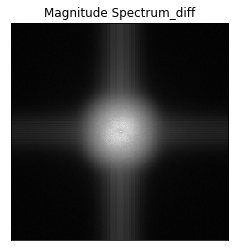

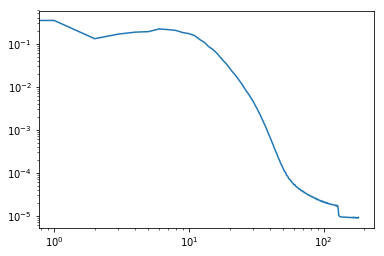

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.08426811e-05 9.12574160e-06 8.53342772e-06 ... 8.71701195e-06
  8.53342772e-06 9.12574160e-06]
 [8.68787538e-06 9.43373107e-06 8.53123129e-06 ... 9.05293382e-06
  9.28776990e-06 8.87112583e-06]
 [9.20635284e-06 8.31724901e-06 8.81395135e-06 ... 9.04055196e-06
  8.89787134e-06 8.80998959e-06]
 ...
 [8.71047450e-06 8.60727596e-06 9.43604664e-06 ... 8.56078350e-06
  8.88272734e-06 9.21068204e-06]
 [9.20635284e-06 8.80998959e-06 8.89787134e-06 ... 9.04331228e-06
  8.81395135e-06 8.31724901e-06]
 [8.68787538e-06 8.87112583e-06 9.28776990e-06 ... 8.72606233e-06
  8.53123129e-06 9.43373107e-06]]
el max de R es 181


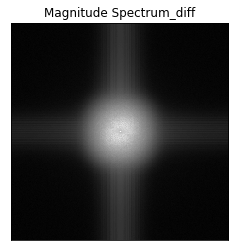

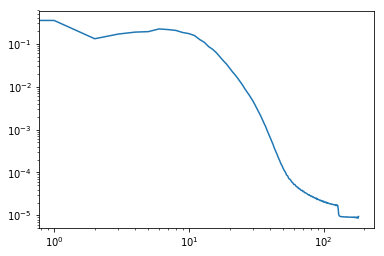

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.99078202e-06 8.72247892e-06 8.74356738e-06 ... 8.43474845e-06
  8.74356738e-06 8.72247892e-06]
 [9.27416659e-06 9.02796819e-06 8.52686298e-06 ... 9.14143220e-06
  8.86643102e-06 8.70994154e-06]
 [8.92514709e-06 9.01878593e-06 8.91142918e-06 ... 9.14738393e-06
  8.77279308e-06 8.89960302e-06]
 ...
 [9.00081432e-06 8.28240081e-06 9.46249656e-06 ... 9.25327095e-06
  8.53633810e-06 8.73654972e-06]
 [8.92514709e-06 8.89960302e-06 8.77279308e-06 ... 9.12257929e-06
  8.91142918e-06 9.01878593e-06]
 [9.27416659e-06 8.70994154e-06 8.86643102e-06 ... 8.71552311e-06
  8.52686298e-06 9.02796819e-06]]
el max de R es 181


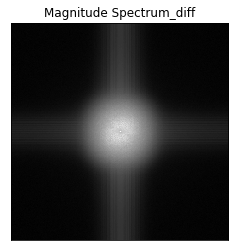

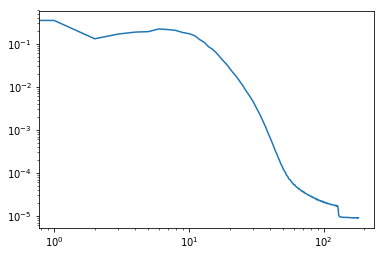

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.72210728e-06 8.76678951e-06 8.54542395e-06 ... 8.96276106e-06
  8.54542395e-06 8.76678951e-06]
 [8.78970786e-06 9.43208670e-06 8.37871812e-06 ... 8.45712930e-06
  8.98707458e-06 7.97550820e-06]
 [9.58231340e-06 9.14202064e-06 8.66069968e-06 ... 9.48128400e-06
  8.70976055e-06 8.99119004e-06]
 ...
 [8.82623681e-06 9.05404431e-06 9.39872734e-06 ... 9.13977146e-06
  8.19198976e-06 8.66299706e-06]
 [9.58231340e-06 8.99119004e-06 8.70976055e-06 ... 9.23319749e-06
  8.66069968e-06 9.14202064e-06]
 [8.78970786e-06 7.97550820e-06 8.98707458e-06 ... 8.54578320e-06
  8.37871812e-06 9.43208670e-06]]
el max de R es 181


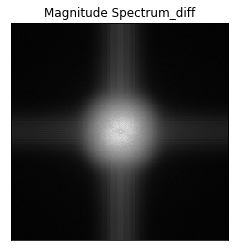

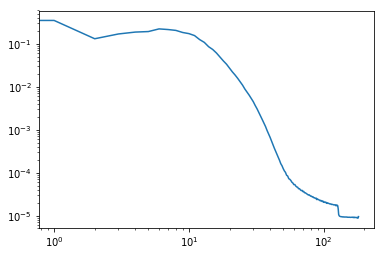

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04161700e-05 9.18275055e-06 9.06537298e-06 ... 8.47353294e-06
  9.06537298e-06 9.18275055e-06]
 [9.02823012e-06 9.21694573e-06 8.67065228e-06 ... 8.59696320e-06
  9.08003858e-06 8.74883426e-06]
 [9.00837586e-06 9.31838895e-06 8.85712507e-06 ... 9.19077320e-06
  8.41603469e-06 8.90781212e-06]
 ...
 [8.77843831e-06 8.97043174e-06 9.45026750e-06 ... 9.50409412e-06
  8.56208953e-06 9.00468240e-06]
 [9.00837586e-06 8.90781212e-06 8.41603469e-06 ... 8.90634692e-06
  8.85712507e-06 9.31838895e-06]
 [9.02823012e-06 8.74883426e-06 9.08003858e-06 ... 8.91076252e-06
  8.67065228e-06 9.21694573e-06]]
el max de R es 181


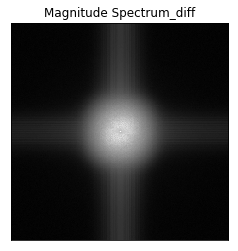

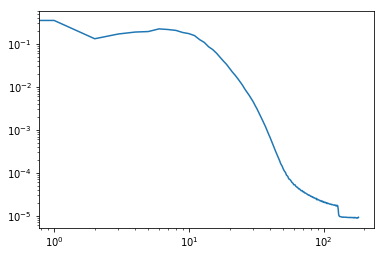

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05015606e-05 9.31380782e-06 8.64097819e-06 ... 8.94355708e-06
  8.64097819e-06 9.31380782e-06]
 [8.84911151e-06 8.98846247e-06 8.63726382e-06 ... 8.33495051e-06
  8.96483016e-06 8.85362442e-06]
 [8.98928465e-06 9.37331606e-06 8.33404738e-06 ... 9.04713670e-06
  8.48479976e-06 9.44105977e-06]
 ...
 [9.21865467e-06 8.69859923e-06 9.57407428e-06 ... 9.05118304e-06
  8.13619590e-06 8.91074887e-06]
 [8.98928465e-06 9.44105977e-06 8.48479976e-06 ... 9.14107386e-06
  8.33404738e-06 9.37331606e-06]
 [8.84911151e-06 8.85362442e-06 8.96483016e-06 ... 8.57583109e-06
  8.63726382e-06 8.98846247e-06]]
el max de R es 181


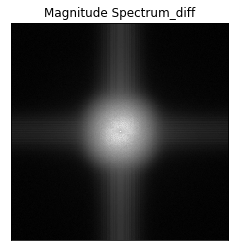

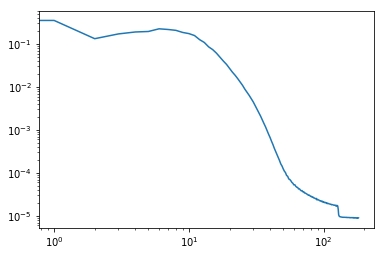

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.00139641e-05 8.88070917e-06 8.30644149e-06 ... 8.88472096e-06
  8.30644149e-06 8.88070917e-06]
 [8.86053112e-06 9.53191102e-06 9.08404400e-06 ... 8.49186290e-06
  8.99942552e-06 8.13819497e-06]
 [8.41999008e-06 8.56283896e-06 8.57594296e-06 ... 9.04511035e-06
  8.96035726e-06 9.36513334e-06]
 ...
 [8.71355314e-06 8.83557095e-06 9.45067131e-06 ... 8.81062169e-06
  8.51208915e-06 8.83962002e-06]
 [8.41999008e-06 9.36513334e-06 8.96035726e-06 ... 8.96902475e-06
  8.57594296e-06 8.56283896e-06]
 [8.86053112e-06 8.13819497e-06 8.99942552e-06 ... 8.78278570e-06
  9.08404400e-06 9.53191102e-06]]
el max de R es 181


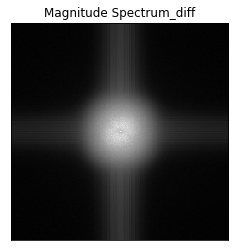

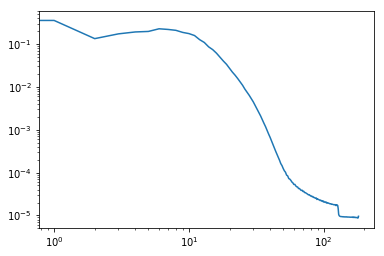

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02120393e-05 9.10297331e-06 8.72140299e-06 ... 8.91228956e-06
  8.72140299e-06 9.10297331e-06]
 [8.72755118e-06 9.64495212e-06 8.48665422e-06 ... 8.79976415e-06
  9.36793094e-06 8.63832975e-06]
 [8.87990518e-06 9.10932522e-06 9.11823463e-06 ... 9.01687963e-06
  8.31598754e-06 8.59451393e-06]
 ...
 [8.40643588e-06 8.52797803e-06 9.17401849e-06 ... 9.15791497e-06
  8.35813898e-06 8.85103600e-06]
 [8.87990518e-06 8.59451393e-06 8.31598754e-06 ... 9.31337945e-06
  9.11823463e-06 9.10932522e-06]
 [8.72755118e-06 8.63832975e-06 9.36793094e-06 ... 8.88573049e-06
  8.48665422e-06 9.64495212e-06]]
el max de R es 181


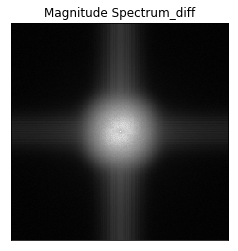

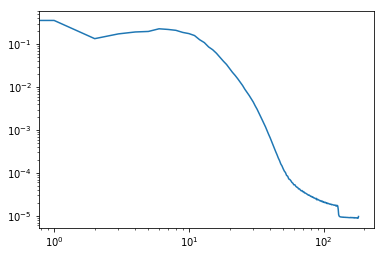

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.07249589e-05 8.80988409e-06 8.62622983e-06 ... 8.45306113e-06
  8.62622983e-06 8.80988409e-06]
 [9.15726741e-06 9.33764750e-06 8.72256351e-06 ... 8.48199761e-06
  8.96626807e-06 8.33511149e-06]
 [8.90448518e-06 8.51483037e-06 8.46105468e-06 ... 9.04284207e-06
  7.91453294e-06 8.63386595e-06]
 ...
 [8.87363967e-06 8.68112875e-06 9.23443440e-06 ... 9.12617998e-06
  8.37597418e-06 9.07580670e-06]
 [8.90448518e-06 8.63386595e-06 7.91453294e-06 ... 9.41302187e-06
  8.46105468e-06 8.51483037e-06]
 [9.15726741e-06 8.33511149e-06 8.96626807e-06 ... 8.92168373e-06
  8.72256351e-06 9.33764750e-06]]
el max de R es 181


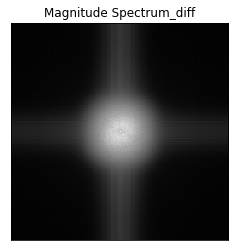

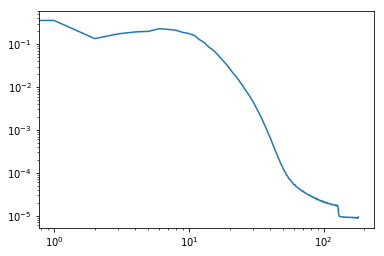

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.05265217e-05 9.55704581e-06 8.73206318e-06 ... 8.98131111e-06
  8.73206318e-06 9.55704581e-06]
 [8.59191368e-06 9.26225493e-06 8.96707934e-06 ... 8.15864405e-06
  9.08792845e-06 9.05449269e-06]
 [8.64508911e-06 8.98131930e-06 8.68228562e-06 ... 9.15651344e-06
  8.32192381e-06 9.06605965e-06]
 ...
 [8.72075361e-06 8.89726289e-06 9.07687172e-06 ... 9.28314421e-06
  8.13079532e-06 8.62328125e-06]
 [8.64508911e-06 9.06605965e-06 8.32192381e-06 ... 9.35539174e-06
  8.68228562e-06 8.98131930e-06]
 [8.59191368e-06 9.05449269e-06 9.08792845e-06 ... 9.04064564e-06
  8.96707934e-06 9.26225493e-06]]
el max de R es 181


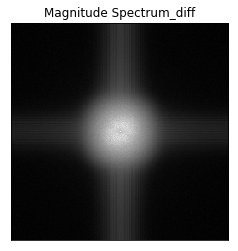

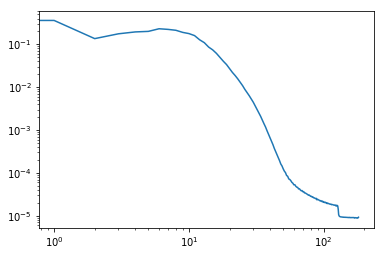

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.06462630e-05 8.97652990e-06 8.57043324e-06 ... 8.91638047e-06
  8.57043324e-06 8.97652990e-06]
 [8.73717636e-06 9.50379581e-06 8.39214135e-06 ... 8.73590852e-06
  9.41543658e-06 8.26926953e-06]
 [8.73925183e-06 8.64416688e-06 8.75359547e-06 ... 9.26997291e-06
  9.10858307e-06 9.14665088e-06]
 ...
 [8.86447560e-06 8.68897678e-06 8.98232611e-06 ... 8.99295173e-06
  8.71673728e-06 9.07883896e-06]
 [8.73925183e-06 9.14665088e-06 9.10858307e-06 ... 9.33260799e-06
  8.75359547e-06 8.64416688e-06]
 [8.73717636e-06 8.26926953e-06 9.41543658e-06 ... 8.83379016e-06
  8.39214135e-06 9.50379581e-06]]
el max de R es 181


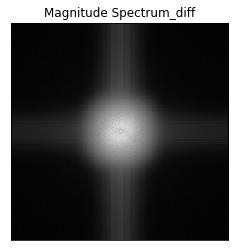

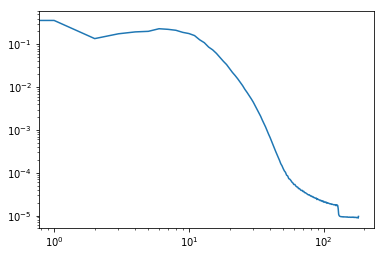

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.06478374e-05 9.27887322e-06 8.65994753e-06 ... 9.18252954e-06
  8.65994753e-06 9.27887322e-06]
 [9.24709366e-06 9.70456222e-06 8.34958973e-06 ... 8.66474420e-06
  9.03569617e-06 8.44103579e-06]
 [8.72375858e-06 8.77873026e-06 8.42319787e-06 ... 9.39466099e-06
  9.09896244e-06 8.37538119e-06]
 ...
 [8.90995852e-06 8.71837528e-06 9.34404852e-06 ... 9.21701667e-06
  8.65777565e-06 9.13457370e-06]
 [8.72375858e-06 8.37538119e-06 9.09896244e-06 ... 9.58154396e-06
  8.42319787e-06 8.77873026e-06]
 [9.24709366e-06 8.44103579e-06 9.03569617e-06 ... 9.13959593e-06
  8.34958973e-06 9.70456222e-06]]
el max de R es 181


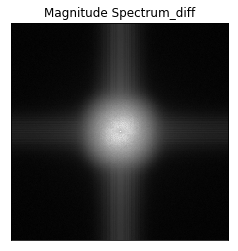

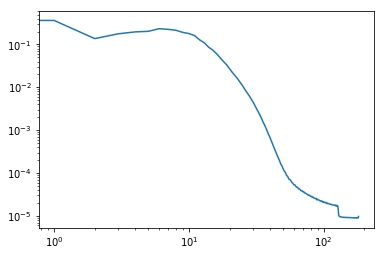

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04355631e-05 9.37600817e-06 8.15801741e-06 ... 8.42269765e-06
  8.15801741e-06 9.37600817e-06]
 [8.98589315e-06 9.13612803e-06 9.20791808e-06 ... 8.60314503e-06
  9.50057438e-06 8.64843696e-06]
 [8.79761956e-06 8.66688788e-06 9.19335889e-06 ... 9.42257702e-06
  8.34466027e-06 9.45584816e-06]
 ...
 [8.99026963e-06 8.57676605e-06 8.58515068e-06 ... 9.60475427e-06
  8.29207420e-06 8.93388915e-06]
 [8.79761956e-06 9.45584816e-06 8.34466027e-06 ... 8.46624880e-06
  9.19335889e-06 8.66688788e-06]
 [8.98589315e-06 8.64843696e-06 9.50057438e-06 ... 8.69136602e-06
  9.20791808e-06 9.13612803e-06]]
el max de R es 181


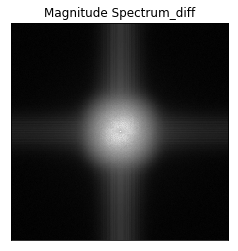

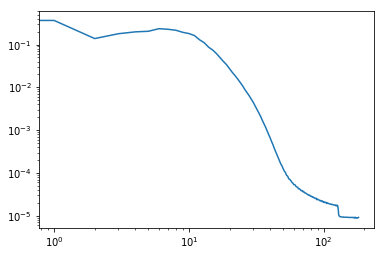

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02330778e-05 9.04201534e-06 8.53071742e-06 ... 8.61107583e-06
  8.53071742e-06 9.04201534e-06]
 [9.15171040e-06 9.03149248e-06 8.69038740e-06 ... 8.30959380e-06
  9.25367203e-06 8.58463591e-06]
 [9.14379052e-06 8.50788183e-06 9.13544955e-06 ... 8.87877195e-06
  8.79425988e-06 8.95496305e-06]
 ...
 [9.20238926e-06 8.96962047e-06 8.88482282e-06 ... 9.12989617e-06
  8.35830360e-06 8.72864712e-06]
 [9.14379052e-06 8.95496305e-06 8.79425988e-06 ... 9.42856786e-06
  9.13544955e-06 8.50788183e-06]
 [9.15171040e-06 8.58463591e-06 9.25367203e-06 ... 9.13356416e-06
  8.69038740e-06 9.03149248e-06]]
el max de R es 181


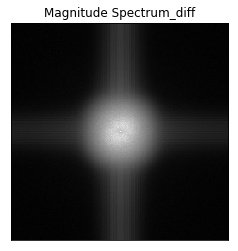

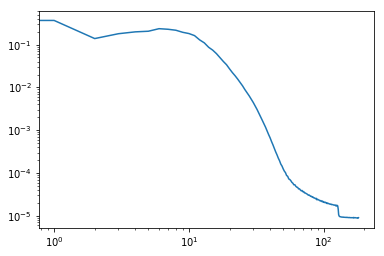

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.95022492e-06 8.87651277e-06 8.39995391e-06 ... 8.39317363e-06
  8.39995391e-06 8.87651277e-06]
 [8.57306532e-06 9.39180791e-06 8.92221760e-06 ... 7.99674035e-06
  8.72570581e-06 8.46372131e-06]
 [8.78706396e-06 8.85057580e-06 8.68417919e-06 ... 9.34665877e-06
  8.89944295e-06 8.94965524e-06]
 ...
 [8.99170573e-06 8.44421811e-06 9.12817723e-06 ... 9.26918165e-06
  8.19956767e-06 8.88386148e-06]
 [8.78706396e-06 8.94965524e-06 8.89944295e-06 ... 8.53293386e-06
  8.68417919e-06 8.85057580e-06]
 [8.57306532e-06 8.46372131e-06 8.72570581e-06 ... 9.03782257e-06
  8.92221760e-06 9.39180791e-06]]
el max de R es 181


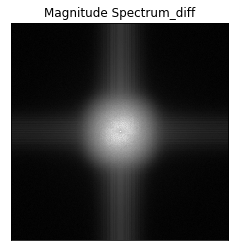

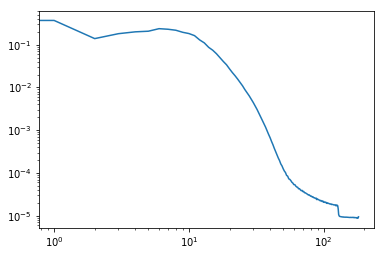

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03263455e-05 8.75694059e-06 8.41746350e-06 ... 8.90164938e-06
  8.41746350e-06 8.75694059e-06]
 [9.09819846e-06 9.14389238e-06 8.78335231e-06 ... 8.68469760e-06
  8.96061010e-06 8.35755509e-06]
 [9.07031335e-06 8.54977407e-06 9.19016838e-06 ... 8.69592895e-06
  8.75347905e-06 9.07081812e-06]
 ...
 [8.57434406e-06 8.53362417e-06 9.32960484e-06 ... 9.21079391e-06
  8.14564009e-06 8.70001804e-06]
 [9.07031335e-06 9.07081812e-06 8.75347905e-06 ... 9.01007024e-06
  9.19016838e-06 8.54977407e-06]
 [9.09819846e-06 8.35755509e-06 8.96061010e-06 ... 9.14035445e-06
  8.78335231e-06 9.14389238e-06]]
el max de R es 181


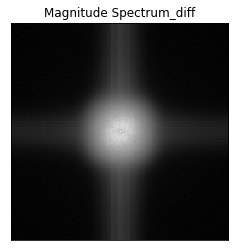

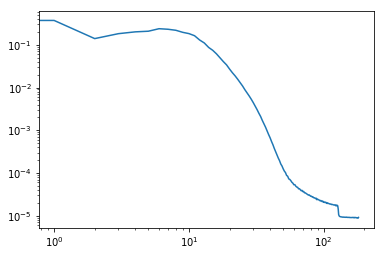

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03628063e-05 9.17913530e-06 8.71662724e-06 ... 8.65270704e-06
  8.71662724e-06 9.17913530e-06]
 [9.15999226e-06 9.15858254e-06 8.66340906e-06 ... 9.02500869e-06
  9.03129330e-06 8.54491645e-06]
 [8.24200924e-06 8.97645987e-06 8.42704321e-06 ... 9.23364132e-06
  8.42546251e-06 9.19092599e-06]
 ...
 [8.84049769e-06 8.42941972e-06 9.19115428e-06 ... 9.20331240e-06
  8.58589374e-06 9.04898206e-06]
 [8.24200924e-06 9.19092599e-06 8.42546251e-06 ... 9.06059631e-06
  8.42704321e-06 8.97645987e-06]
 [9.15999226e-06 8.54491645e-06 9.03129330e-06 ... 9.52367373e-06
  8.66340906e-06 9.15858254e-06]]
el max de R es 181


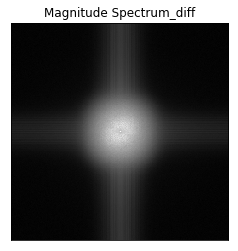

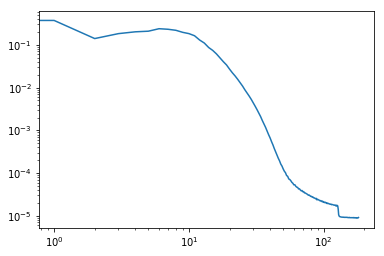

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02485474e-05 8.66604114e-06 8.38262986e-06 ... 8.92777280e-06
  8.38262986e-06 8.66604114e-06]
 [8.99242423e-06 9.17923717e-06 8.73994668e-06 ... 8.54279460e-06
  8.62433535e-06 8.62013439e-06]
 [8.76213744e-06 9.38109770e-06 8.33579179e-06 ... 9.28132704e-06
  8.21766389e-06 9.11642474e-06]
 ...
 [8.80077096e-06 8.58952353e-06 8.88617888e-06 ... 9.00196665e-06
  8.39497716e-06 9.79416291e-06]
 [8.76213744e-06 9.11642474e-06 8.21766389e-06 ... 9.16774025e-06
  8.33579179e-06 9.38109770e-06]
 [8.99242423e-06 8.62013439e-06 8.62433535e-06 ... 9.10187009e-06
  8.73994668e-06 9.17923717e-06]]
el max de R es 181


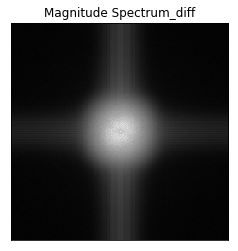

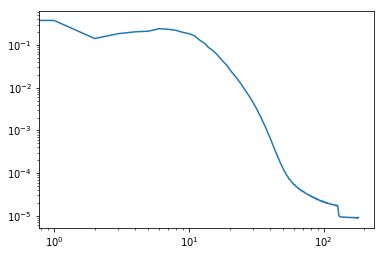

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03378252e-05 9.11449843e-06 8.84725341e-06 ... 8.80958760e-06
  8.84725341e-06 9.11449843e-06]
 [8.96552865e-06 9.12596443e-06 9.06259993e-06 ... 8.95455833e-06
  8.87025635e-06 8.86207636e-06]
 [8.86641737e-06 9.17685065e-06 9.03629189e-06 ... 9.36768538e-06
  8.06422941e-06 9.25439781e-06]
 ...
 [8.89168314e-06 8.42432109e-06 9.40075370e-06 ... 9.01414387e-06
  8.54927748e-06 8.65782567e-06]
 [8.86641737e-06 9.25439781e-06 8.06422941e-06 ... 9.46859382e-06
  9.03629189e-06 9.17685065e-06]
 [8.96552865e-06 8.86207636e-06 8.87025635e-06 ... 8.95098583e-06
  9.06259993e-06 9.12596443e-06]]
el max de R es 181


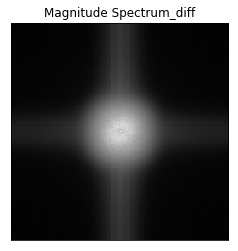

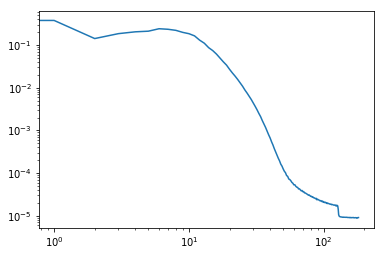

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.58288638e-06 9.14139946e-06 8.18758326e-06 ... 8.99532461e-06
  8.18758326e-06 9.14139946e-06]
 [9.26989742e-06 9.11245024e-06 8.80180687e-06 ... 8.49737262e-06
  8.48754280e-06 8.29792134e-06]
 [8.57586838e-06 8.87618444e-06 9.08251968e-06 ... 9.26275879e-06
  8.76782997e-06 9.33650244e-06]
 ...
 [9.10819745e-06 9.04146873e-06 9.10995277e-06 ... 9.37584537e-06
  7.93512118e-06 8.74207490e-06]
 [8.57586838e-06 9.33650244e-06 8.76782997e-06 ... 9.68351742e-06
  9.08251968e-06 8.87618444e-06]
 [9.26989742e-06 8.29792134e-06 8.48754280e-06 ... 8.66547452e-06
  8.80180687e-06 9.11245024e-06]]
el max de R es 181


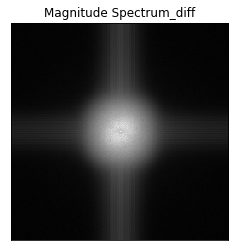

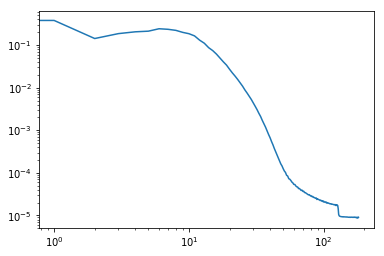

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.81281664e-06 9.31791237e-06 7.91547336e-06 ... 8.46031526e-06
  7.91547336e-06 9.31791237e-06]
 [8.80915741e-06 9.46527507e-06 8.35058927e-06 ... 8.99995393e-06
  9.39146594e-06 8.61702210e-06]
 [8.46156945e-06 8.68918869e-06 8.84159363e-06 ... 8.90580486e-06
  8.69544328e-06 8.65924540e-06]
 ...
 [8.82030872e-06 9.16216777e-06 8.96485290e-06 ... 9.69731900e-06
  8.52861194e-06 8.82506174e-06]
 [8.46156945e-06 8.65924540e-06 8.69544328e-06 ... 9.25262248e-06
  8.84159363e-06 8.68918869e-06]
 [8.80915741e-06 8.61702210e-06 9.39146594e-06 ... 9.03244290e-06
  8.35058927e-06 9.46527507e-06]]
el max de R es 181


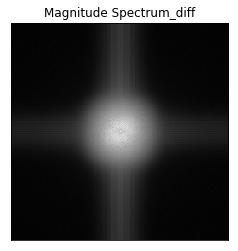

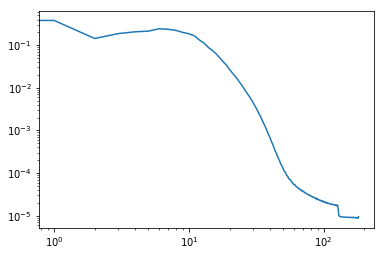

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.03929997e-05 9.33626779e-06 8.45940849e-06 ... 8.88010527e-06
  8.45940849e-06 9.33626779e-06]
 [8.63602963e-06 9.06972400e-06 8.52718949e-06 ... 9.05182605e-06
  9.32604871e-06 8.32249589e-06]
 [9.14358043e-06 9.23152584e-06 8.83850134e-06 ... 8.88229806e-06
  9.06793048e-06 8.91720629e-06]
 ...
 [8.77063121e-06 8.25681400e-06 9.23976859e-06 ... 9.35263961e-06
  8.46749936e-06 9.19255854e-06]
 [9.14358043e-06 8.91720629e-06 9.06793048e-06 ... 9.20990351e-06
  8.83850134e-06 9.23152584e-06]
 [8.63602963e-06 8.32249589e-06 9.32604871e-06 ... 8.93064407e-06
  8.52718949e-06 9.06972400e-06]]
el max de R es 181


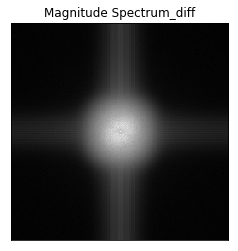

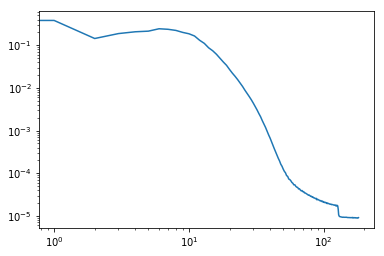

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.04835663e-05 8.65397215e-06 8.33897411e-06 ... 9.00201394e-06
  8.33897411e-06 8.65397215e-06]
 [8.92768185e-06 8.85783447e-06 8.46015791e-06 ... 8.54169139e-06
  9.22683284e-06 9.19898775e-06]
 [8.63314290e-06 8.87432816e-06 8.47799856e-06 ... 9.26676421e-06
  8.17741056e-06 8.89765306e-06]
 ...
 [8.63109744e-06 8.75618116e-06 9.88643114e-06 ... 9.11513143e-06
  8.04513638e-06 8.77731509e-06]
 [8.63314290e-06 8.89765306e-06 8.17741056e-06 ... 9.47340322e-06
  8.47799856e-06 8.87432816e-06]
 [8.92768185e-06 9.19898775e-06 9.22683284e-06 ... 8.40182111e-06
  8.46015791e-06 8.85783447e-06]]
el max de R es 181


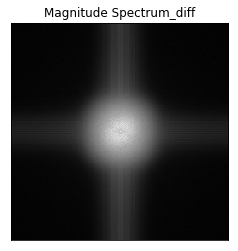

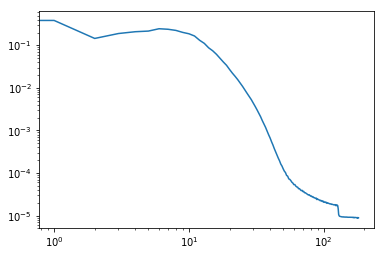

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.76471892e-06 8.87950955e-06 8.51350251e-06 ... 8.96982056e-06
  8.51350251e-06 8.87950955e-06]
 [9.20382445e-06 9.31324666e-06 8.98932922e-06 ... 8.53831625e-06
  8.54221435e-06 8.60465298e-06]
 [8.85432382e-06 9.43867872e-06 8.87423812e-06 ... 8.92334356e-06
  9.19592821e-06 8.67635663e-06]
 ...
 [8.86257112e-06 9.18806290e-06 9.36901779e-06 ... 9.39551137e-06
  8.61143872e-06 9.52803839e-06]
 [8.85432382e-06 8.67635663e-06 9.19592821e-06 ... 9.43080522e-06
  8.87423812e-06 9.43867872e-06]
 [9.20382445e-06 8.60465298e-06 8.54221435e-06 ... 9.03097589e-06
  8.98932922e-06 9.31324666e-06]]
el max de R es 181


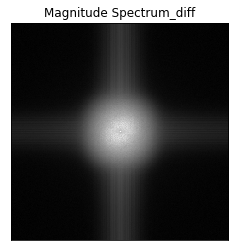

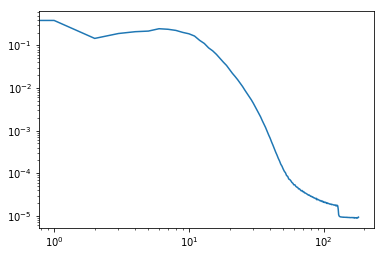

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.87307794e-06 9.26419762e-06 8.25322422e-06 ... 8.80527296e-06
  8.25322422e-06 9.26419762e-06]
 [9.07411595e-06 9.35554090e-06 8.78805076e-06 ... 8.77349885e-06
  9.22769414e-06 8.56142833e-06]
 [8.62987690e-06 9.32276726e-06 8.39847962e-06 ... 9.32783769e-06
  8.03874445e-06 8.74387388e-06]
 ...
 [8.89640523e-06 8.42723693e-06 9.35479238e-06 ... 9.50014237e-06
  8.48387208e-06 8.94701952e-06]
 [8.62987690e-06 8.74387388e-06 8.03874445e-06 ... 9.50511640e-06
  8.39847962e-06 9.32276726e-06]
 [9.07411595e-06 8.56142833e-06 9.22769414e-06 ... 8.96295296e-06
  8.78805076e-06 9.35554090e-06]]
el max de R es 181


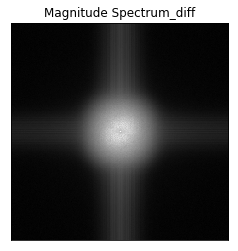

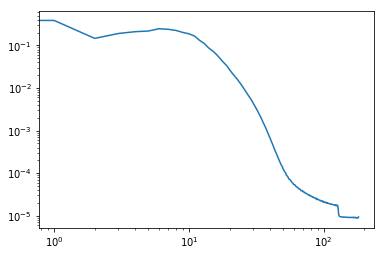

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[1.02181666e-05 9.37344066e-06 8.97412610e-06 ... 9.00510440e-06
  8.97412610e-06 9.37344066e-06]
 [9.54033476e-06 9.50856338e-06 8.57740361e-06 ... 8.26390715e-06
  8.97011614e-06 8.70767417e-06]
 [9.18386831e-06 8.79640174e-06 8.33849026e-06 ... 9.33245155e-06
  9.10091876e-06 9.37080131e-06]
 ...
 [9.05097022e-06 8.63782134e-06 9.63973253e-06 ... 9.09414030e-06
  8.54802965e-06 9.03274849e-06]
 [9.18386831e-06 9.37080131e-06 9.10091876e-06 ... 9.51242600e-06
  8.33849026e-06 8.79640174e-06]
 [9.54033476e-06 8.70767417e-06 8.97011614e-06 ... 9.52160917e-06
  8.57740361e-06 9.50856338e-06]]
el max de R es 181


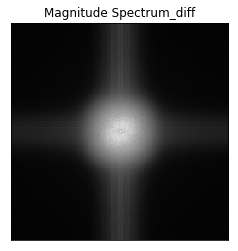

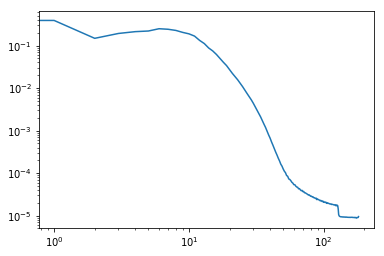

(256, 256)
0
rravel es  [179 178 178 ... 179 180 181]
mag spe es [[9.72069301e-06 8.97221889e-06 8.36452909e-06 ... 9.24284723e-06
  8.36452909e-06 8.97221889e-06]
 [9.21567516e-06 8.87385067e-06 8.67756262e-06 ... 8.61350418e-06
  8.69488758e-06 8.65166294e-06]
 [9.18445312e-06 8.90888077e-06 8.73333101e-06 ... 9.00675695e-06
  8.66856499e-06 8.88698469e-06]
 ...
 [9.40649807e-06 8.54322116e-06 8.87877650e-06 ... 9.12865653e-06
  8.40401299e-06 9.51656239e-06]
 [9.18445312e-06 8.88698469e-06 8.66856499e-06 ... 8.61934313e-06
  8.73333101e-06 8.90888077e-06]
 [9.21567516e-06 8.65166294e-06 8.69488758e-06 ... 8.69224550e-06
  8.67756262e-06 8.87385067e-06]]
el max de R es 181


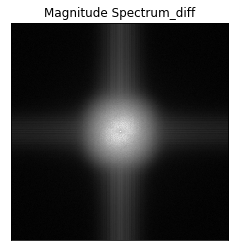

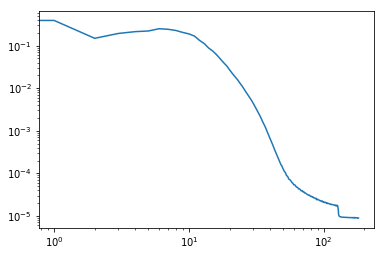

The array then is  [[1.92830097e-02 2.04837883e-02 1.83442463e-02 ... 8.90418517e-06
  8.60140176e-06 9.14504744e-06]
 [2.18105335e-02 2.49863446e-02 2.00142263e-02 ... 8.57596956e-06
  8.84522547e-06 9.28576901e-06]
 [2.27898005e-02 2.90130184e-02 2.09458485e-02 ... 8.97314965e-06
  8.92855269e-06 8.68001734e-06]
 ...
 [7.75693282e-02 3.88007692e-01 1.47060009e-01 ... 8.77343598e-06
  9.11228290e-06 9.35554090e-06]
 [7.69633576e-02 3.89579639e-01 1.47929344e-01 ... 9.08554466e-06
  9.07189519e-06 9.50856338e-06]
 [7.90148824e-02 3.91404302e-01 1.48841807e-01 ... 8.93939250e-06
  8.94358436e-06 8.87385067e-06]]


In [2]:
#Arreglo para evaluar DICF
DICF_array = np.zeros([num_intervals-1,182]) 
l=0
m=pixels

for n in range(0,num_intervals-1):
    magnitude_spectrum_diff_2 = np.fft.fftshift(Fourier_sp_diff[l:m,:])        
    center = [(pixels/2) - 1, (pixels/2) -1]
    print(magnitude_spectrum_diff_2.shape)
#q_x,q_y = np.meshgrid(shap2,shap2,sparse = True)
    Y, X = np.indices((magnitude_spectrum_diff_2.shape))    
    R = np.sqrt((X - center[0])**2 + (Y - center[1])**2)
    R = R.astype(np.int)
   
    print(np.min(R))
    Tbin = np.bincount(R.ravel(), magnitude_spectrum_diff_2.ravel())
    print("rravel es ", R.ravel())
    print("mag spe es", magnitude_spectrum_diff_2)
    NR = np.bincount(R.ravel())
    Radialprofile = Tbin / NR
    print("el max de R es",np.max(R))
    plt.plot(),plt.imshow(20*cv.log(magnitude_spectrum_diff_2), cmap = 'gray')
    plt.title('Magnitude Spectrum_diff'), plt.xticks([]), plt.yticks([])
    plt.show()
    l = l+pixels
    m = m+pixels
    T = np.linspace(0,181,num = 182)
    plt.loglog(T,Radialprofile , label ='linear')
    plt.show()
    DICF_array[n,:] = Radialprofile

print("The array then is ", DICF_array)

1.4326854494663412
[3.79290576e+00 9.87356421e-01 3.70079815e-03 2.73961790e-02]


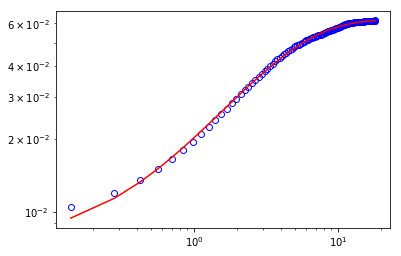

1.5222282900579875
[3.36454565e+00 8.17214053e-01 2.37073936e-03 2.28229221e-02]


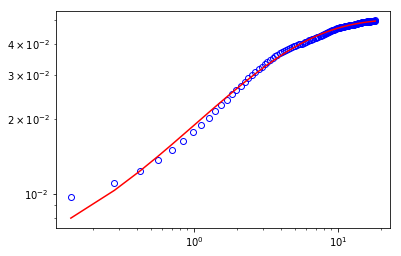

1.6117711306496338
[3.05853092e+00 8.99645803e-01 2.98806822e-03 1.72757562e-02]


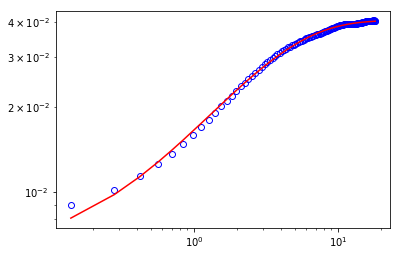

1.7013139712412801
[2.57959688e+00 8.74957595e-01 2.51294101e-03 1.43505019e-02]


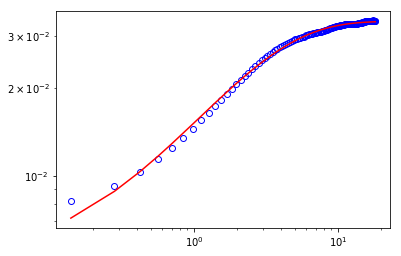

1.7908568118329264
[2.34449111 0.99449125 0.0029456  0.01057524]


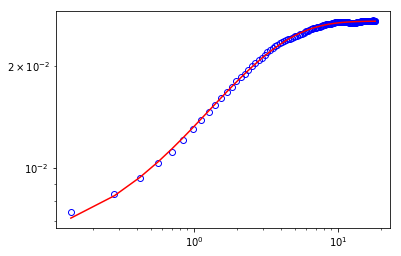

1.880399652424573
[2.20052213 0.99999961 0.00272265 0.00840341]


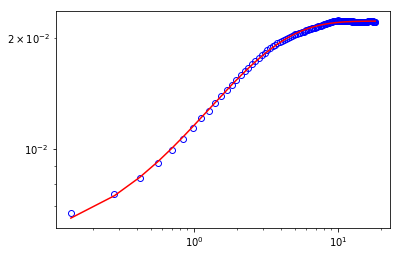

1.969942493016219
[2.019243   0.95279293 0.00238258 0.00701349]


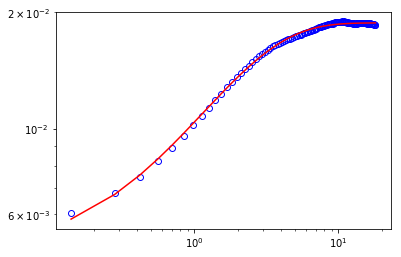

2.0594853336078653
[1.81817773 0.94309397 0.00213801 0.00570319]


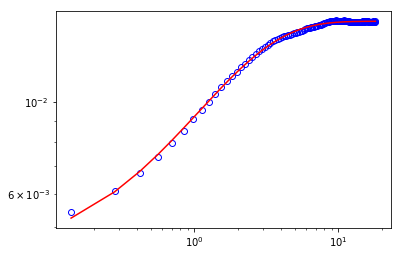

2.1490281741995116
[1.66247714 0.93523745 0.00192922 0.00457313]


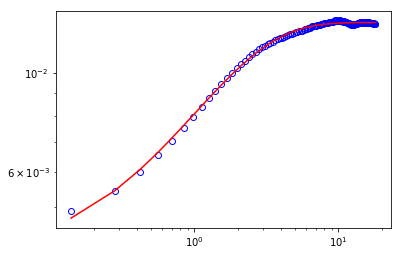

2.2385710147911584
[1.59991885 0.97532718 0.00179214 0.00363861]


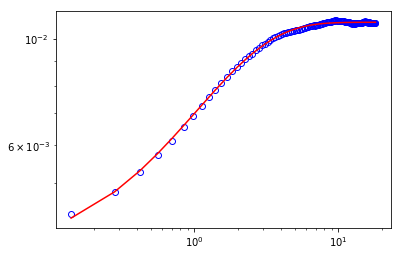

2.3281138553828047
[1.44016822 0.96103807 0.00156249 0.00285215]


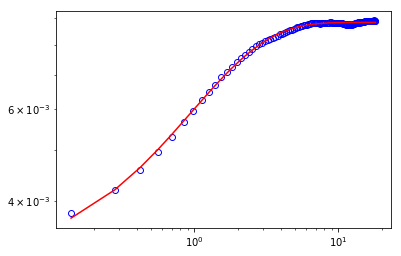

2.4176566959744505
[1.31723928e+00 8.48840114e-01 1.26300374e-03 2.47714769e-03]


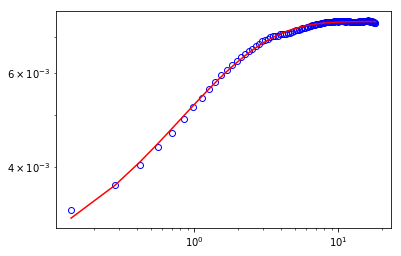

2.5071995365660973
[1.29774223e+00 9.63460964e-01 1.23170403e-03 1.90832158e-03]


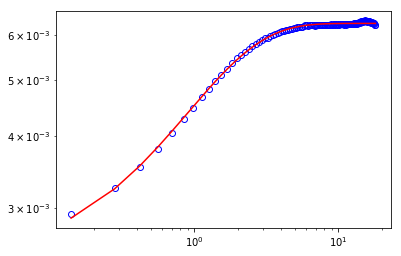

2.5967423771577436
[1.18082617e+00 8.86886003e-01 1.02050850e-03 1.62246327e-03]


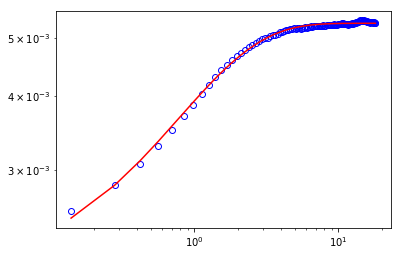

2.6862852177493894
[1.21046964e+00 9.41991052e-01 9.38251013e-04 1.28096852e-03]


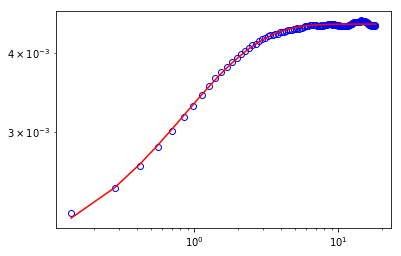

2.775828058341036
[1.08716677e+00 8.55168831e-01 7.67153102e-04 1.05318459e-03]


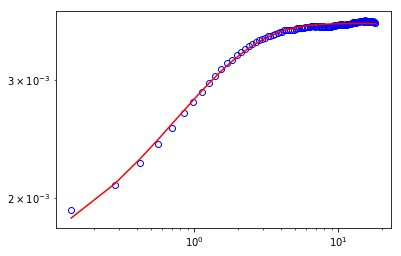

2.8653708989326825
[8.53263179e-01 6.63394386e-01 5.30964378e-04 9.87407284e-04]


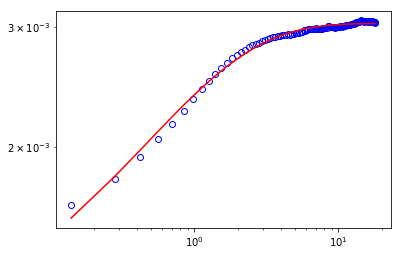

2.954913739524329
[8.89557524e-01 7.16027322e-01 5.12528681e-04 7.42857961e-04]


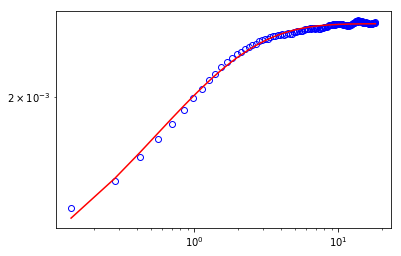

3.044456580115975
[7.60866787e-01 6.34113558e-01 3.94079581e-04 6.53124686e-04]


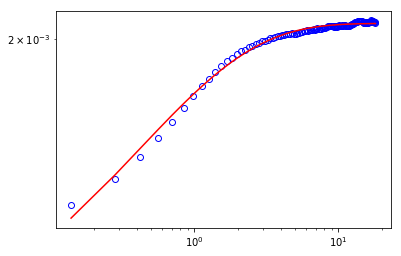

3.1339994207076214
[7.79946942e-01 6.76464759e-01 3.73354619e-04 4.79534019e-04]


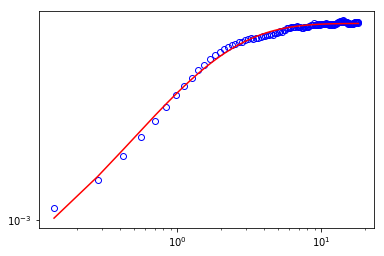

3.2235422612992677
[6.87287163e-01 6.19003082e-01 2.96071415e-04 4.09908787e-04]


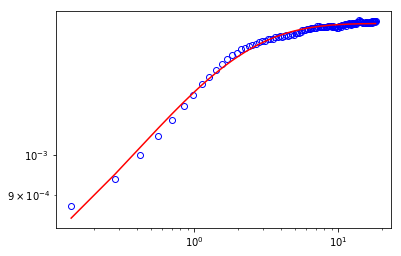

3.313085101890914
[5.98026110e-01 5.54250412e-01 2.32193906e-04 3.59189344e-04]


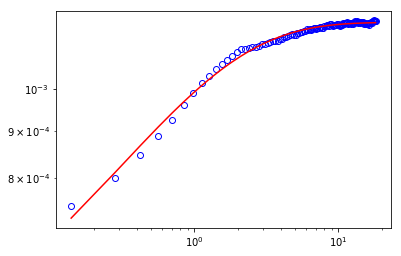

3.4026279424825603
[5.71243534e-01 5.31728217e-01 1.96028854e-04 2.83450832e-04]


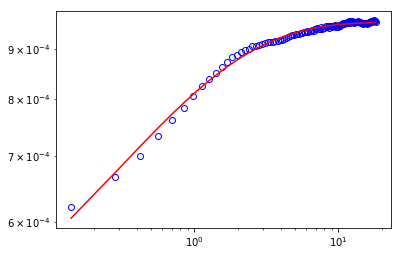

3.4921707830742066
[5.91279977e-01 5.00475538e-01 1.67227493e-04 2.28862613e-04]


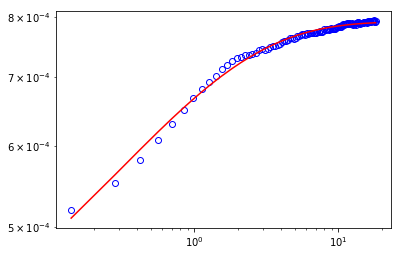

In [8]:
#beta = 1
import math 
i=0
num = 24
ini = 16
Q = np.zeros([num])
#A_q_DICF = np.zeros([num])
B_q_DICF = np.zeros([num])
apo_2 = np.linspace(timestep, timestep*num_intervals, num_intervals-1)
apo22 = np.linspace(0.01, timestep*num_intervals, (num_intervals-1)*10)
f_q = np.zeros([num, np.size(DICF_array[:,1])])
f_q_fit = np.zeros([num, np.size(apo22)])
dif_coef = 0;
Time = np.zeros([num])
Betas = np.zeros([num])
for h in range(ini,ini + num,1):
    alli_2 = DICF_array[:,h]
    plt.loglog(apo_2, alli_2,'bo',ms = 6, fillstyle = 'none', label='linear')
    
    
    q = (2*np.pi)*h/(d_pix*256)
    
    
    
    def func( x, tau, beta, B, A_fit):
        return 2*A_fit*(1 - np.exp(-(x/tau)**beta)) + 2*B
        #return 2*A_q_F[i]*(1 - np.exp(-(x/tau)**beta)) +2*B
        #return 2*A_q_F[i]*(1-np.exp(-x*(q**2)*D)) + 2*B
        #return 2*A_q_F[i]*(1-np.exp(-(x*(q**2)*D)**beta)) + 2*B
    print(q)
    popt, pcov = curve_fit(func, apo_2[:], alli_2[:],bounds=([0.1, 0.5, 0.00000000005, 0.000003], [10.0 , 1.0, 0.01 , 0.1]), method = 'trf')
    #popt, pcov = curve_fit(func, apo_2, alli_2,  method = 'lm')
    print(popt)
    #dif_coef = dif_coef+popt[1]
    plt.loglog(apo_2, func(apo_2, *popt), 'r-',
             label='fit: tau=%5.3f, beta=%5.3f, B=%5.3f, A_fit=%5.3f' % tuple(popt))
    
    
    f_q[i,:] = 1 - (DICF_array[:,h] - 2*popt[2])/(2*popt[3])
    f_q_fit[i,:] = np.exp(-((apo22/popt[0])**popt[1]))
    #l=1/(popt[0]*q**2)
    Q[i] = q 
    Betas[i] = popt[1]
    B_q_DICF[i] = popt[2]
    Time[i] = popt[0]*math.gamma(1/popt[1])/popt[1]
    i=i+1        
    plt.show()
    
#def func2(Z,Dif):
    #return 1/(Dif*Z**2)
#popt_D, pcov_D = curve_fit(func2, Q, Time) 

#print(popt_D)
#dif_coef = dif_coef/len(Q) 


#plt.show()
#plt.loglog(Q,Time, 'bo',fillstyle = 'none', ms = 7, label = 'Measurements') 
#plt.loglog(Q, func2(Q, *popt_D), 'r-', label = 'Fit')
#plt.xlabel(r'q ($1/\mu m$)')
#plt.ylabel(r'$\tau$ (s)')
#plt.legend(loc='upper right')
plt.show()
#plt.loglog(Q, A_q_F, 'bP', ms = 6, label = 'A(q)')
#plt.loglog(Q,B_q_DICF,'r.', ms = 6, label = 'B(q)')
#plt.xlabel(r'q ($1/\mu m$)')
#plt.ylabel(r'Arb units')
#plt.legend(loc = 'upper right')

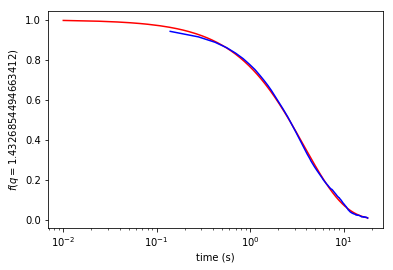

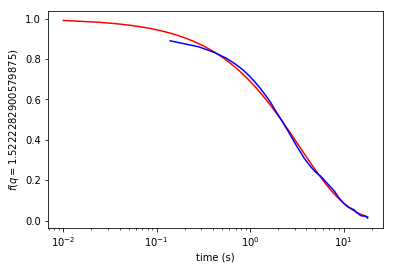

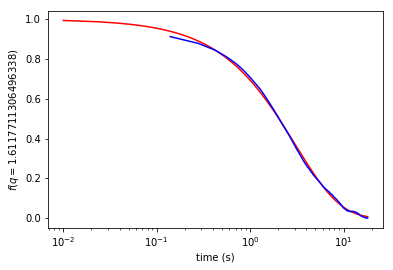

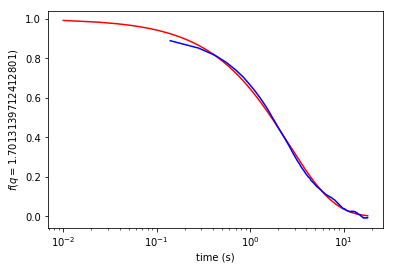

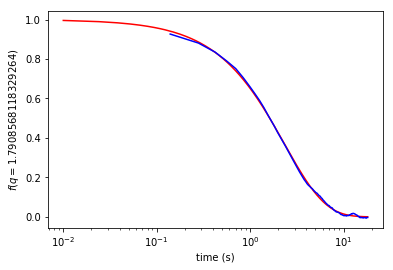

...

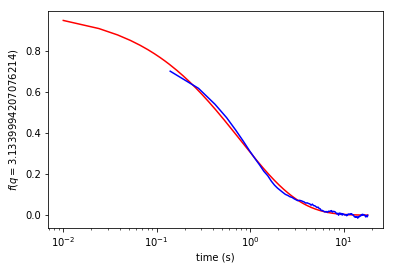

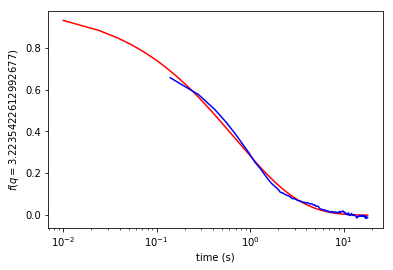

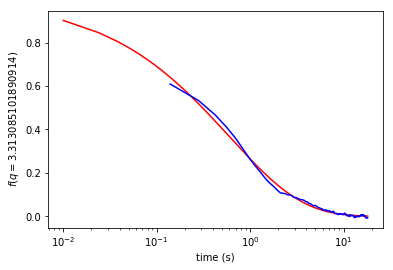

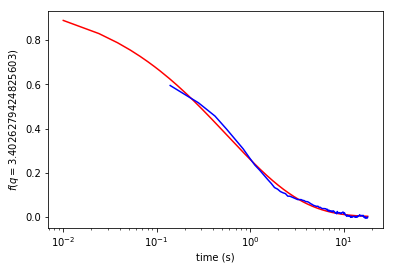

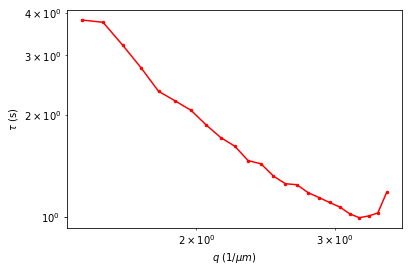

0.8222066070661085


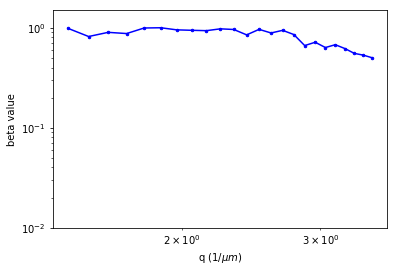

In [9]:
plt.show()
for qs in range ( 0, num -1 ):
    plt.show()
    plt.semilogx(apo22, f_q_fit[qs,:],'r-', ms = 5)
    plt.semilogx(apo_2, f_q[qs,:],'b-', ms = 5)
    plt.xlabel(r'time (s)')
    plt.ylabel(r'$f(q =$' + str((2*np.pi)*(qs + ini)/(d_pix*256))+')')
    #print(f_q_fit[qs,:])
    np.savetxt(Filename + 'f_q_2_2_' + str((2*np.pi)*(qs + ini)/(d_pix*256))+ '.txt', np.c_[apo_2,f_q[qs,:]])
    np.savetxt(Filename + 'f_q_fit_2_2_' + str((2*np.pi)*(qs + ini)/(d_pix*256))+ '.txt', np.c_[apo22,f_q_fit[qs,:]])

    





plt.show()
plt.loglog(Q, Time, 'r.-', ms = 5)
plt.xlabel(r'$q$ ($1/ \mu m$)')
plt.ylabel(r'$\tau$ (s)')
plt.show()
plt.loglog(Q, Betas,'b.-', ms = 5)
plt.ylim((0.01, 1.5)) 
plt.xlabel(r'q ($1/ \mu m$)')
plt.ylabel(r'beta value')
media_bet = np.mean(Betas[:])
print(media_bet)

In [10]:
np.savetxt(Filename + 'tau_vs_q2_2' + '.txt', np.c_[Q**2, Time])
np.savetxt(Filename + 'beta_vs_q_2' + '.txt', np.c_[Q, Betas])
np.savetxt(Filename + 'tau_vs_q_single_2' + '.txt', np.c_[Q, Time])
#np.savetxt(Filename + 'tau_vs_q2_3da' + '.txt', np.c_[Q**2, Time])
#np.savetxt(Filename + 'beta_vs_q_3da' + '.txt', np.c_[Q, Betas])

In [10]:
# Plotting correlation, obtaining A(q) 
i=0
num = 85
ini = 10
Q = np.zeros([num])
A_q_F = np.zeros([num])
C_q = np.zeros([num])
B_q_F = np.zeros([num])
f_q_corr = np.zeros([num, np.size(FQt_array[1:,1])])
f_q_fit_corr = np.zeros([num, np.size(FQt_array[1:,1])])
Time = np.zeros([num])

for h in range(ini,ini + num, 1):
    
    alli = FQt_array[1:,h] 
    apo = np.linspace( timestep, timestep*num_intervals, num_intervals-2 )
    plt.show()
    plt.semilogx(apo,alli, label='linear')
    
    q = (2*np.pi)*h/(d_pix*pixels)
    print(q)
    A_q_F[i] = FQt_array[1,h] 
    B_q_F[i] = FQt_array[0,h] - FQt_array[1,h]
    Q[i] = q
    i = i + 1

NameError: name 'FQt_array' is not defined

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001218  0.00012497 0.00012077 ... 0.00012623 0.00012077 0.00012497]
 [0.00011814 0.00013421 0.00012748 ... 0.00012428 0.00014618 0.00012196]
 [0.00011185 0.00012142 0.00010998 ... 0.00013065 0.00014296 0.00012733]
 ...
 [0.00012426 0.00014722 0.00011196 ... 0.00013464 0.00013461 0.00013738]
 [0.00011185 0.00012733 0.00014296 ... 0.00012058 0.00010998 0.00012142]
 [0.00011814 0.00012196 0.00014618 ... 0.00012415 0.00012748 0.00013421]]
el max de R es 362


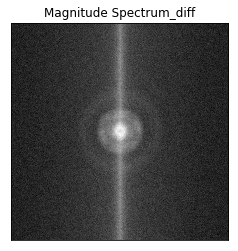

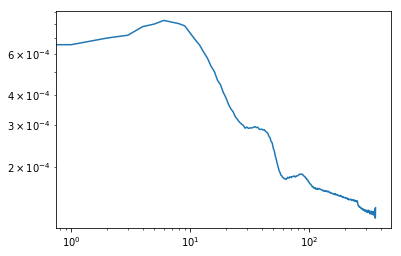

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012344 0.00013446 0.00011901 ... 0.00011281 0.00011901 0.00013446]
 [0.00011593 0.00013811 0.00012606 ... 0.000129   0.0001477  0.0001257 ]
 [0.00011473 0.00012647 0.00011269 ... 0.00012201 0.00011367 0.00012735]
 ...
 [0.00013973 0.0001238  0.00011966 ... 0.00012591 0.00012677 0.00013863]
 [0.00011473 0.00012735 0.00011367 ... 0.00012078 0.00011269 0.00012647]
 [0.00011593 0.0001257  0.0001477  ... 0.00012921 0.00012606 0.00013811]]
el max de R es 362


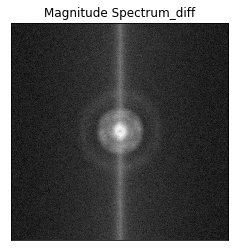

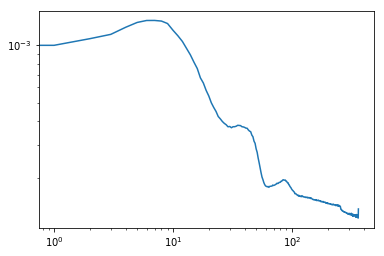

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012594 0.00013053 0.000131   ... 0.00011672 0.000131   0.00013053]
 [0.00011728 0.00013047 0.00013295 ... 0.00013385 0.00013308 0.00012368]
 [0.00011949 0.00012286 0.00010973 ... 0.00012244 0.00012321 0.00012828]
 ...
 [0.00013178 0.00014482 0.00010952 ... 0.00012702 0.00013006 0.00013836]
 [0.00011949 0.00012828 0.00012321 ... 0.00011351 0.00010973 0.00012286]
 [0.00011728 0.00012368 0.00013308 ... 0.00012396 0.00013295 0.00013047]]
el max de R es 362


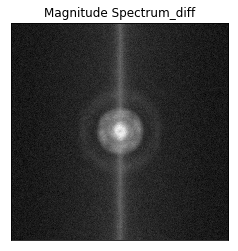

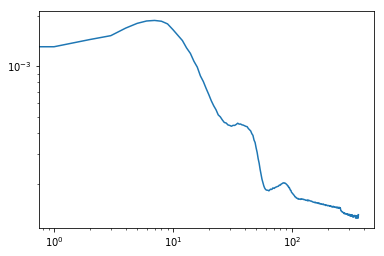

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012279 0.00012994 0.00013469 ... 0.00011409 0.00013469 0.00012994]
 [0.00012082 0.00012934 0.00012792 ... 0.00012885 0.00014403 0.00011995]
 [0.00011746 0.00012916 0.00011757 ... 0.000125   0.0001318  0.00013846]
 ...
 [0.00014537 0.00011853 0.00010831 ... 0.00012782 0.00013306 0.00014512]
 [0.00011746 0.00013846 0.0001318  ... 0.00011786 0.00011757 0.00012916]
 [0.00012082 0.00011995 0.00014403 ... 0.00012717 0.00012792 0.00012934]]
el max de R es 362


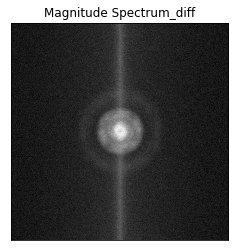

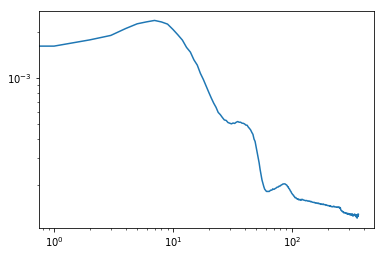

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013178 0.00012643 0.0001233  ... 0.00012964 0.0001233  0.00012643]
 [0.0001142  0.0001286  0.0001257  ... 0.00012584 0.0001335  0.00012194]
 [0.00011439 0.00013817 0.00010071 ... 0.00012013 0.00012095 0.00012233]
 ...
 [0.00013489 0.00014057 0.0001116  ... 0.00011758 0.00012585 0.0001402 ]
 [0.00011439 0.00012233 0.00012095 ... 0.00011636 0.00010071 0.00013817]
 [0.0001142  0.00012194 0.0001335  ... 0.0001377  0.0001257  0.0001286 ]]
el max de R es 362


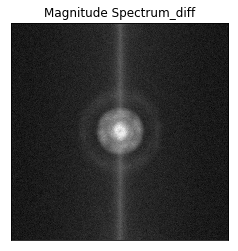

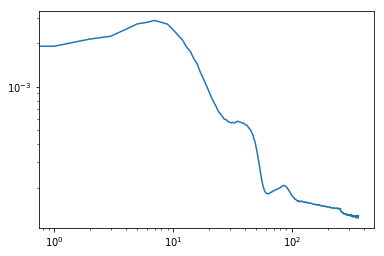

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014226 0.00012411 0.00013144 ... 0.00011359 0.00013144 0.00012411]
 [0.00011309 0.00014388 0.0001363  ... 0.00010259 0.0001451  0.00012645]
 [0.00010527 0.00012944 0.00010917 ... 0.00013179 0.00012774 0.00012932]
 ...
 [0.00013268 0.00013583 0.00011578 ... 0.00011925 0.00013097 0.00013704]
 [0.00010527 0.00012932 0.00012774 ... 0.00011475 0.00010917 0.00012944]
 [0.00011309 0.00012645 0.0001451  ... 0.00012356 0.0001363  0.00014388]]
el max de R es 362


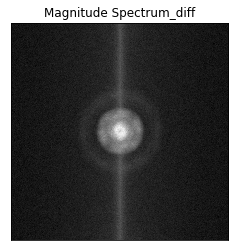

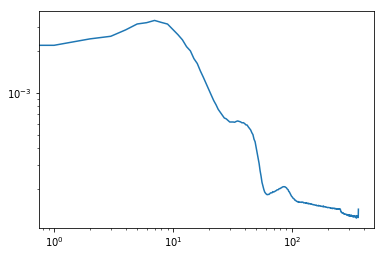

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013783 0.00012197 0.00012417 ... 0.0001178  0.00012417 0.00012197]
 [0.00012316 0.00012499 0.00012302 ... 0.00012505 0.00013555 0.00012617]
 [0.00011049 0.00013137 0.00011943 ... 0.00013372 0.00013223 0.00013067]
 ...
 [0.00013419 0.00013741 0.00011737 ... 0.00012783 0.00012891 0.00013293]
 [0.00011049 0.00013067 0.00013223 ... 0.000115   0.00011943 0.00013137]
 [0.00012316 0.00012617 0.00013555 ... 0.00012165 0.00012302 0.00012499]]
el max de R es 362


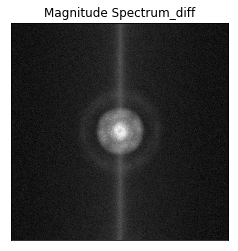

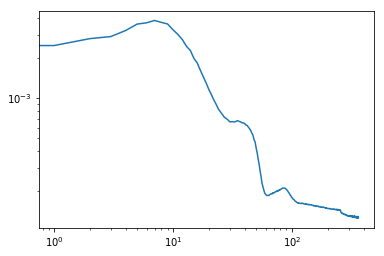

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013649 0.00012591 0.00012132 ... 0.00013416 0.00012132 0.00012591]
 [0.00012506 0.0001368  0.00012722 ... 0.00014083 0.00014213 0.00012702]
 [0.00011408 0.00012869 0.00011009 ... 0.00013174 0.00012612 0.0001324 ]
 ...
 [0.00014559 0.00013072 0.00012152 ... 0.0001372  0.00012751 0.00013171]
 [0.00011408 0.0001324  0.00012612 ... 0.00011399 0.00011009 0.00012869]
 [0.00012506 0.00012702 0.00014213 ... 0.00012691 0.00012722 0.0001368 ]]
el max de R es 362


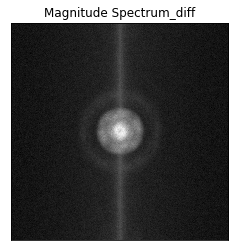

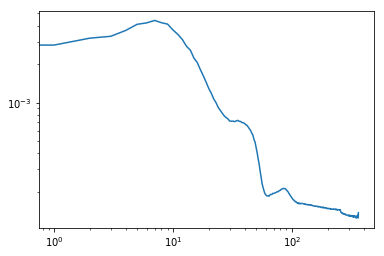

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001361  0.00012947 0.00012117 ... 0.00012476 0.00012117 0.00012947]
 [0.0001233  0.00013751 0.00013009 ... 0.00013065 0.00014309 0.00013018]
 [0.00011188 0.00013366 0.00010524 ... 0.00013027 0.00013168 0.00012961]
 ...
 [0.0001421  0.00013103 0.00011885 ... 0.00012498 0.00014387 0.00013806]
 [0.00011188 0.00012961 0.00013168 ... 0.00011724 0.00010524 0.00013366]
 [0.0001233  0.00013018 0.00014309 ... 0.00012869 0.00013009 0.00013751]]
el max de R es 362


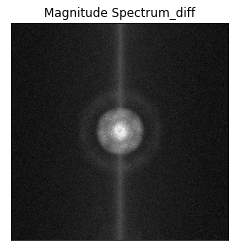

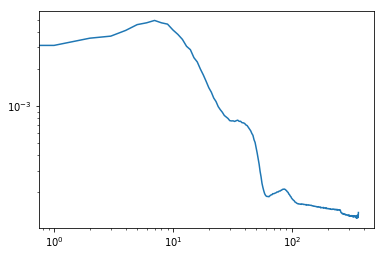

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011989 0.0001344  0.0001338  ... 0.00011822 0.0001338  0.0001344 ]
 [0.00012801 0.00014181 0.00013292 ... 0.00013143 0.000142   0.00012913]
 [0.00011997 0.00012421 0.00010852 ... 0.00012104 0.00012796 0.00012661]
 ...
 [0.00012041 0.00012811 0.00011814 ... 0.00013445 0.00013439 0.00013671]
 [0.00011997 0.00012661 0.00012796 ... 0.00012133 0.00010852 0.00012421]
 [0.00012801 0.00012913 0.000142   ... 0.00013062 0.00013292 0.00014181]]
el max de R es 362


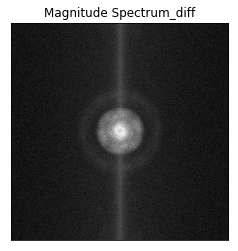

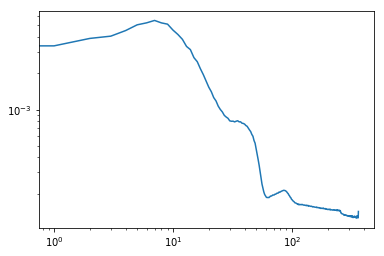

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013474 0.00012081 0.00011508 ... 0.00013419 0.00011508 0.00012081]
 [0.00012731 0.00013856 0.00012314 ... 0.00012075 0.00013747 0.00012201]
 [0.00011905 0.00013482 0.00010122 ... 0.00012144 0.00013156 0.00013413]
 ...
 [0.00013371 0.00013267 0.00011228 ... 0.00013092 0.000136   0.00012946]
 [0.00011905 0.00013413 0.00013156 ... 0.00012063 0.00010122 0.00013482]
 [0.00012731 0.00012201 0.00013747 ... 0.00012682 0.00012314 0.00013856]]
el max de R es 362


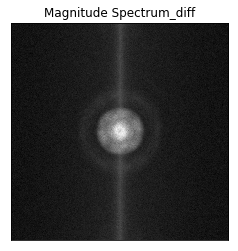

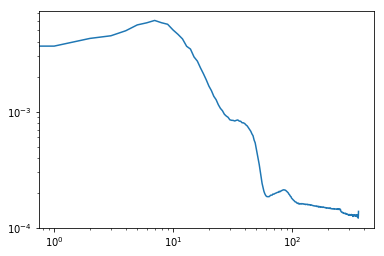

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012165 0.00012518 0.00012845 ... 0.00012215 0.00012845 0.00012518]
 [0.0001146  0.0001241  0.00013818 ... 0.00011937 0.00013045 0.00012913]
 [0.00011255 0.00012345 0.00010981 ... 0.00013387 0.00013112 0.00013518]
 ...
 [0.00013893 0.00013882 0.0001218  ... 0.00012177 0.00012683 0.00013911]
 [0.00011255 0.00013518 0.00013112 ... 0.00011807 0.00010981 0.00012345]
 [0.0001146  0.00012913 0.00013045 ... 0.00012628 0.00013818 0.0001241 ]]
el max de R es 362


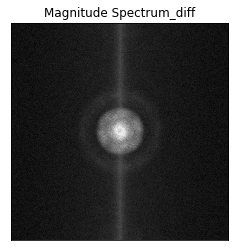

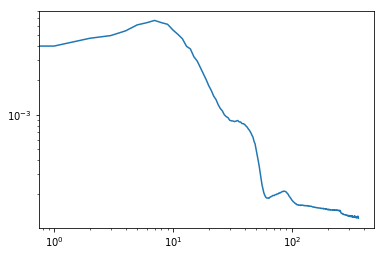

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001414  0.00013005 0.00012054 ... 0.00011807 0.00012054 0.00013005]
 [0.00012699 0.00013144 0.00012995 ... 0.0001223  0.00013669 0.00012457]
 [0.00010916 0.00013072 0.00010358 ... 0.00012569 0.00012668 0.00013404]
 ...
 [0.00013656 0.00013571 0.00011468 ... 0.00012675 0.00012862 0.00013753]
 [0.00010916 0.00013404 0.00012668 ... 0.00011049 0.00010358 0.00013072]
 [0.00012699 0.00012457 0.00013669 ... 0.00012174 0.00012995 0.00013144]]
el max de R es 362


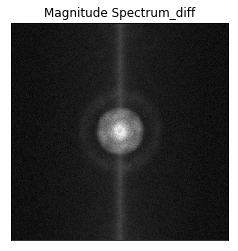

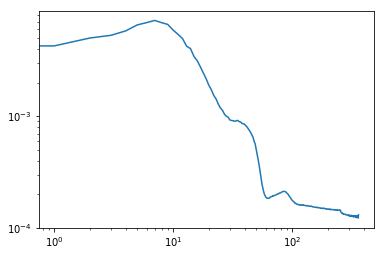

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011759 0.00012328 0.0001272  ... 0.00012149 0.0001272  0.00012328]
 [0.00011466 0.00012908 0.00013421 ... 0.00013202 0.00013561 0.00010965]
 [0.00010938 0.00013055 0.00010775 ... 0.00012564 0.00012334 0.00012576]
 ...
 [0.00013765 0.00012808 0.00011259 ... 0.00012463 0.00012472 0.00014222]
 [0.00010938 0.00012576 0.00012334 ... 0.00011288 0.00010775 0.00013055]
 [0.00011466 0.00010965 0.00013561 ... 0.00013352 0.00013421 0.00012908]]
el max de R es 362


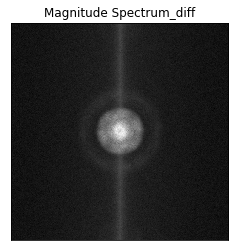

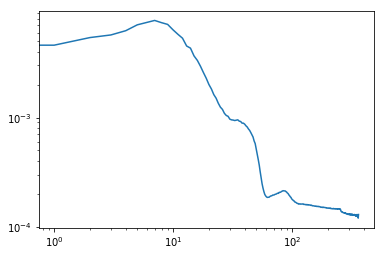

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.000123   0.00012742 0.00013084 ... 0.0001257  0.00013084 0.00012742]
 [0.00013091 0.00013107 0.00014079 ... 0.00012759 0.00014254 0.0001235 ]
 [0.0001211  0.00012127 0.00011967 ... 0.0001195  0.00012879 0.0001255 ]
 ...
 [0.00014216 0.00012564 0.00012569 ... 0.00012439 0.00012659 0.0001339 ]
 [0.0001211  0.0001255  0.00012879 ... 0.00011011 0.00011967 0.00012127]
 [0.00013091 0.0001235  0.00014254 ... 0.00012944 0.00014079 0.00013107]]
el max de R es 362


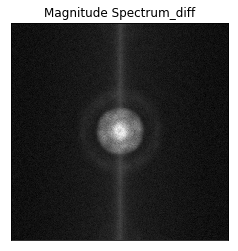

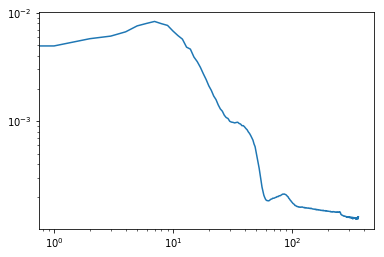

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013439 0.00012373 0.00012946 ... 0.00013002 0.00012946 0.00012373]
 [0.00012031 0.00013219 0.00012051 ... 0.00012761 0.00013475 0.00012791]
 [0.00012273 0.0001305  0.00010296 ... 0.00012656 0.00012741 0.00012947]
 ...
 [0.00014217 0.00013458 0.00010972 ... 0.00012728 0.00012497 0.00013973]
 [0.00012273 0.00012947 0.00012741 ... 0.00011256 0.00010296 0.0001305 ]
 [0.00012031 0.00012791 0.00013475 ... 0.00013523 0.00012051 0.00013219]]
el max de R es 362


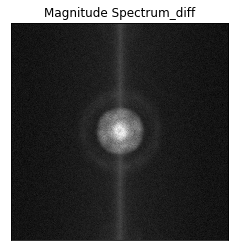

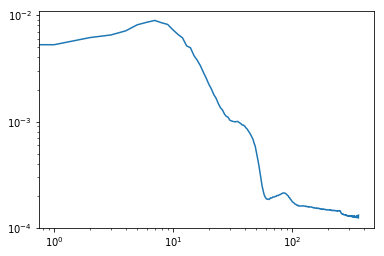

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013755 0.00011976 0.0001218  ... 0.00011387 0.0001218  0.00011976]
 [0.00011907 0.00012769 0.00014745 ... 0.00011762 0.00013543 0.00011466]
 [0.00012285 0.00013025 0.00011332 ... 0.00013023 0.00012864 0.00013389]
 ...
 [0.00014755 0.00013594 0.00011264 ... 0.00012651 0.00013039 0.00013719]
 [0.00012285 0.00013389 0.00012864 ... 0.00011741 0.00011332 0.00013025]
 [0.00011907 0.00011466 0.00013543 ... 0.00014116 0.00014745 0.00012769]]
el max de R es 362


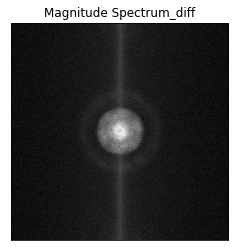

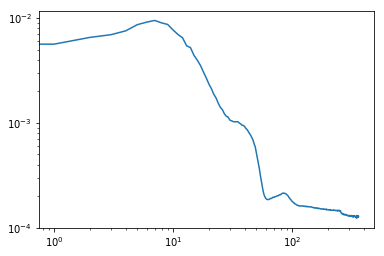

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014181 0.00012007 0.00012335 ... 0.0001232  0.00012335 0.00012007]
 [0.0001213  0.00012432 0.00013546 ... 0.00012122 0.00014741 0.00011634]
 [0.00011705 0.00012632 0.00011636 ... 0.00011881 0.00013478 0.00012612]
 ...
 [0.00013754 0.00014323 0.00011079 ... 0.00012903 0.00011572 0.0001424 ]
 [0.00011705 0.00012612 0.00013478 ... 0.00011407 0.00011636 0.00012632]
 [0.0001213  0.00011634 0.00014741 ... 0.00012885 0.00013546 0.00012432]]
el max de R es 362


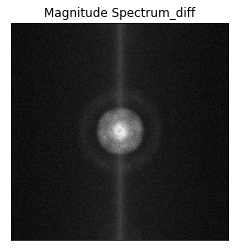

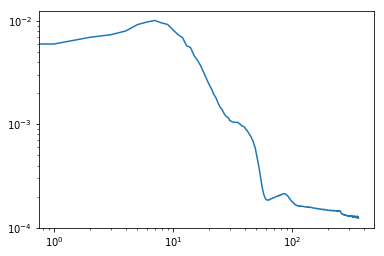

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012036 0.00012137 0.00011779 ... 0.00011893 0.00011779 0.00012137]
 [0.0001189  0.00014491 0.00013652 ... 0.00012414 0.00013956 0.00012649]
 [0.00010849 0.00013663 0.00010904 ... 0.00013614 0.00011502 0.0001317 ]
 ...
 [0.00013766 0.00013214 0.000117   ... 0.00012333 0.0001362  0.00014205]
 [0.00010849 0.0001317  0.00011502 ... 0.00012014 0.00010904 0.00013663]
 [0.0001189  0.00012649 0.00013956 ... 0.00012242 0.00013652 0.00014491]]
el max de R es 362


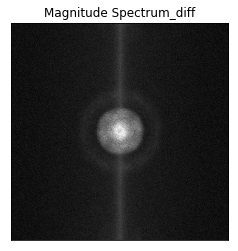

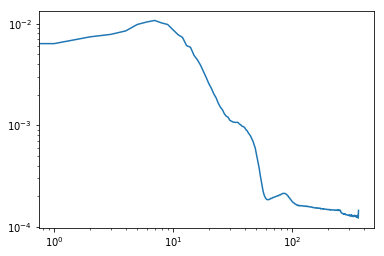

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012378 0.00013703 0.00011599 ... 0.00012226 0.00011599 0.00013703]
 [0.00012502 0.00013289 0.00013379 ... 0.00013008 0.00014075 0.00011547]
 [0.00010025 0.00014539 0.00010485 ... 0.00012775 0.00012761 0.00011565]
 ...
 [0.00014149 0.00013798 0.0001063  ... 0.00012289 0.00012371 0.00013606]
 [0.00010025 0.00011565 0.00012761 ... 0.00011368 0.00010485 0.00014539]
 [0.00012502 0.00011547 0.00014075 ... 0.00013278 0.00013379 0.00013289]]
el max de R es 362


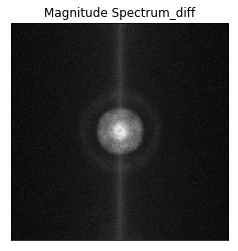

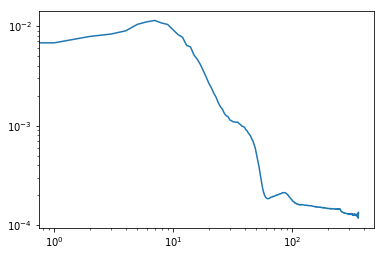

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013943 0.00012078 0.00013214 ... 0.00011835 0.00013214 0.00012078]
 [0.00012733 0.0001236  0.0001348  ... 0.00011546 0.00014331 0.00011903]
 [0.00011682 0.00013135 0.00010643 ... 0.00012738 0.00013215 0.00011768]
 ...
 [0.00013414 0.00013078 0.0001108  ... 0.00011586 0.00012336 0.00013935]
 [0.00011682 0.00011768 0.00013215 ... 0.00010857 0.00010643 0.00013135]
 [0.00012733 0.00011903 0.00014331 ... 0.00013311 0.0001348  0.0001236 ]]
el max de R es 362


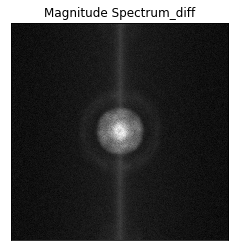

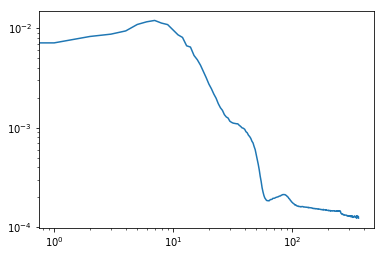

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011147 0.00013363 0.00012578 ... 0.0001271  0.00012578 0.00013363]
 [0.00011217 0.00013575 0.00012748 ... 0.0001226  0.00013759 0.00012007]
 [0.00011981 0.00013127 0.00010604 ... 0.00012488 0.00011588 0.00013161]
 ...
 [0.00013092 0.00014009 0.00011412 ... 0.00012387 0.00013555 0.00013749]
 [0.00011981 0.00013161 0.00011588 ... 0.00011518 0.00010604 0.00013127]
 [0.00011217 0.00012007 0.00013759 ... 0.00013935 0.00012748 0.00013575]]
el max de R es 362


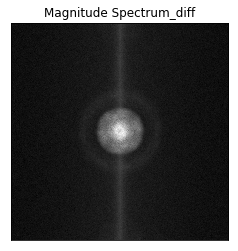

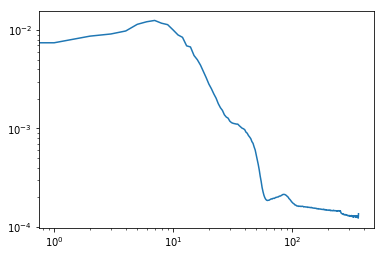

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011781 0.00013072 0.00014309 ... 0.000124   0.00014309 0.00013072]
 [0.00011445 0.0001414  0.00013525 ... 0.00012568 0.00013587 0.00011783]
 [0.00011799 0.00013317 0.00010406 ... 0.00013482 0.00013411 0.00012909]
 ...
 [0.00012678 0.0001349  0.00011166 ... 0.00011734 0.00012688 0.00014283]
 [0.00011799 0.00012909 0.00013411 ... 0.000113   0.00010406 0.00013317]
 [0.00011445 0.00011783 0.00013587 ... 0.00012972 0.00013525 0.0001414 ]]
el max de R es 362


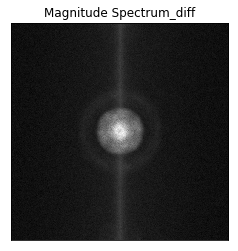

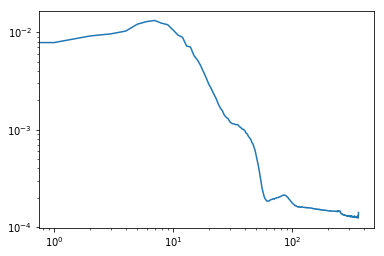

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012159 0.00012479 0.00012988 ... 0.00012612 0.00012988 0.00012479]
 [0.00011608 0.00013673 0.00013468 ... 0.0001363  0.00014    0.00011978]
 [0.00010859 0.00013062 0.00010521 ... 0.00013475 0.00012366 0.00012233]
 ...
 [0.00013671 0.0001407  0.00010593 ... 0.00012357 0.00013129 0.00014714]
 [0.00010859 0.00012233 0.00012366 ... 0.00011383 0.00010521 0.00013062]
 [0.00011608 0.00011978 0.00014    ... 0.00013628 0.00013468 0.00013673]]
el max de R es 362


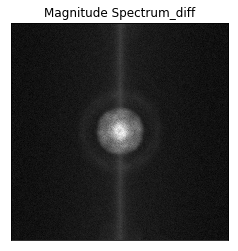

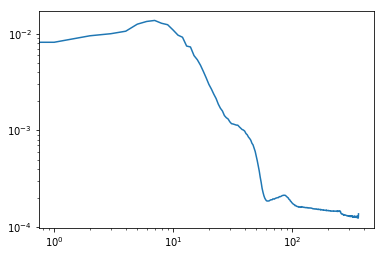

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011769 0.0001149  0.00012489 ... 0.00012559 0.00012489 0.0001149 ]
 [0.00012622 0.00013452 0.00014087 ... 0.00012193 0.00013556 0.00011559]
 [0.00011809 0.00012536 0.00011019 ... 0.00012328 0.00012781 0.00012836]
 ...
 [0.00012931 0.0001317  0.00011653 ... 0.00012289 0.00012896 0.00014326]
 [0.00011809 0.00012836 0.00012781 ... 0.00012506 0.00011019 0.00012536]
 [0.00012622 0.00011559 0.00013556 ... 0.00013079 0.00014087 0.00013452]]
el max de R es 362


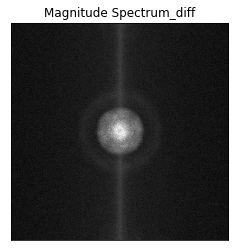

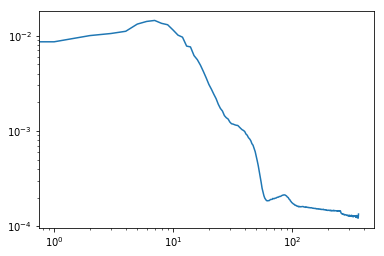

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001201  0.0001282  0.00012503 ... 0.00012482 0.00012503 0.0001282 ]
 [0.00011822 0.0001278  0.00011625 ... 0.00011749 0.00014164 0.00011974]
 [0.00011514 0.00011962 0.00011207 ... 0.00012596 0.00013177 0.00013014]
 ...
 [0.00013088 0.00013993 0.00011837 ... 0.00011706 0.00011709 0.00013695]
 [0.00011514 0.00013014 0.00013177 ... 0.00011141 0.00011207 0.00011962]
 [0.00011822 0.00011974 0.00014164 ... 0.00012991 0.00011625 0.0001278 ]]
el max de R es 362


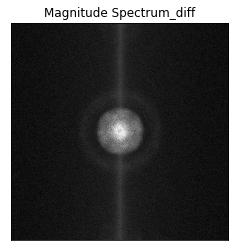

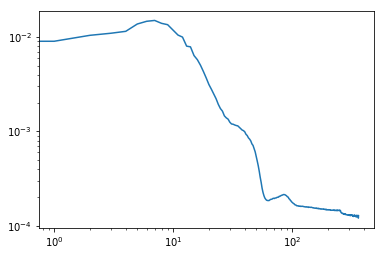

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012944 0.00011908 0.00012326 ... 0.00012142 0.00012326 0.00011908]
 [0.00012956 0.00013248 0.00012425 ... 0.00012258 0.00013084 0.00012596]
 [0.00011044 0.00012546 0.00011154 ... 0.00013064 0.00012481 0.00014015]
 ...
 [0.00013402 0.00012624 0.00011158 ... 0.0001239  0.00013945 0.00014461]
 [0.00011044 0.00014015 0.00012481 ... 0.00011373 0.00011154 0.00012546]
 [0.00012956 0.00012596 0.00013084 ... 0.00013361 0.00012425 0.00013248]]
el max de R es 362


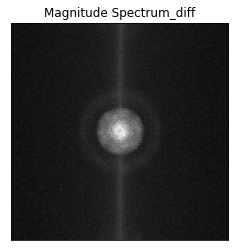

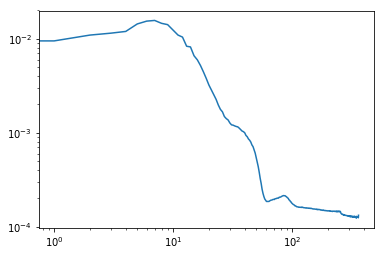

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013849 0.00012687 0.00011434 ... 0.00012673 0.00011434 0.00012687]
 [0.00012336 0.00013824 0.00012981 ... 0.00011531 0.00014265 0.00012027]
 [0.00011583 0.00012388 0.00010728 ... 0.00012163 0.00013701 0.00012237]
 ...
 [0.00013507 0.00013574 0.00011179 ... 0.00012982 0.00012768 0.00013598]
 [0.00011583 0.00012237 0.00013701 ... 0.00011311 0.00010728 0.00012388]
 [0.00012336 0.00012027 0.00014265 ... 0.00013733 0.00012981 0.00013824]]
el max de R es 362


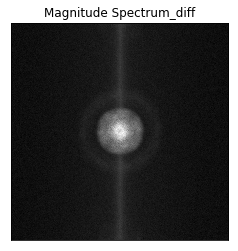

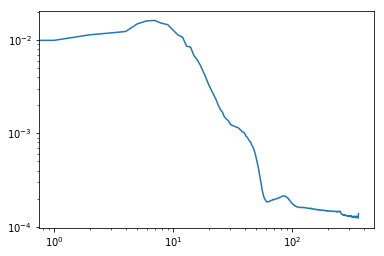

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012819 0.00012739 0.00012193 ... 0.00012666 0.00012193 0.00012739]
 [0.00012254 0.00012392 0.00013317 ... 0.00012003 0.00013991 0.00011888]
 [0.00011592 0.00012636 0.00010963 ... 0.00012252 0.00012181 0.00011881]
 ...
 [0.00013241 0.00012832 0.00012703 ... 0.00012592 0.00012832 0.00013532]
 [0.00011592 0.00011881 0.00012181 ... 0.00010857 0.00010963 0.00012636]
 [0.00012254 0.00011888 0.00013991 ... 0.00014014 0.00013317 0.00012392]]
el max de R es 362


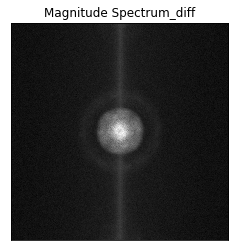

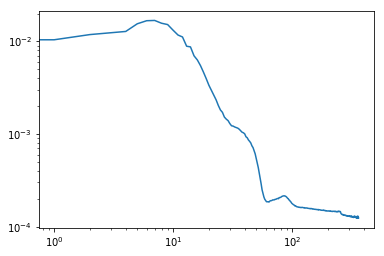

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013168 0.00013728 0.00012799 ... 0.00013008 0.00012799 0.00013728]
 [0.00013293 0.0001263  0.00014175 ... 0.00012446 0.00013486 0.00012032]
 [0.00011647 0.00012376 0.00010458 ... 0.00012352 0.00012646 0.00012807]
 ...
 [0.00013567 0.00013098 0.00011443 ... 0.00012118 0.00013386 0.00013206]
 [0.00011647 0.00012807 0.00012646 ... 0.00010324 0.00010458 0.00012376]
 [0.00013293 0.00012032 0.00013486 ... 0.0001365  0.00014175 0.0001263 ]]
el max de R es 362


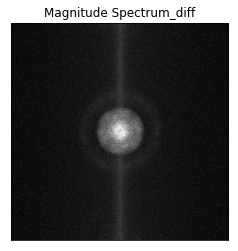

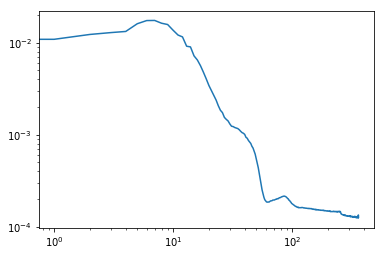

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013031 0.00013183 0.00012612 ... 0.00012371 0.00012612 0.00013183]
 [0.00011767 0.00013527 0.00012583 ... 0.00011644 0.00014147 0.00011936]
 [0.00011455 0.00012236 0.00011271 ... 0.00011153 0.00013053 0.00013334]
 ...
 [0.00013706 0.00013099 0.0001092  ... 0.00011441 0.00011536 0.00014684]
 [0.00011455 0.00013334 0.00013053 ... 0.00011241 0.00011271 0.00012236]
 [0.00011767 0.00011936 0.00014147 ... 0.00014501 0.00012583 0.00013527]]
el max de R es 362


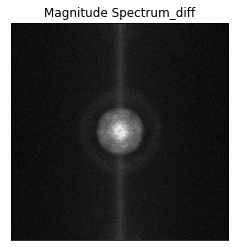

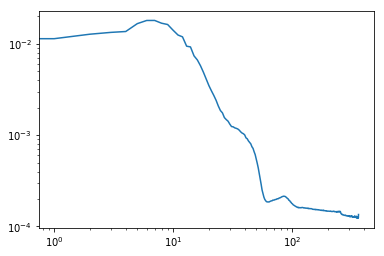

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013899 0.00012511 0.00011269 ... 0.00013485 0.00011269 0.00012511]
 [0.00012371 0.00012623 0.00013051 ... 0.00011735 0.00012559 0.00011964]
 [0.00011098 0.00013256 0.0001075  ... 0.0001205  0.0001366  0.00013892]
 ...
 [0.00014075 0.00013035 0.00011467 ... 0.0001191  0.00012687 0.00013957]
 [0.00011098 0.00013892 0.0001366  ... 0.00011621 0.0001075  0.00013256]
 [0.00012371 0.00011964 0.00012559 ... 0.00013827 0.00013051 0.00012623]]
el max de R es 362


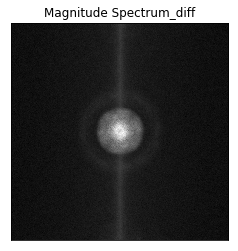

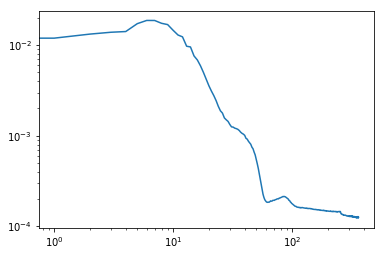

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012327 0.00012253 0.00011564 ... 0.0001248  0.00011564 0.00012253]
 [0.00012467 0.00012831 0.00013661 ... 0.0001231  0.00015548 0.00012454]
 [0.00012466 0.0001289  0.00010664 ... 0.00012139 0.00012348 0.00012276]
 ...
 [0.00015293 0.00013306 0.00010982 ... 0.00012163 0.00013182 0.00013377]
 [0.00012466 0.00012276 0.00012348 ... 0.00012291 0.00010664 0.0001289 ]
 [0.00012467 0.00012454 0.00015548 ... 0.00013204 0.00013661 0.00012831]]
el max de R es 362


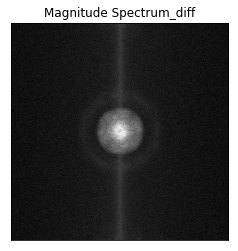

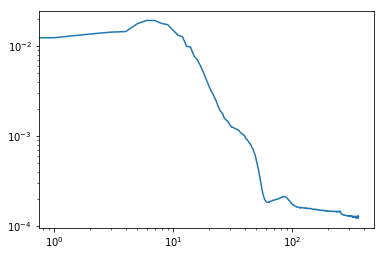

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001099  0.00011495 0.00012112 ... 0.00012768 0.00012112 0.00011495]
 [0.00011676 0.00012292 0.00012736 ... 0.00011344 0.0001437  0.00011719]
 [0.00010973 0.00012074 0.00010777 ... 0.00012795 0.00012544 0.00012603]
 ...
 [0.0001453  0.00013696 0.00011427 ... 0.00012562 0.00012974 0.00014393]
 [0.00010973 0.00012603 0.00012544 ... 0.00012272 0.00010777 0.00012074]
 [0.00011676 0.00011719 0.0001437  ... 0.00013378 0.00012736 0.00012292]]
el max de R es 362


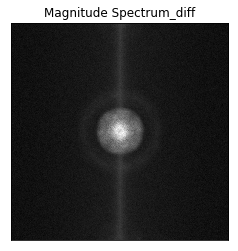

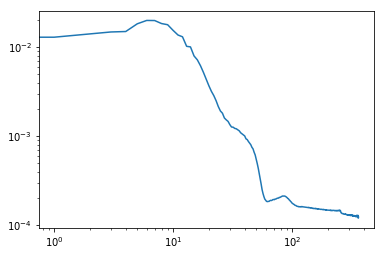

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012467 0.00013194 0.00011885 ... 0.00013109 0.00011885 0.00013194]
 [0.00011286 0.00013585 0.00012073 ... 0.00012563 0.00012988 0.0001159 ]
 [0.00011399 0.00013323 0.00011086 ... 0.0001293  0.0001294  0.00012076]
 ...
 [0.00013705 0.00014231 0.00011319 ... 0.00012536 0.00012862 0.00015029]
 [0.00011399 0.00012076 0.0001294  ... 0.00010444 0.00011086 0.00013323]
 [0.00011286 0.0001159  0.00012988 ... 0.0001352  0.00012073 0.00013585]]
el max de R es 362


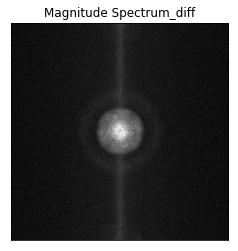

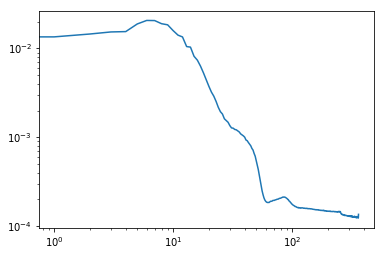

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012517 0.00011865 0.00013907 ... 0.00012783 0.00013907 0.00011865]
 [0.00011943 0.0001339  0.00012582 ... 0.00012307 0.00013606 0.00012432]
 [0.00011756 0.00012342 0.00011515 ... 0.00012116 0.00012892 0.00012795]
 ...
 [0.00013144 0.00011542 0.00010642 ... 0.0001091  0.00013075 0.00013606]
 [0.00011756 0.00012795 0.00012892 ... 0.00010548 0.00011515 0.00012342]
 [0.00011943 0.00012432 0.00013606 ... 0.00013466 0.00012582 0.0001339 ]]
el max de R es 362


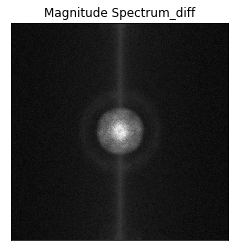

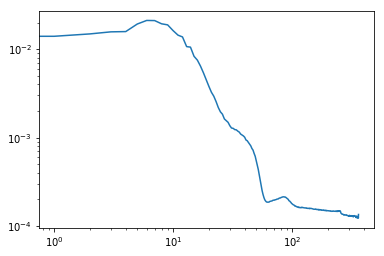

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012869 0.00012611 0.00012342 ... 0.00013206 0.00012342 0.00012611]
 [0.00012839 0.00013224 0.00013546 ... 0.00011956 0.00013643 0.00011441]
 [0.00011366 0.00012509 0.00011259 ... 0.00012991 0.00012435 0.00013146]
 ...
 [0.00012468 0.00014394 0.00011096 ... 0.00012179 0.00012498 0.00012739]
 [0.00011366 0.00013146 0.00012435 ... 0.00011782 0.00011259 0.00012509]
 [0.00012839 0.00011441 0.00013643 ... 0.00014132 0.00013546 0.00013224]]
el max de R es 362


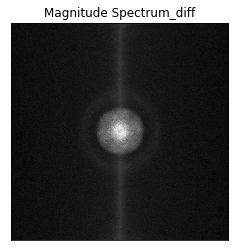

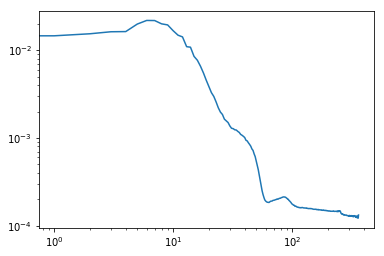

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012979 0.00013004 0.00013362 ... 0.00012369 0.00013362 0.00013004]
 [0.00011977 0.00012942 0.00013776 ... 0.0001191  0.00014503 0.00011572]
 [0.00010796 0.00013578 0.0001086  ... 0.00012014 0.0001189  0.00013177]
 ...
 [0.00014022 0.00013652 0.00011128 ... 0.00011881 0.00012105 0.00014993]
 [0.00010796 0.00013177 0.0001189  ... 0.00010907 0.0001086  0.00013578]
 [0.00011977 0.00011572 0.00014503 ... 0.00014379 0.00013776 0.00012942]]
el max de R es 362


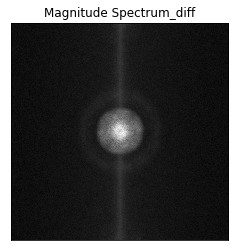

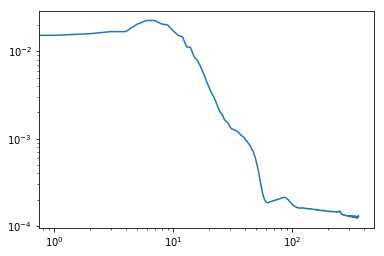

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011541 0.00012578 0.00012434 ... 0.00013114 0.00012434 0.00012578]
 [0.00012262 0.00012207 0.0001231  ... 0.00011755 0.00012542 0.00010202]
 [0.00011264 0.00012354 0.00010859 ... 0.00013137 0.00011956 0.00012273]
 ...
 [0.00013104 0.00014379 0.00013203 ... 0.00011874 0.00013998 0.00014326]
 [0.00011264 0.00012273 0.00011956 ... 0.00012163 0.00010859 0.00012354]
 [0.00012262 0.00010202 0.00012542 ... 0.00012901 0.0001231  0.00012207]]
el max de R es 362


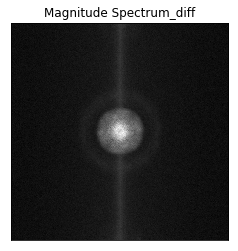

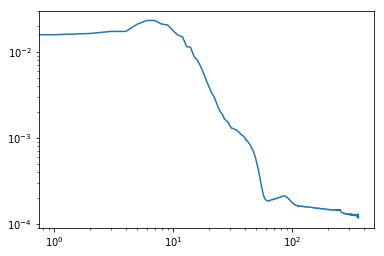

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[1.34022237e-04 1.24388607e-04 1.25259350e-04 ... 1.30093424e-04
  1.25259350e-04 1.24388607e-04]
 [1.04926774e-04 1.46271195e-04 1.35964670e-04 ... 1.24703540e-04
  1.49183441e-04 1.23752659e-04]
 [9.99805634e-05 1.23571968e-04 1.08173779e-04 ... 1.31836598e-04
  1.34895818e-04 1.26048370e-04]
 ...
 [1.30279979e-04 1.24924030e-04 1.08588858e-04 ... 1.31481225e-04
  1.32375455e-04 1.45797312e-04]
 [9.99805634e-05 1.26048370e-04 1.34895818e-04 ... 1.20349832e-04
  1.08173779e-04 1.23571968e-04]
 [1.04926774e-04 1.23752659e-04 1.49183441e-04 ... 1.27725143e-04
  1.35964670e-04 1.46271195e-04]]
el max de R es 362


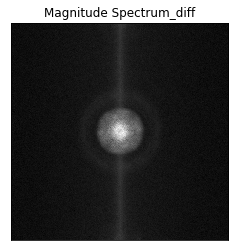

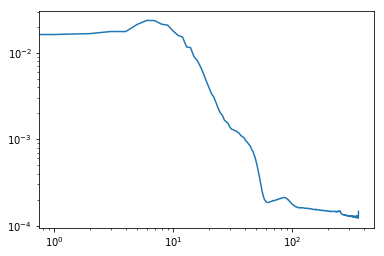

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[1.18165284e-04 1.33844951e-04 1.36884439e-04 ... 1.47056737e-04
  1.36884439e-04 1.33844951e-04]
 [1.17671647e-04 1.36269227e-04 1.36695104e-04 ... 1.18267984e-04
  1.35199240e-04 1.22979836e-04]
 [1.08140492e-04 1.31043053e-04 1.11809015e-04 ... 1.25008271e-04
  1.22949496e-04 1.22190337e-04]
 ...
 [1.21809950e-04 1.36191316e-04 9.93888098e-05 ... 1.24101847e-04
  1.31527340e-04 1.40530974e-04]
 [1.08140492e-04 1.22190337e-04 1.22949496e-04 ... 1.24568745e-04
  1.11809015e-04 1.31043053e-04]
 [1.17671647e-04 1.22979836e-04 1.35199240e-04 ... 1.35601178e-04
  1.36695104e-04 1.36269227e-04]]
el max de R es 362


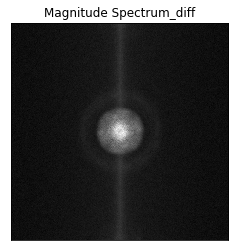

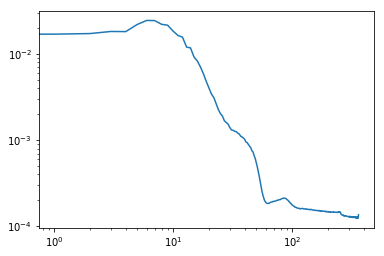

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012793 0.00013693 0.00011343 ... 0.00013545 0.00011343 0.00013693]
 [0.00012337 0.00013333 0.00012128 ... 0.00012039 0.00012746 0.00011585]
 [0.00011925 0.00013444 0.00010721 ... 0.00012385 0.00013184 0.00012431]
 ...
 [0.00013254 0.00014154 0.00011055 ... 0.00012949 0.00013286 0.00013229]
 [0.00011925 0.00012431 0.00013184 ... 0.00010993 0.00010721 0.00013444]
 [0.00012337 0.00011585 0.00012746 ... 0.00013102 0.00012128 0.00013333]]
el max de R es 362


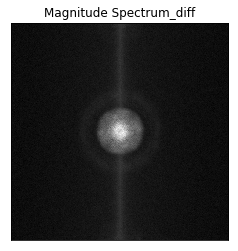

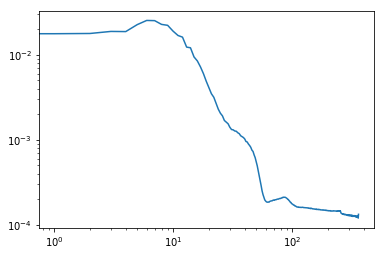

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013414 0.00012131 0.00012319 ... 0.00013464 0.00012319 0.00012131]
 [0.00012345 0.0001407  0.00013568 ... 0.00011515 0.00013578 0.00011721]
 [0.00012347 0.00011907 0.00010273 ... 0.00012833 0.00013226 0.00013203]
 ...
 [0.00013624 0.00013953 0.00012741 ... 0.00012423 0.00013694 0.00014385]
 [0.00012347 0.00013203 0.00013226 ... 0.00011601 0.00010273 0.00011907]
 [0.00012345 0.00011721 0.00013578 ... 0.00013113 0.00013568 0.0001407 ]]
el max de R es 362


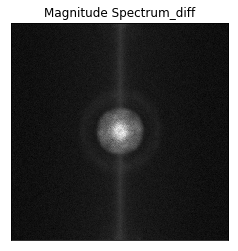

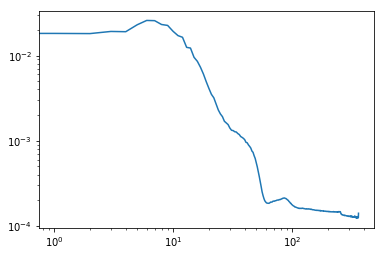

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011818 0.00011733 0.00011694 ... 0.00013746 0.00011694 0.00011733]
 [0.00011975 0.00014113 0.00012447 ... 0.00012632 0.00013536 0.0001156 ]
 [0.00010698 0.00012311 0.00010611 ... 0.00013507 0.00011404 0.00012461]
 ...
 [0.00012828 0.00013267 0.00011807 ... 0.00012108 0.00012678 0.00013145]
 [0.00010698 0.00012461 0.00011404 ... 0.00011914 0.00010611 0.00012311]
 [0.00011975 0.0001156  0.00013536 ... 0.00013427 0.00012447 0.00014113]]
el max de R es 362


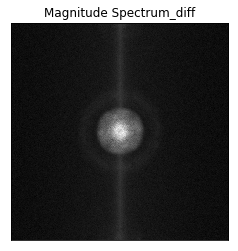

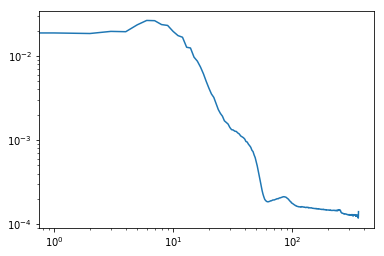

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012755 0.00013282 0.00011473 ... 0.00014098 0.00011473 0.00013282]
 [0.00012102 0.00013409 0.00013689 ... 0.00013051 0.00014652 0.00012922]
 [0.00011252 0.00012546 0.00011061 ... 0.00012366 0.0001305  0.00012755]
 ...
 [0.00013515 0.0001362  0.00011398 ... 0.00011189 0.00012742 0.0001347 ]
 [0.00011252 0.00012755 0.0001305  ... 0.0001156  0.00011061 0.00012546]
 [0.00012102 0.00012922 0.00014652 ... 0.00014168 0.00013689 0.00013409]]
el max de R es 362


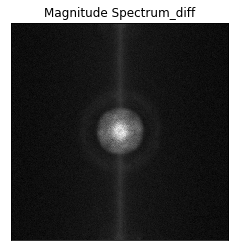

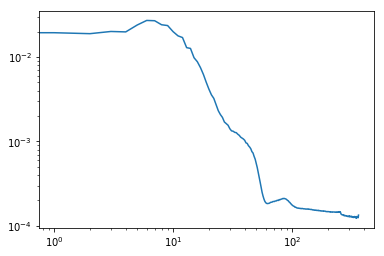

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012168 0.00011932 0.00012591 ... 0.00013084 0.00012591 0.00011932]
 [0.00011457 0.00012695 0.00012611 ... 0.00012339 0.00012621 0.0001226 ]
 [0.00011116 0.00012678 0.00010704 ... 0.00012703 0.00012009 0.0001282 ]
 ...
 [0.00012311 0.00014039 0.00011749 ... 0.00012837 0.00012107 0.00014797]
 [0.00011116 0.0001282  0.00012009 ... 0.00013002 0.00010704 0.00012678]
 [0.00011457 0.0001226  0.00012621 ... 0.00014159 0.00012611 0.00012695]]
el max de R es 362


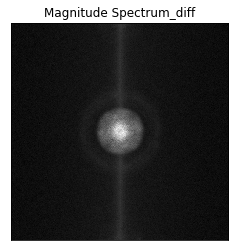

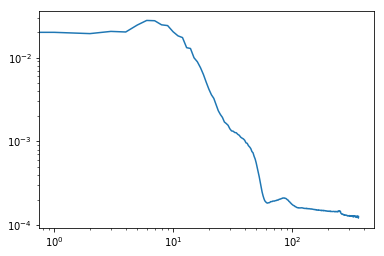

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001361  0.00012321 0.00013266 ... 0.00014262 0.00013266 0.00012321]
 [0.00012809 0.00013839 0.00013784 ... 0.00011598 0.00014306 0.00011191]
 [0.00010834 0.00012497 0.00010693 ... 0.00012733 0.00012394 0.00013067]
 ...
 [0.00013759 0.00014099 0.00010866 ... 0.00012778 0.00013283 0.00014389]
 [0.00010834 0.00013067 0.00012394 ... 0.00012545 0.00010693 0.00012497]
 [0.00012809 0.00011191 0.00014306 ... 0.00013157 0.00013784 0.00013839]]
el max de R es 362


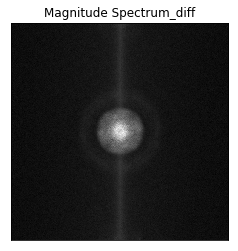

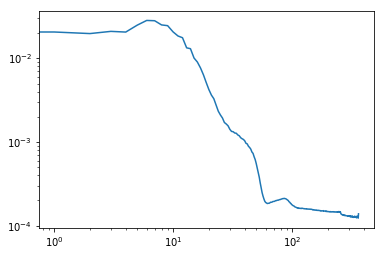

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012082 0.00012525 0.00012229 ... 0.00012403 0.00012229 0.00012525]
 [0.00012336 0.00013799 0.00013682 ... 0.00011136 0.0001283  0.00012206]
 [0.00010132 0.00012683 0.00010773 ... 0.00014114 0.00012905 0.0001281 ]
 ...
 [0.00014003 0.00014092 0.00011569 ... 0.00012632 0.00013523 0.00013268]
 [0.00010132 0.0001281  0.00012905 ... 0.00011007 0.00010773 0.00012683]
 [0.00012336 0.00012206 0.0001283  ... 0.00011793 0.00013682 0.00013799]]
el max de R es 362


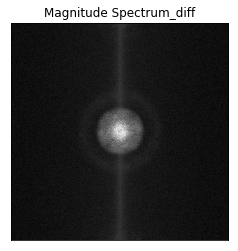

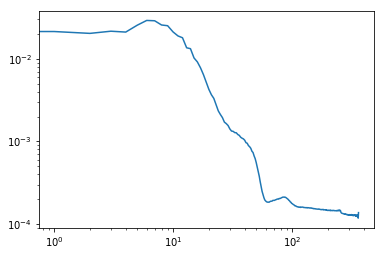

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013039 0.00012786 0.00013139 ... 0.00012157 0.00013139 0.00012786]
 [0.00012355 0.00013272 0.00013499 ... 0.0001293  0.00013778 0.00012392]
 [0.00011508 0.00012651 0.00011205 ... 0.00012145 0.00013612 0.00011792]
 ...
 [0.00012601 0.00013282 0.00011568 ... 0.00012067 0.0001102  0.00012549]
 [0.00011508 0.00011792 0.00013612 ... 0.00011092 0.00011205 0.00012651]
 [0.00012355 0.00012392 0.00013778 ... 0.00013162 0.00013499 0.00013272]]
el max de R es 362


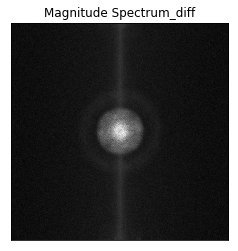

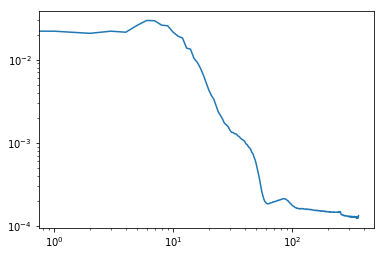

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013933 0.00011209 0.00012625 ... 0.00012473 0.00012625 0.00011209]
 [0.00012867 0.00013432 0.00012774 ... 0.00012256 0.00014113 0.00011012]
 [0.00011887 0.00012367 0.00011025 ... 0.00012528 0.00013769 0.00011775]
 ...
 [0.00015051 0.00014518 0.00011618 ... 0.00012044 0.00013334 0.00014193]
 [0.00011887 0.00011775 0.00013769 ... 0.00011781 0.00011025 0.00012367]
 [0.00012867 0.00011012 0.00014113 ... 0.00013101 0.00012774 0.00013432]]
el max de R es 362


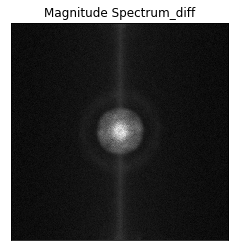

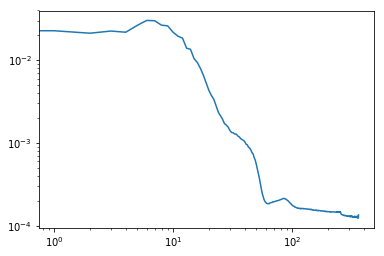

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014129 0.00011742 0.00011648 ... 0.00012723 0.00011648 0.00011742]
 [0.00011878 0.00012651 0.00014143 ... 0.00011763 0.00014244 0.00012068]
 [0.00010777 0.00012082 0.00010909 ... 0.00012459 0.00012175 0.000119  ]
 ...
 [0.00013317 0.0001346  0.00011261 ... 0.00012342 0.00012362 0.00013869]
 [0.00010777 0.000119   0.00012175 ... 0.00010728 0.00010909 0.00012082]
 [0.00011878 0.00012068 0.00014244 ... 0.00013009 0.00014143 0.00012651]]
el max de R es 362


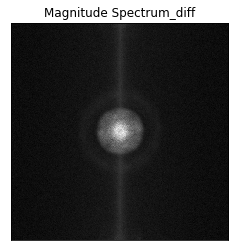

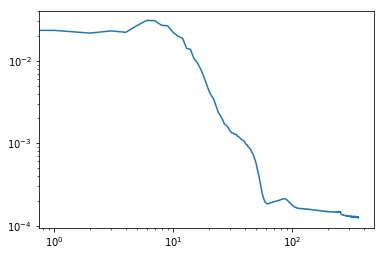

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014257 0.00012202 0.00012658 ... 0.00012488 0.00012658 0.00012202]
 [0.00011934 0.00013432 0.00012704 ... 0.00012547 0.00014054 0.00011868]
 [0.00011309 0.00012158 0.0001086  ... 0.00012711 0.00013153 0.00012645]
 ...
 [0.00014375 0.00014558 0.0001204  ... 0.00012348 0.00012886 0.00013756]
 [0.00011309 0.00012645 0.00013153 ... 0.00012369 0.0001086  0.00012158]
 [0.00011934 0.00011868 0.00014054 ... 0.00013269 0.00012704 0.00013432]]
el max de R es 362


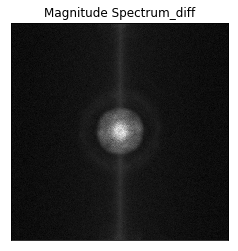

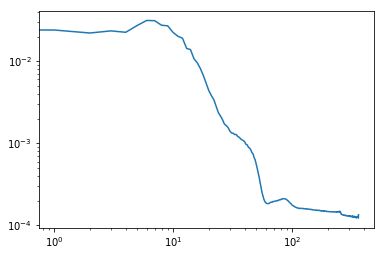

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00010777 0.0001234  0.0001143  ... 0.00012019 0.0001143  0.0001234 ]
 [0.00012215 0.00013339 0.00012356 ... 0.00010719 0.00013473 0.0001049 ]
 [0.00011071 0.00012511 0.00011618 ... 0.0001193  0.00013538 0.0001307 ]
 ...
 [0.00012898 0.00013526 0.00010618 ... 0.00012706 0.00012886 0.00015386]
 [0.00011071 0.0001307  0.00013538 ... 0.0001238  0.00011618 0.00012511]
 [0.00012215 0.0001049  0.00013473 ... 0.00013878 0.00012356 0.00013339]]
el max de R es 362


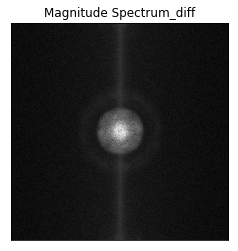

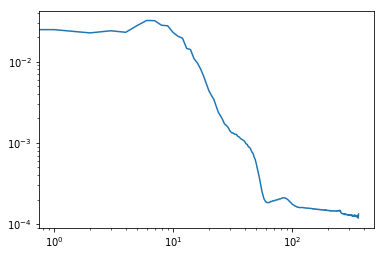

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013369 0.00013127 0.00011163 ... 0.00013912 0.00011163 0.00013127]
 [0.00010996 0.00012943 0.00013468 ... 0.00011693 0.00013775 0.00011546]
 [0.00011307 0.00011248 0.00010691 ... 0.00012829 0.00012701 0.00012414]
 ...
 [0.00013879 0.00013155 0.00010677 ... 0.00012231 0.0001221  0.00013454]
 [0.00011307 0.00012414 0.00012701 ... 0.00011361 0.00010691 0.00011248]
 [0.00010996 0.00011546 0.00013775 ... 0.00013832 0.00013468 0.00012943]]
el max de R es 362


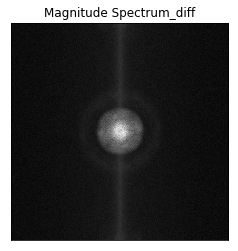

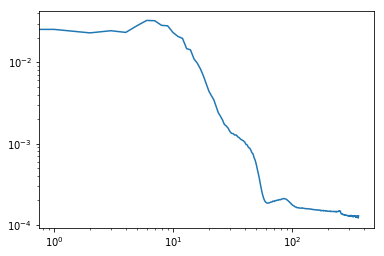

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013542 0.00011446 0.00012193 ... 0.00011396 0.00012193 0.00011446]
 [0.00011924 0.00013569 0.00012867 ... 0.00012717 0.00013511 0.00012527]
 [0.00012288 0.00012373 0.00010368 ... 0.00012812 0.0001324  0.00012456]
 ...
 [0.00014016 0.00013073 0.00011144 ... 0.00012486 0.00014829 0.00013791]
 [0.00012288 0.00012456 0.0001324  ... 0.00011049 0.00010368 0.00012373]
 [0.00011924 0.00012527 0.00013511 ... 0.00013643 0.00012867 0.00013569]]
el max de R es 362


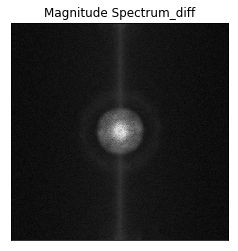

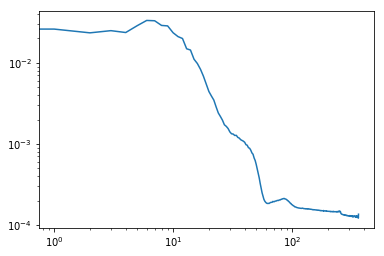

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012183 0.00013014 0.00012169 ... 0.00012091 0.00012169 0.00013014]
 [0.00012051 0.00013169 0.00015016 ... 0.00012191 0.00013314 0.00011867]
 [0.00012297 0.00012509 0.00010528 ... 0.00011075 0.0001302  0.0001172 ]
 ...
 [0.00013573 0.00013849 0.00011042 ... 0.00012509 0.00013132 0.00014453]
 [0.00012297 0.0001172  0.0001302  ... 0.00011143 0.00010528 0.00012509]
 [0.00012051 0.00011867 0.00013314 ... 0.00013491 0.00015016 0.00013169]]
el max de R es 362


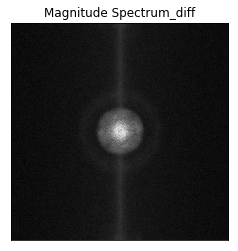

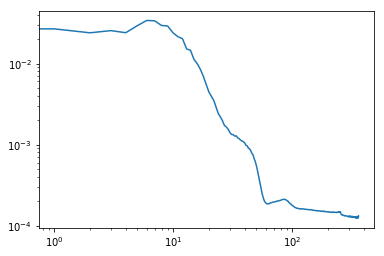

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013114 0.0001199  0.00012278 ... 0.00013284 0.00012278 0.0001199 ]
 [0.00011639 0.00013349 0.00011973 ... 0.00012725 0.00014165 0.00013063]
 [0.00012001 0.00012403 0.00010941 ... 0.00012964 0.00012173 0.00011705]
 ...
 [0.00014692 0.0001388  0.00012208 ... 0.00013113 0.00014019 0.00014696]
 [0.00012001 0.00011705 0.00012173 ... 0.00010868 0.00010941 0.00012403]
 [0.00011639 0.00013063 0.00014165 ... 0.00014174 0.00011973 0.00013349]]
el max de R es 362


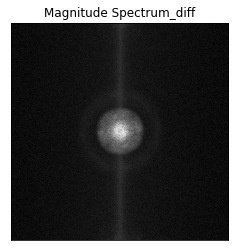

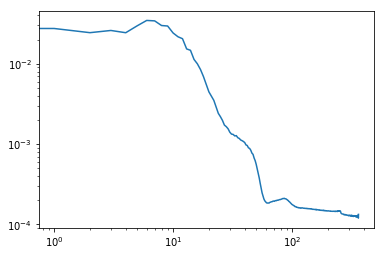

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011352 0.00011258 0.0001258  ... 0.00012603 0.0001258  0.00011258]
 [0.00011625 0.00013153 0.00012722 ... 0.00012714 0.00013477 0.00012612]
 [0.00010562 0.00012573 0.00011722 ... 0.00012161 0.00012235 0.00013521]
 ...
 [0.00014391 0.0001337  0.00010729 ... 0.00012027 0.00014093 0.00014283]
 [0.00010562 0.00013521 0.00012235 ... 0.0001092  0.00011722 0.00012573]
 [0.00011625 0.00012612 0.00013477 ... 0.00013289 0.00012722 0.00013153]]
el max de R es 362


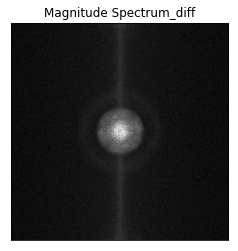

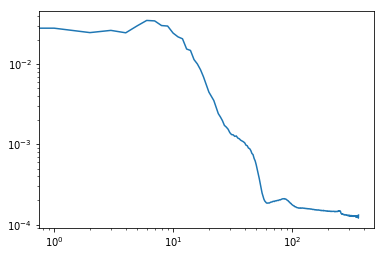

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012029 0.0001214  0.00012068 ... 0.00013444 0.00012068 0.0001214 ]
 [0.00012826 0.00013369 0.0001356  ... 0.00010876 0.00014259 0.00011663]
 [0.00012099 0.00012602 0.00010122 ... 0.00011279 0.00013562 0.00012213]
 ...
 [0.00013693 0.00013526 0.00011234 ... 0.00012493 0.00013445 0.00013214]
 [0.00012099 0.00012213 0.00013562 ... 0.00011986 0.00010122 0.00012602]
 [0.00012826 0.00011663 0.00014259 ... 0.00012575 0.0001356  0.00013369]]
el max de R es 362


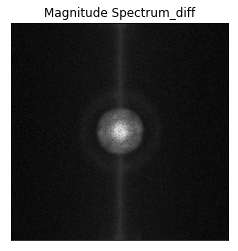

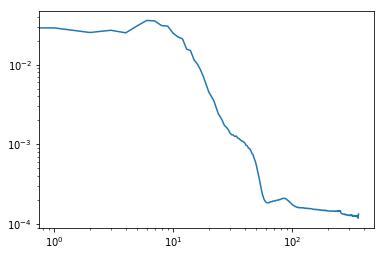

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[1.27247491e-04 1.24106155e-04 1.27940817e-04 ... 1.32303627e-04
  1.27940817e-04 1.24106155e-04]
 [1.22054800e-04 1.42794743e-04 1.30071494e-04 ... 1.16021874e-04
  1.40406599e-04 1.12756868e-04]
 [1.20447417e-04 1.16808034e-04 9.82001511e-05 ... 1.25122577e-04
  1.20191246e-04 1.27030376e-04]
 ...
 [1.51345172e-04 1.48411098e-04 1.13923743e-04 ... 1.13117094e-04
  1.41589539e-04 1.35247727e-04]
 [1.20447417e-04 1.27030376e-04 1.20191246e-04 ... 1.21979334e-04
  9.82001511e-05 1.16808034e-04]
 [1.22054800e-04 1.12756868e-04 1.40406599e-04 ... 1.33073816e-04
  1.30071494e-04 1.42794743e-04]]
el max de R es 362


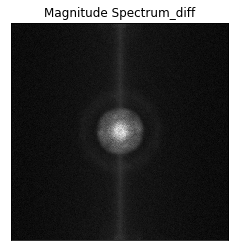

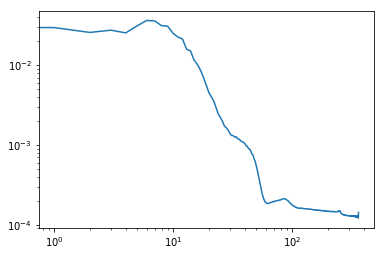

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012487 0.0001167  0.00011922 ... 0.0001371  0.00011922 0.0001167 ]
 [0.00012605 0.00014038 0.00012837 ... 0.00012714 0.00013119 0.00012765]
 [0.00011155 0.00011409 0.00010275 ... 0.00011895 0.0001273  0.00013886]
 ...
 [0.00013933 0.00014193 0.00011367 ... 0.00011933 0.00012552 0.00013925]
 [0.00011155 0.00013886 0.0001273  ... 0.00012062 0.00010275 0.00011409]
 [0.00012605 0.00012765 0.00013119 ... 0.00012234 0.00012837 0.00014038]]
el max de R es 362


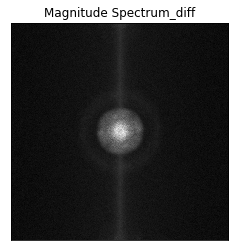

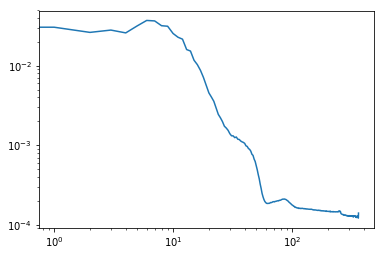

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012762 0.00011547 0.00010968 ... 0.00012275 0.00010968 0.00011547]
 [0.00011623 0.00013133 0.00012723 ... 0.00012189 0.00013754 0.00013054]
 [0.00013004 0.00012011 0.00010571 ... 0.00012375 0.00013679 0.00012732]
 ...
 [0.00012428 0.00014461 0.00011767 ... 0.00012438 0.00012581 0.00012972]
 [0.00013004 0.00012732 0.00013679 ... 0.00010462 0.00010571 0.00012011]
 [0.00011623 0.00013054 0.00013754 ... 0.00012479 0.00012723 0.00013133]]
el max de R es 362


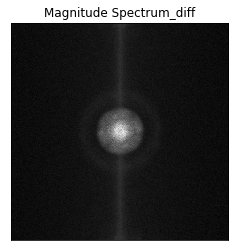

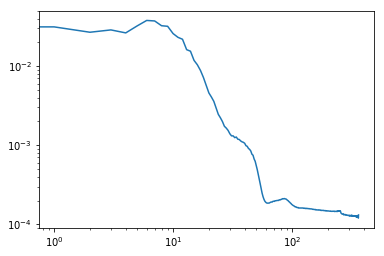

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013237 0.0001207  0.00012431 ... 0.00012953 0.00012431 0.0001207 ]
 [0.00012475 0.00013041 0.00013684 ... 0.00011961 0.00014375 0.00012207]
 [0.00012165 0.00013141 0.00010932 ... 0.00011298 0.00011476 0.00012667]
 ...
 [0.00013859 0.00013041 0.00011813 ... 0.00012119 0.00013112 0.00012792]
 [0.00012165 0.00012667 0.00011476 ... 0.00011442 0.00010932 0.00013141]
 [0.00012475 0.00012207 0.00014375 ... 0.00012233 0.00013684 0.00013041]]
el max de R es 362


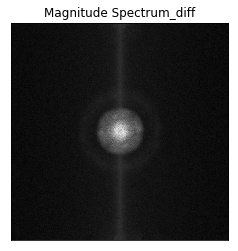

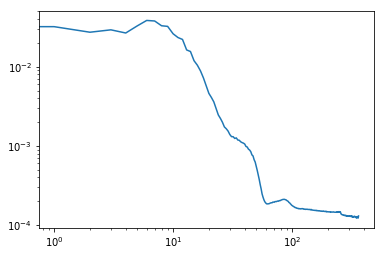

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013102 0.00012923 0.00011606 ... 0.00012377 0.00011606 0.00012923]
 [0.00011934 0.00013727 0.00013675 ... 0.00011627 0.00014196 0.00011918]
 [0.00011646 0.00011563 0.00010369 ... 0.00012169 0.00013306 0.00012585]
 ...
 [0.00012941 0.00013599 0.00011128 ... 0.00012729 0.00013307 0.00015103]
 [0.00011646 0.00012585 0.00013306 ... 0.00012757 0.00010369 0.00011563]
 [0.00011934 0.00011918 0.00014196 ... 0.00014177 0.00013675 0.00013727]]
el max de R es 362


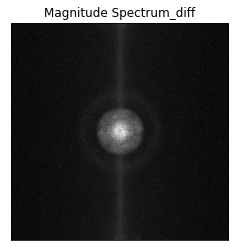

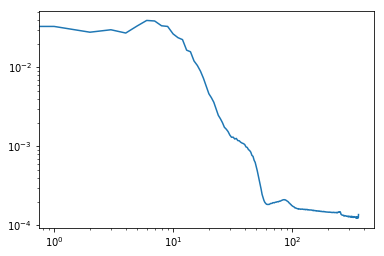

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014368 0.00012523 0.0001237  ... 0.00013066 0.0001237  0.00012523]
 [0.0001206  0.00014077 0.00013346 ... 0.00011592 0.00014494 0.0001238 ]
 [0.00012159 0.00012446 0.00010807 ... 0.00012402 0.00011924 0.00011907]
 ...
 [0.00013557 0.00012553 0.00011036 ... 0.00011891 0.0001412  0.00014028]
 [0.00012159 0.00011907 0.00011924 ... 0.0001038  0.00010807 0.00012446]
 [0.0001206  0.0001238  0.00014494 ... 0.00014053 0.00013346 0.00014077]]
el max de R es 362


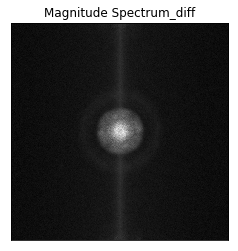

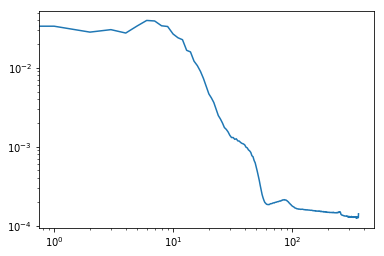

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001277  0.00012431 0.00011985 ... 0.0001343  0.00011985 0.00012431]
 [0.00012635 0.00012787 0.00012958 ... 0.00011659 0.00013702 0.00013262]
 [0.0001127  0.00013262 0.00010769 ... 0.00013551 0.00011779 0.00012049]
 ...
 [0.00013181 0.00013678 0.00011333 ... 0.00012703 0.00011764 0.00013444]
 [0.0001127  0.00012049 0.00011779 ... 0.00011683 0.00010769 0.00013262]
 [0.00012635 0.00013262 0.00013702 ... 0.00013336 0.00012958 0.00012787]]
el max de R es 362


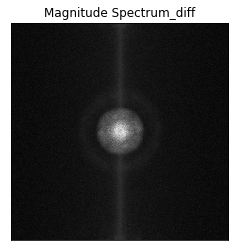

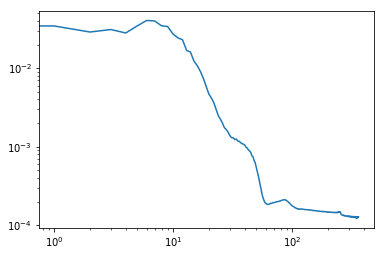

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013075 0.00011959 0.00012512 ... 0.00011992 0.00012512 0.00011959]
 [0.00011034 0.00013734 0.00013623 ... 0.00012831 0.00013433 0.00011506]
 [0.00011748 0.00013038 0.00010785 ... 0.00012051 0.00013969 0.00012805]
 ...
 [0.00012989 0.00012368 0.00011282 ... 0.00012268 0.00013189 0.00013443]
 [0.00011748 0.00012805 0.00013969 ... 0.00013116 0.00010785 0.00013038]
 [0.00011034 0.00011506 0.00013433 ... 0.00012385 0.00013623 0.00013734]]
el max de R es 362


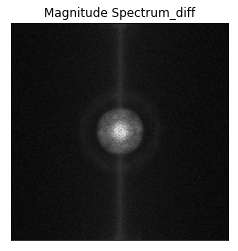

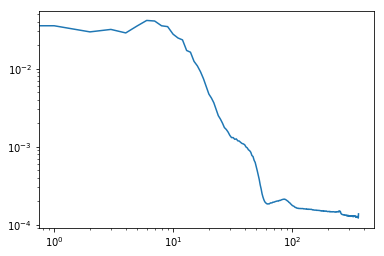

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012076 0.00012755 0.00012163 ... 0.00013199 0.00012163 0.00012755]
 [0.00011311 0.00013183 0.00012797 ... 0.00011237 0.00012455 0.00012752]
 [0.0001149  0.00013156 0.00010142 ... 0.0001162  0.00011837 0.00012984]
 ...
 [0.00012824 0.00013147 0.00011204 ... 0.00012792 0.00014297 0.00014341]
 [0.0001149  0.00012984 0.00011837 ... 0.00011326 0.00010142 0.00013156]
 [0.00011311 0.00012752 0.00012455 ... 0.00013652 0.00012797 0.00013183]]
el max de R es 362


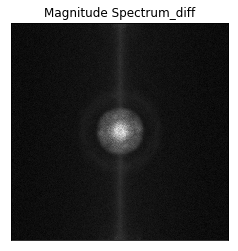

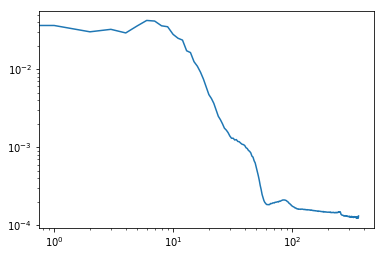

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012832 0.00011843 0.00012646 ... 0.00012133 0.00012646 0.00011843]
 [0.00012298 0.00013162 0.00014778 ... 0.00011003 0.00013024 0.00012991]
 [0.00011572 0.00013261 0.00010299 ... 0.00012074 0.00014367 0.00013494]
 ...
 [0.00014185 0.00013519 0.00011006 ... 0.00012485 0.00012626 0.00014534]
 [0.00011572 0.00013494 0.00014367 ... 0.00011869 0.00010299 0.00013261]
 [0.00012298 0.00012991 0.00013024 ... 0.00013488 0.00014778 0.00013162]]
el max de R es 362


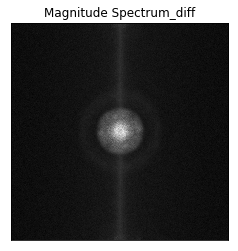

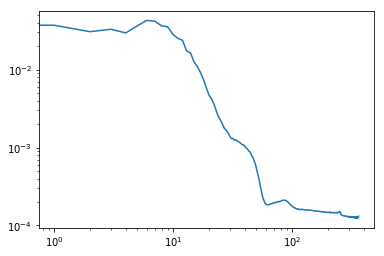

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011645 0.00013    0.00012494 ... 0.00012521 0.00012494 0.00013   ]
 [0.00012353 0.00012491 0.00012661 ... 0.00011582 0.00013537 0.00012602]
 [0.00011772 0.00012951 0.00010521 ... 0.00011788 0.00012094 0.00012515]
 ...
 [0.00013732 0.00013006 0.00010691 ... 0.0001285  0.00012458 0.00014335]
 [0.00011772 0.00012515 0.00012094 ... 0.00010991 0.00010521 0.00012951]
 [0.00012353 0.00012602 0.00013537 ... 0.00014054 0.00012661 0.00012491]]
el max de R es 362


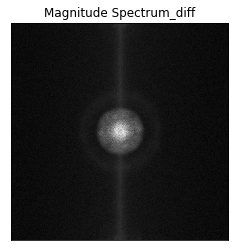

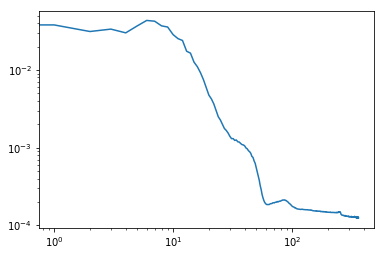

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[1.34983085e-04 1.20410288e-04 1.18416123e-04 ... 1.27965890e-04
  1.18416123e-04 1.20410288e-04]
 [1.21903569e-04 1.31952213e-04 1.38483883e-04 ... 1.16988798e-04
  1.32238070e-04 1.16613468e-04]
 [1.11208450e-04 1.18588840e-04 1.02097598e-04 ... 1.24363476e-04
  1.32095636e-04 1.25275357e-04]
 ...
 [1.37826530e-04 1.34558504e-04 9.81471821e-05 ... 1.25889463e-04
  1.38938834e-04 1.41045472e-04]
 [1.11208450e-04 1.25275357e-04 1.32095636e-04 ... 1.01678444e-04
  1.02097598e-04 1.18588840e-04]
 [1.21903569e-04 1.16613468e-04 1.32238070e-04 ... 1.28431609e-04
  1.38483883e-04 1.31952213e-04]]
el max de R es 362


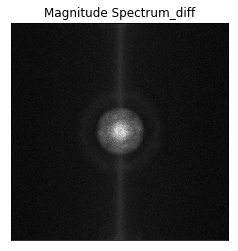

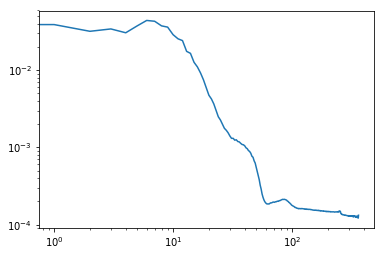

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011784 0.00012138 0.0001162  ... 0.00011563 0.0001162  0.00012138]
 [0.00012815 0.00014093 0.00013158 ... 0.00011934 0.00013955 0.00011319]
 [0.0001102  0.00011443 0.00010917 ... 0.00012872 0.00013355 0.00013377]
 ...
 [0.00013768 0.00013649 0.0001094  ... 0.00013154 0.00013517 0.0001492 ]
 [0.0001102  0.00013377 0.00013355 ... 0.0001108  0.00010917 0.00011443]
 [0.00012815 0.00011319 0.00013955 ... 0.00013575 0.00013158 0.00014093]]
el max de R es 362


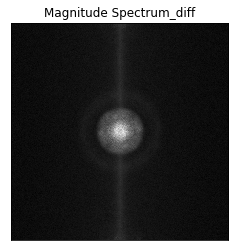

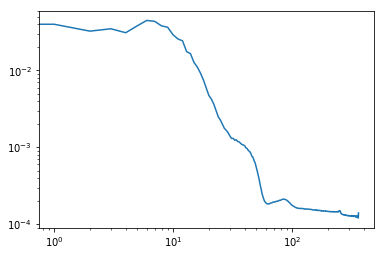

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011404 0.00012297 0.00011902 ... 0.00012676 0.00011902 0.00012297]
 [0.00013719 0.00013366 0.00014131 ... 0.00010765 0.00013738 0.00010952]
 [0.0001144  0.00012473 0.00010694 ... 0.00011788 0.00013375 0.00012606]
 ...
 [0.00013948 0.00014029 0.00011389 ... 0.00013284 0.00014208 0.00013221]
 [0.0001144  0.00012606 0.00013375 ... 0.00011151 0.00010694 0.00012473]
 [0.00013719 0.00010952 0.00013738 ... 0.00012225 0.00014131 0.00013366]]
el max de R es 362


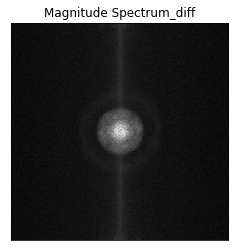

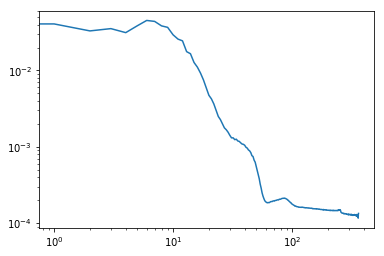

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014796 0.00011435 0.00012887 ... 0.0001224  0.00012887 0.00011435]
 [0.00011833 0.00012664 0.00014008 ... 0.0001202  0.00013076 0.00010811]
 [0.00011616 0.00013235 0.00010795 ... 0.00012181 0.00012931 0.00012175]
 ...
 [0.00014079 0.00013893 0.00010759 ... 0.0001182  0.0001364  0.00014613]
 [0.00011616 0.00012175 0.00012931 ... 0.00011914 0.00010795 0.00013235]
 [0.00011833 0.00010811 0.00013076 ... 0.00013413 0.00014008 0.00012664]]
el max de R es 362


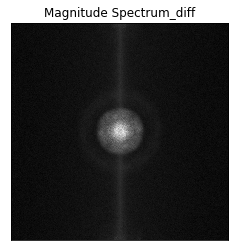

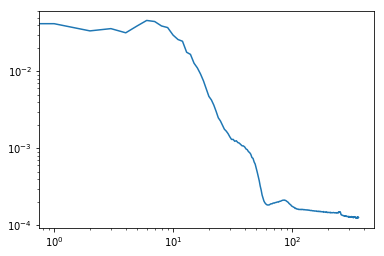

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[1.34944741e-04 1.20839766e-04 1.23908714e-04 ... 1.28733052e-04
  1.23908714e-04 1.20839766e-04]
 [1.24451341e-04 1.32289395e-04 1.29557491e-04 ... 1.20359800e-04
  1.39997384e-04 1.25838749e-04]
 [9.97603565e-05 1.30371904e-04 1.05249906e-04 ... 1.13287038e-04
  1.30888249e-04 1.27625433e-04]
 ...
 [1.40517237e-04 1.44974343e-04 1.14657400e-04 ... 1.14365910e-04
  1.22790545e-04 1.38809046e-04]
 [9.97603565e-05 1.27625433e-04 1.30888249e-04 ... 1.22619575e-04
  1.05249906e-04 1.30371904e-04]
 [1.24451341e-04 1.25838749e-04 1.39997384e-04 ... 1.40199467e-04
  1.29557491e-04 1.32289395e-04]]
el max de R es 362


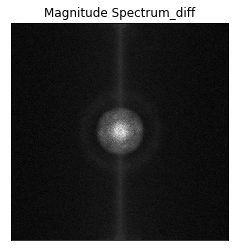

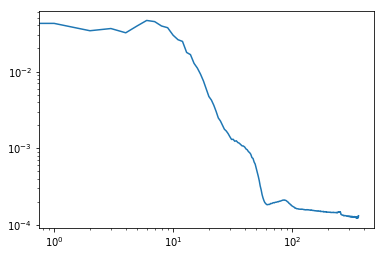

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013804 0.00012212 0.00013147 ... 0.00012261 0.00013147 0.00012212]
 [0.00011206 0.00013842 0.00013952 ... 0.00013215 0.00014359 0.00012156]
 [0.00010644 0.00013957 0.00010831 ... 0.00013669 0.00010943 0.0001232 ]
 ...
 [0.0001466  0.00013618 0.00011296 ... 0.0001146  0.00013143 0.00014621]
 [0.00010644 0.0001232  0.00010943 ... 0.00011994 0.00010831 0.00013957]
 [0.00011206 0.00012156 0.00014359 ... 0.00012905 0.00013952 0.00013842]]
el max de R es 362


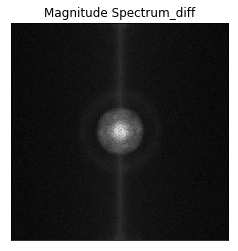

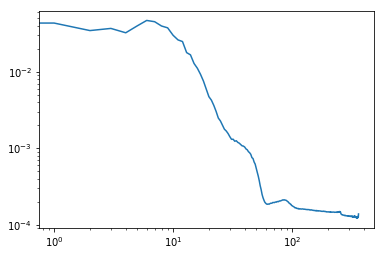

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014503 0.00012236 0.00011702 ... 0.00012549 0.00011702 0.00012236]
 [0.00012946 0.00013434 0.00014408 ... 0.00011952 0.00013236 0.00013248]
 [0.00011688 0.00012723 0.00011021 ... 0.00011766 0.00012855 0.00013183]
 ...
 [0.00014495 0.00013958 0.00011293 ... 0.00011833 0.00012859 0.00014836]
 [0.00011688 0.00013183 0.00012855 ... 0.00010344 0.00011021 0.00012723]
 [0.00012946 0.00013248 0.00013236 ... 0.00013883 0.00014408 0.00013434]]
el max de R es 362


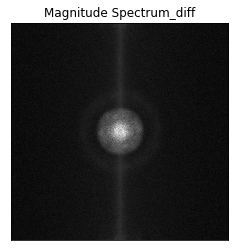

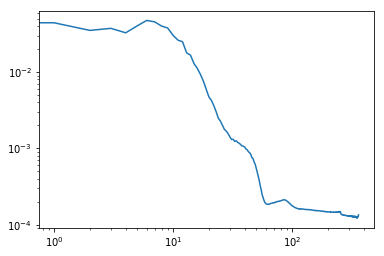

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013092 0.00012772 0.0001309  ... 0.00013142 0.0001309  0.00012772]
 [0.00013243 0.00013805 0.00013657 ... 0.00012742 0.00012947 0.0001115 ]
 [0.00011943 0.0001368  0.00012504 ... 0.00012752 0.00012776 0.00011127]
 ...
 [0.00013176 0.00013387 0.00011457 ... 0.0001407  0.00011931 0.00013486]
 [0.00011943 0.00011127 0.00012776 ... 0.00011465 0.00012504 0.0001368 ]
 [0.00013243 0.0001115  0.00012947 ... 0.00013514 0.00013657 0.00013805]]
el max de R es 362


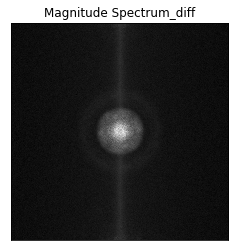

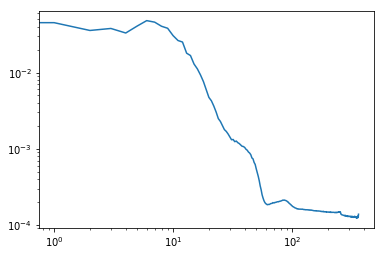

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014098 0.00012413 0.00012751 ... 0.0001172  0.00012751 0.00012413]
 [0.00011984 0.00014904 0.00012992 ... 0.00010825 0.00014658 0.00011639]
 [0.00011756 0.00012641 0.00011367 ... 0.00013243 0.00012616 0.0001184 ]
 ...
 [0.00014898 0.00014781 0.00012283 ... 0.00012671 0.00014959 0.00013878]
 [0.00011756 0.0001184  0.00012616 ... 0.00011923 0.00011367 0.00012641]
 [0.00011984 0.00011639 0.00014658 ... 0.00013823 0.00012992 0.00014904]]
el max de R es 362


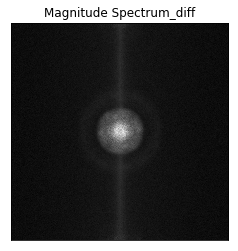

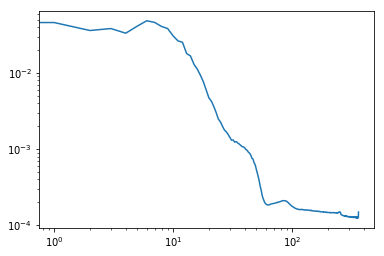

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001193  0.00011934 0.00013043 ... 0.00013189 0.00013043 0.00011934]
 [0.00012406 0.00013296 0.00012864 ... 0.00010967 0.00013299 0.00011787]
 [0.00011365 0.00012737 0.0001014  ... 0.00012528 0.00013131 0.00012113]
 ...
 [0.0001447  0.00013975 0.00012616 ... 0.00012014 0.00011644 0.00013699]
 [0.00011365 0.00012113 0.00013131 ... 0.0001137  0.0001014  0.00012737]
 [0.00012406 0.00011787 0.00013299 ... 0.00014569 0.00012864 0.00013296]]
el max de R es 362


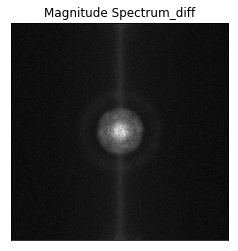

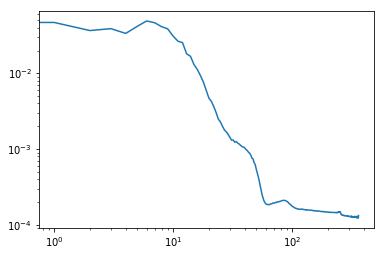

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013378 0.00012323 0.000127   ... 0.00012802 0.000127   0.00012323]
 [0.00011664 0.00013213 0.0001247  ... 0.00012159 0.00013408 0.00012   ]
 [0.00011524 0.00012484 0.0001057  ... 0.00012195 0.00012794 0.00012467]
 ...
 [0.0001351  0.00013622 0.000113   ... 0.00011223 0.00014644 0.00013678]
 [0.00011524 0.00012467 0.00012794 ... 0.00011938 0.0001057  0.00012484]
 [0.00011664 0.00012    0.00013408 ... 0.00014431 0.0001247  0.00013213]]
el max de R es 362


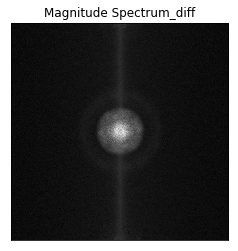

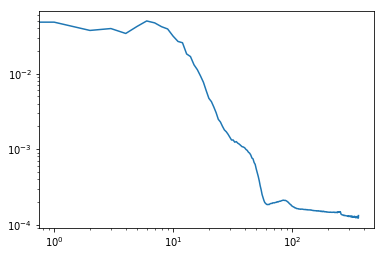

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012741 0.00012054 0.00011783 ... 0.00011808 0.00011783 0.00012054]
 [0.00011833 0.00013937 0.00013568 ... 0.00012288 0.00013555 0.00012658]
 [0.00011794 0.00011982 0.00011271 ... 0.00013043 0.00012111 0.0001371 ]
 ...
 [0.00014896 0.00014527 0.00010011 ... 0.00011948 0.00012607 0.00013485]
 [0.00011794 0.0001371  0.00012111 ... 0.0001247  0.00011271 0.00011982]
 [0.00011833 0.00012658 0.00013555 ... 0.00013245 0.00013568 0.00013937]]
el max de R es 362


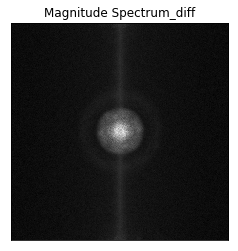

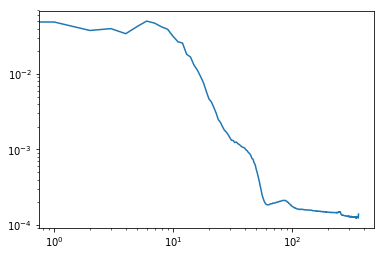

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012806 0.00011929 0.00012065 ... 0.00012938 0.00012065 0.00011929]
 [0.00012578 0.0001359  0.00012979 ... 0.00011965 0.00012247 0.0001311 ]
 [0.00010863 0.00012501 0.00011508 ... 0.00012687 0.00012763 0.00012425]
 ...
 [0.00013544 0.00012698 0.00012161 ... 0.00013002 0.00013256 0.00015711]
 [0.00010863 0.00012425 0.00012763 ... 0.00011739 0.00011508 0.00012501]
 [0.00012578 0.0001311  0.00012247 ... 0.00014605 0.00012979 0.0001359 ]]
el max de R es 362


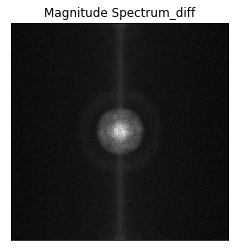

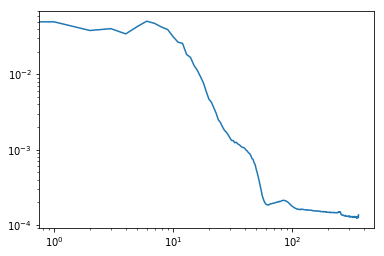

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013271 0.00011903 0.00012457 ... 0.00011712 0.00012457 0.00011903]
 [0.00011846 0.0001369  0.00012612 ... 0.0001262  0.00013268 0.00013266]
 [0.00011385 0.00012116 0.00010349 ... 0.0001296  0.00011646 0.00012404]
 ...
 [0.00013509 0.00014776 0.00012642 ... 0.00012108 0.00013075 0.00014566]
 [0.00011385 0.00012404 0.00011646 ... 0.00011009 0.00010349 0.00012116]
 [0.00011846 0.00013266 0.00013268 ... 0.00013308 0.00012612 0.0001369 ]]
el max de R es 362


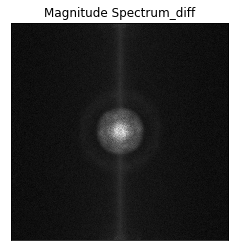

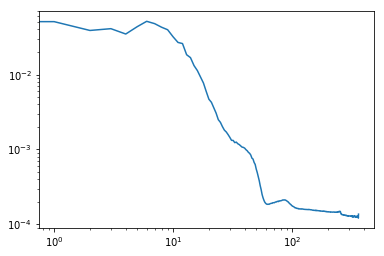

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013035 0.00011427 0.00012318 ... 0.0001165  0.00012318 0.00011427]
 [0.0001201  0.00013585 0.00013733 ... 0.00010537 0.00012937 0.00012034]
 [0.00011449 0.00011596 0.00010152 ... 0.0001255  0.00012623 0.00012274]
 ...
 [0.00012759 0.00013127 0.00011681 ... 0.00012947 0.00012741 0.00013939]
 [0.00011449 0.00012274 0.00012623 ... 0.00012034 0.00010152 0.00011596]
 [0.0001201  0.00012034 0.00012937 ... 0.00013164 0.00013733 0.00013585]]
el max de R es 362


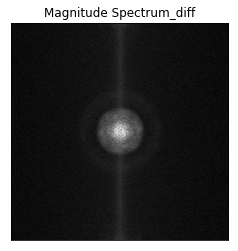

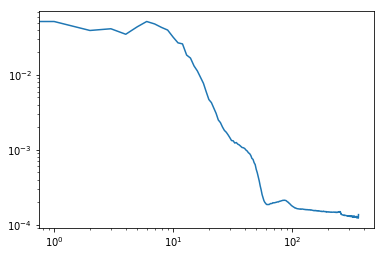

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[1.35297276e-04 1.22534941e-04 1.15519368e-04 ... 1.15869159e-04
  1.15519368e-04 1.22534941e-04]
 [1.20057972e-04 1.39810538e-04 1.24494560e-04 ... 1.23622987e-04
  1.38914256e-04 1.21906800e-04]
 [1.13434668e-04 1.26151615e-04 9.96620583e-05 ... 1.21834775e-04
  1.36621267e-04 1.16206123e-04]
 ...
 [1.25325736e-04 1.43085577e-04 1.04514402e-04 ... 1.25464081e-04
  1.27205160e-04 1.44305595e-04]
 [1.13434668e-04 1.16206123e-04 1.36621267e-04 ... 1.05506195e-04
  9.96620583e-05 1.26151615e-04]
 [1.20057972e-04 1.21906800e-04 1.38914256e-04 ... 1.33162772e-04
  1.24494560e-04 1.39810538e-04]]
el max de R es 362


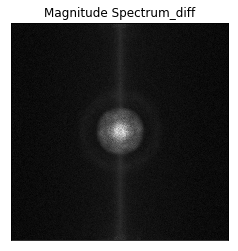

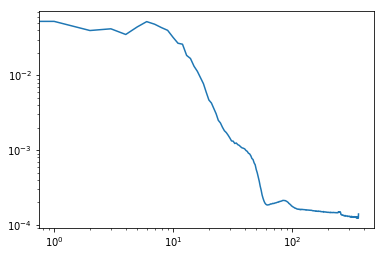

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012264 0.00011882 0.00012623 ... 0.0001249  0.00012623 0.00011882]
 [0.00012895 0.00013512 0.00013841 ... 0.00012507 0.00013607 0.00012287]
 [0.00011963 0.00011746 0.00010893 ... 0.00012758 0.0001232  0.00013316]
 ...
 [0.00012056 0.00014937 0.00011858 ... 0.000122   0.00013426 0.00013818]
 [0.00011963 0.00013316 0.0001232  ... 0.00010641 0.00010893 0.00011746]
 [0.00012895 0.00012287 0.00013607 ... 0.00014444 0.00013841 0.00013512]]
el max de R es 362


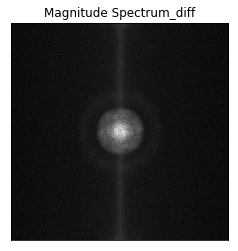

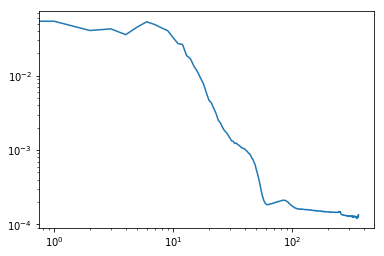

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00013994 0.00011827 0.00010999 ... 0.00010717 0.00010999 0.00011827]
 [0.00012697 0.00013211 0.00012384 ... 0.00013703 0.00013647 0.00013314]
 [0.00010523 0.00011926 0.00011975 ... 0.00012335 0.00012494 0.00012475]
 ...
 [0.00012803 0.00013874 0.00011436 ... 0.00012029 0.00012768 0.00013425]
 [0.00010523 0.00012475 0.00012494 ... 0.00011904 0.00011975 0.00011926]
 [0.00012697 0.00013314 0.00013647 ... 0.0001284  0.00012384 0.00013211]]
el max de R es 362


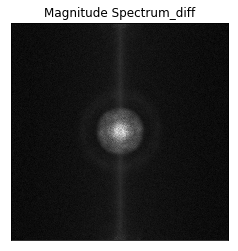

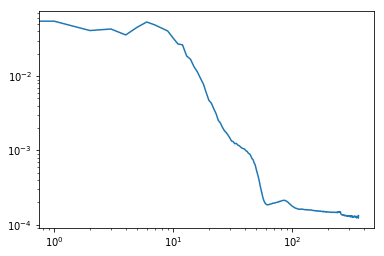

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00014926 0.00012527 0.0001288  ... 0.00012598 0.0001288  0.00012527]
 [0.00012654 0.00012954 0.00012266 ... 0.00011916 0.00014613 0.00012155]
 [0.00010937 0.00012316 0.00010919 ... 0.00012084 0.00013806 0.00012656]
 ...
 [0.00013252 0.00013636 0.00011264 ... 0.00013482 0.00012609 0.00012748]
 [0.00010937 0.00012656 0.00013806 ... 0.00012249 0.00010919 0.00012316]
 [0.00012654 0.00012155 0.00014613 ... 0.00014004 0.00012266 0.00012954]]
el max de R es 362


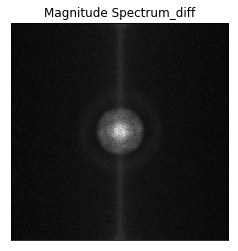

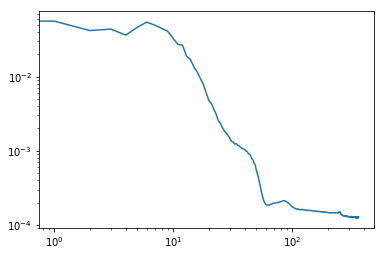

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001274  0.00013147 0.00011037 ... 0.00012243 0.00011037 0.00013147]
 [0.00011823 0.00012348 0.00013398 ... 0.00012105 0.00013451 0.00011788]
 [0.00011687 0.00012803 0.00010169 ... 0.00013115 0.00012438 0.00013056]
 ...
 [0.00013112 0.00013948 0.00011627 ... 0.00012432 0.00012637 0.00014338]
 [0.00011687 0.00013056 0.00012438 ... 0.00011384 0.00010169 0.00012803]
 [0.00011823 0.00011788 0.00013451 ... 0.00013351 0.00013398 0.00012348]]
el max de R es 362


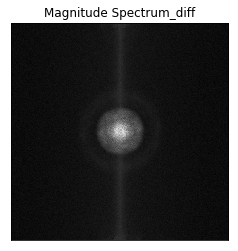

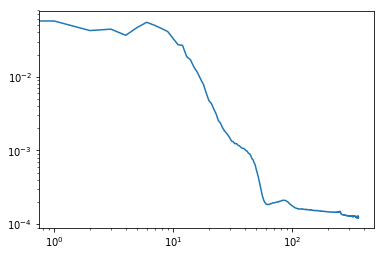

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001461  0.00012334 0.00011703 ... 0.00011834 0.00011703 0.00012334]
 [0.00012807 0.00013426 0.00012716 ... 0.00011491 0.00014807 0.00011815]
 [0.00012397 0.00011655 0.00010644 ... 0.00012247 0.0001399  0.0001325 ]
 ...
 [0.00012432 0.00013388 0.00010951 ... 0.00012752 0.00012541 0.0001348 ]
 [0.00012397 0.0001325  0.0001399  ... 0.0001129  0.00010644 0.00011655]
 [0.00012807 0.00011815 0.00014807 ... 0.00012091 0.00012716 0.00013426]]
el max de R es 362


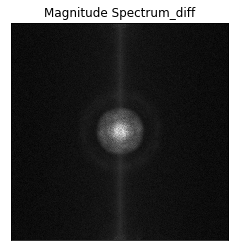

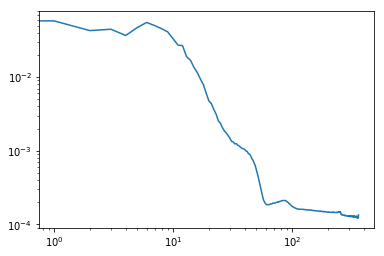

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012817 0.00012611 0.00012513 ... 0.00012455 0.00012513 0.00012611]
 [0.00012389 0.00014297 0.00013845 ... 0.0001252  0.00013653 0.00012958]
 [0.00011386 0.00012581 0.00010018 ... 0.00013695 0.00012798 0.00014182]
 ...
 [0.00012423 0.00014077 0.00011499 ... 0.00013063 0.00012956 0.00013222]
 [0.00011386 0.00014182 0.00012798 ... 0.00010499 0.00010018 0.00012581]
 [0.00012389 0.00012958 0.00013653 ... 0.00014198 0.00013845 0.00014297]]
el max de R es 362


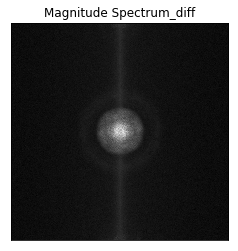

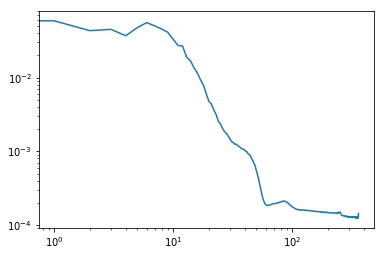

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001286  0.00012018 0.00011508 ... 0.00013258 0.00011508 0.00012018]
 [0.00012257 0.00013858 0.0001265  ... 0.00012754 0.00012455 0.00012491]
 [0.00011354 0.00012651 0.00010975 ... 0.00012938 0.00013417 0.00014035]
 ...
 [0.00013571 0.00013499 0.00011255 ... 0.00012384 0.00012355 0.00014669]
 [0.00011354 0.00014035 0.00013417 ... 0.00010364 0.00010975 0.00012651]
 [0.00012257 0.00012491 0.00012455 ... 0.00014456 0.0001265  0.00013858]]
el max de R es 362


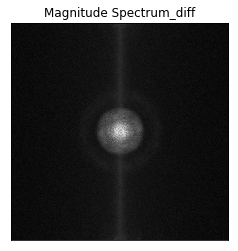

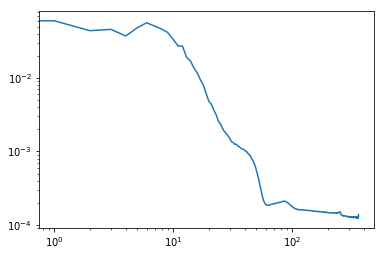

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011507 0.00012607 0.00012193 ... 0.00012436 0.00012193 0.00012607]
 [0.00012974 0.00013469 0.00011854 ... 0.00012372 0.00013559 0.00012955]
 [0.0001206  0.0001206  0.00011096 ... 0.00013256 0.00013296 0.00012984]
 ...
 [0.00012739 0.00015365 0.00011278 ... 0.00011653 0.00013244 0.00015194]
 [0.0001206  0.00012984 0.00013296 ... 0.00011288 0.00011096 0.0001206 ]
 [0.00012974 0.00012955 0.00013559 ... 0.00014396 0.00011854 0.00013469]]
el max de R es 362


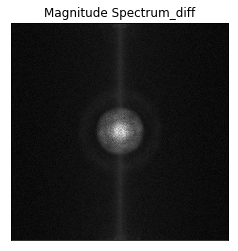

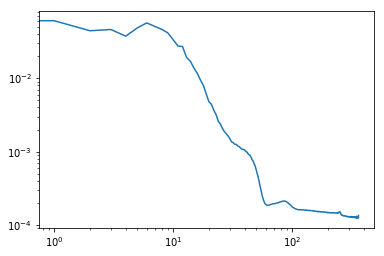

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00010616 0.0001375  0.00011761 ... 0.0001269  0.00011761 0.0001375 ]
 [0.00011961 0.00013372 0.00012905 ... 0.00013059 0.00014126 0.00013208]
 [0.00010909 0.00011526 0.0001031  ... 0.00013166 0.0001205  0.00013222]
 ...
 [0.00015052 0.00012745 0.00011052 ... 0.0001306  0.00013403 0.00014144]
 [0.00010909 0.00013222 0.0001205  ... 0.00011628 0.0001031  0.00011526]
 [0.00011961 0.00013208 0.00014126 ... 0.00013714 0.00012905 0.00013372]]
el max de R es 362


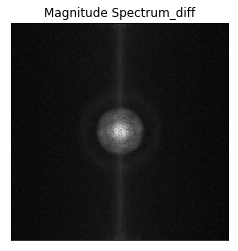

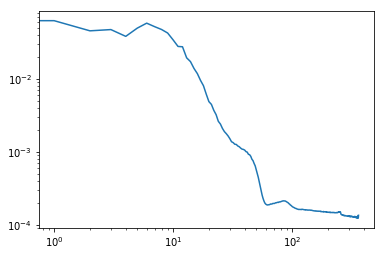

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012566 0.00012083 0.00011839 ... 0.00012464 0.00011839 0.00012083]
 [0.00012018 0.00013405 0.00012241 ... 0.00011846 0.00012339 0.00012423]
 [0.00010984 0.00011778 0.000111   ... 0.00012372 0.00012247 0.00012435]
 ...
 [0.00015149 0.00013192 0.00010796 ... 0.00011794 0.00013265 0.00013382]
 [0.00010984 0.00012435 0.00012247 ... 0.00011457 0.000111   0.00011778]
 [0.00012018 0.00012423 0.00012339 ... 0.00012968 0.00012241 0.00013405]]
el max de R es 362


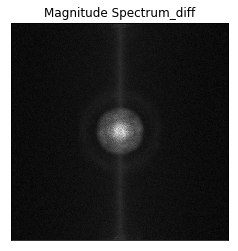

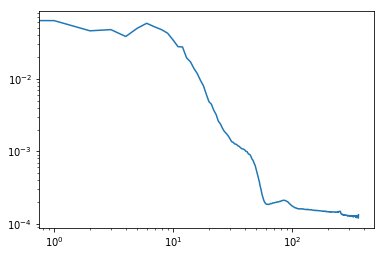

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011565 0.00012147 0.00011375 ... 0.00012296 0.00011375 0.00012147]
 [0.00012939 0.00014085 0.00012844 ... 0.00012189 0.00014206 0.00011795]
 [0.00013109 0.00011746 0.00011253 ... 0.00012938 0.0001319  0.00013803]
 ...
 [0.00011931 0.00013377 0.00011855 ... 0.00012469 0.00013915 0.00014172]
 [0.00013109 0.00013803 0.0001319  ... 0.00011331 0.00011253 0.00011746]
 [0.00012939 0.00011795 0.00014206 ... 0.00012855 0.00012844 0.00014085]]
el max de R es 362


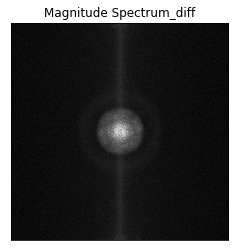

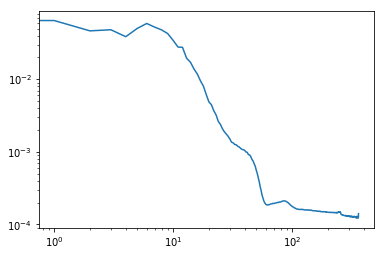

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00012726 0.00013528 0.00012302 ... 0.00011006 0.00012302 0.00013528]
 [0.00011404 0.00012797 0.00012812 ... 0.00011415 0.00014365 0.00013758]
 [0.00011934 0.00012058 0.00011655 ... 0.00013298 0.00013262 0.00012196]
 ...
 [0.00013954 0.00013503 0.00011983 ... 0.00013305 0.00012309 0.00013123]
 [0.00011934 0.00012196 0.00013262 ... 0.00010629 0.00011655 0.00012058]
 [0.00011404 0.00013758 0.00014365 ... 0.00013531 0.00012812 0.00012797]]
el max de R es 362


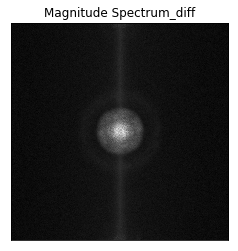

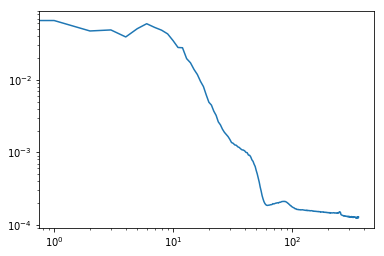

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00011471 0.00012425 0.0001081  ... 0.00013862 0.0001081  0.00012425]
 [0.00012825 0.00014529 0.00012762 ... 0.00012821 0.00013127 0.00012933]
 [0.00010776 0.00013186 0.00011469 ... 0.00012976 0.00012328 0.0001292 ]
 ...
 [0.00013334 0.0001286  0.00011381 ... 0.00011524 0.00013816 0.00013695]
 [0.00010776 0.0001292  0.00012328 ... 0.00011728 0.00011469 0.00013186]
 [0.00012825 0.00012933 0.00013127 ... 0.00013402 0.00012762 0.00014529]]
el max de R es 362


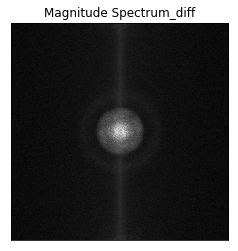

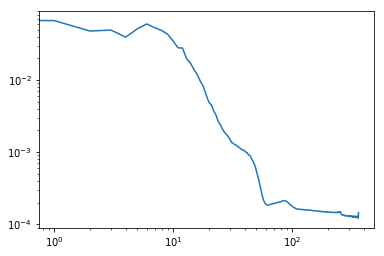

The array then is  [[0.00065783 0.00065376 0.00069731 ... 0.00012123 0.000123   0.00013421]
 [0.00094612 0.0009983  0.00108179 ... 0.00012364 0.00012573 0.00013811]
 [0.00133085 0.0013039  0.00143931 ... 0.00012448 0.00012591 0.00013047]
 ...
 [0.06467528 0.06449528 0.04647405 ... 0.0001224  0.00012419 0.00014085]
 [0.0658794  0.06571582 0.04716172 ... 0.00012848 0.00012451 0.00012797]
 [0.0670937  0.06684519 0.04784194 ... 0.00012186 0.000128   0.00014529]]


In [11]:
#Arreglo para evaluar DICF
DICF_array = np.zeros([num_intervals-1,363]) 
l=0
m=pixels

for n in range(0,num_intervals-1):
    magnitude_spectrum_diff_2 = np.fft.fftshift(Fourier_sp_diff[l:m,:])        
    center = [(pixels/2) - 1, (pixels/2) -1]
    print(magnitude_spectrum_diff_2.shape)
#q_x,q_y = np.meshgrid(shap2,shap2,sparse = True)
    Y, X = np.indices((magnitude_spectrum_diff_2.shape))    
    R = np.sqrt((X - center[0])**2 + (Y - center[1])**2)
    R = R.astype(np.int)
   
    print(np.min(R))
    Tbin = np.bincount(R.ravel(), magnitude_spectrum_diff_2.ravel())
    print("rravel es ", R.ravel())
    print("mag spe es", magnitude_spectrum_diff_2)
    NR = np.bincount(R.ravel())
    Radialprofile = Tbin / NR
    print("el max de R es",np.max(R))
    plt.plot(),plt.imshow(20*cv.log(magnitude_spectrum_diff_2), cmap = 'gray')
    plt.title('Magnitude Spectrum_diff'), plt.xticks([]), plt.yticks([])
    plt.show()
    l = l+pixels
    m = m+pixels
    T = np.linspace(0,362,num = 363)
    plt.loglog(T,Radialprofile , label ='linear')
    plt.show()
    DICF_array[n,:] = Radialprofile

print("The array then is ", DICF_array)

In [12]:
print(np.size(A_q_F))

85


1.8621921552481229
[6.34453232e+00 9.99980595e-01 1.13067640e-05 2.48096567e-03]


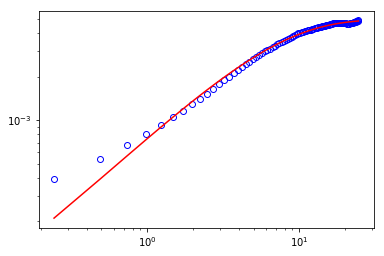

1.9553017630105292
[7.00000000e+00 9.99856094e-01 6.66866831e-05 2.20328651e-03]


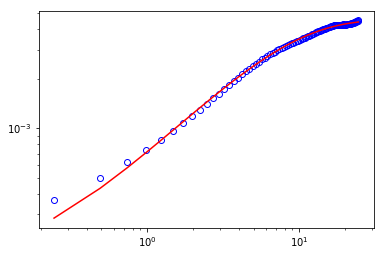

2.048411370772935
[6.06532048e+00 9.99999499e-01 3.43483342e-05 1.86863145e-03]


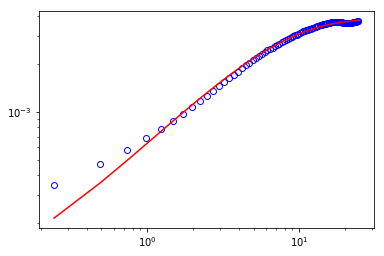

2.141520978535341
[5.75034726e+00 9.89191140e-01 7.82367213e-05 1.51368665e-03]


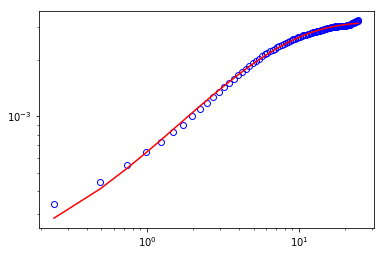

2.2346305862977474
[4.89595263e+00 9.99999782e-01 7.55404713e-05 1.20896064e-03]


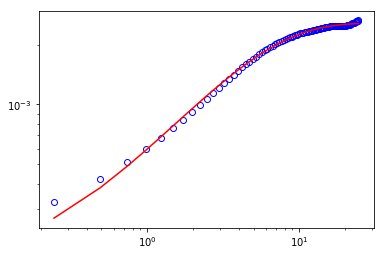

2.3277401940601536
[5.15718993e+00 9.42406903e-01 7.99339806e-05 1.10631515e-03]


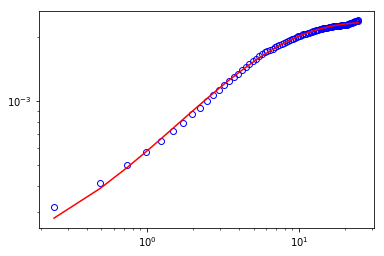

2.42084980182256
[4.23588308e+00 9.99999992e-01 7.46675569e-05 9.50961557e-04]


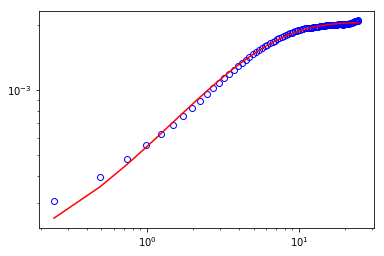

2.5139594095849658
[4.22243807e+00 9.48604125e-01 8.26775310e-05 8.32847268e-04]


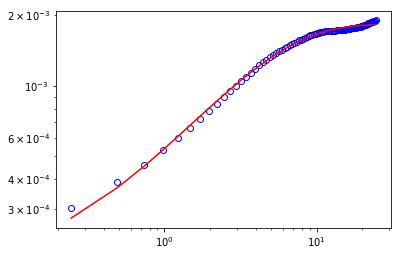

2.607069017347372
[4.20276246e+00 9.99942774e-01 1.02600232e-04 7.57915739e-04]


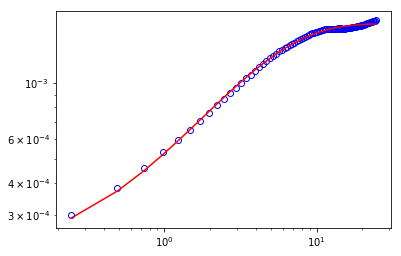

2.7001786251097784
[3.65969061e+00 9.99998982e-01 8.50052578e-05 7.11977440e-04]


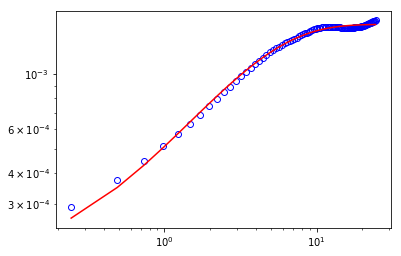

2.793288232872184
[3.52943115e+00 9.99981397e-01 9.70084127e-05 6.28361191e-04]


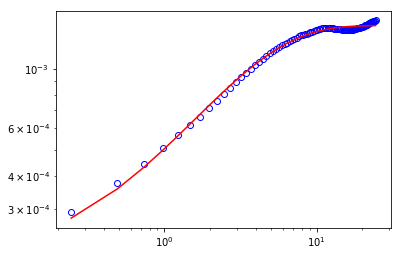

2.88639784063459
[3.04462108e+00 9.99991769e-01 8.92845015e-05 5.79193256e-04]


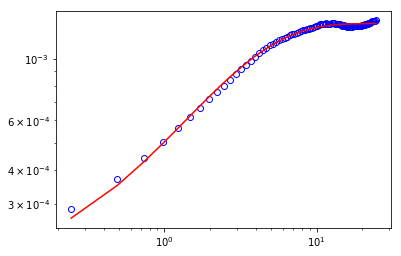

2.9795074483969963
[3.09033858e+00 9.99999920e-01 9.55963379e-05 5.68240994e-04]


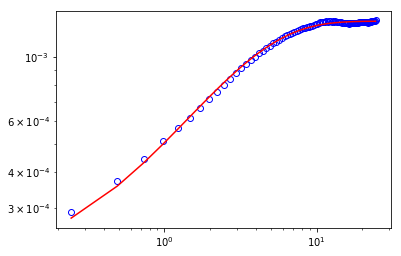

3.0726170561594026
[2.70509066e+00 9.99999941e-01 8.32223023e-05 5.46366479e-04]


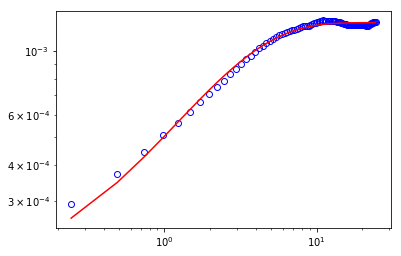

3.165726663921809
[2.82365524e+00 9.99986709e-01 9.59807940e-05 5.36952079e-04]


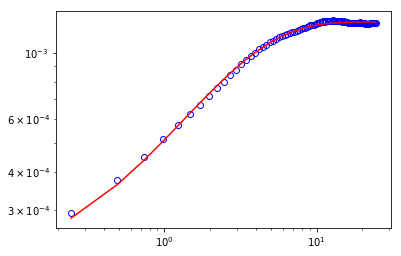

3.2588362716842147
[2.38736662e+00 9.99999898e-01 8.44998077e-05 5.16342196e-04]


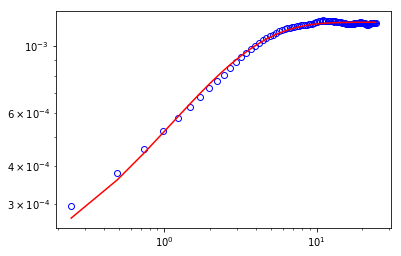

3.351945879446621
[2.48806510e+00 9.99999589e-01 9.36604573e-05 4.94870969e-04]


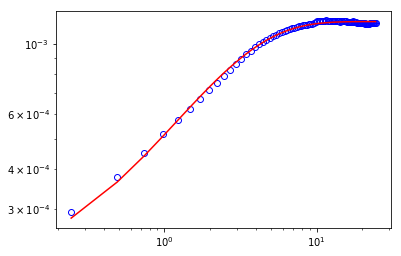

3.4450554872090273
[2.31416441e+00 9.99999751e-01 9.49923047e-05 4.67140024e-04]


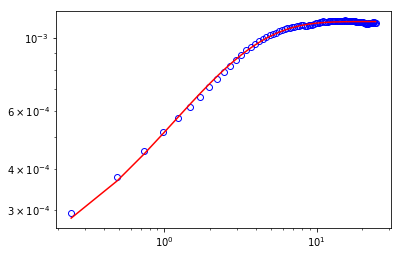

3.538165094971433
[2.32629681e+00 9.99990614e-01 9.74965590e-05 4.47849590e-04]


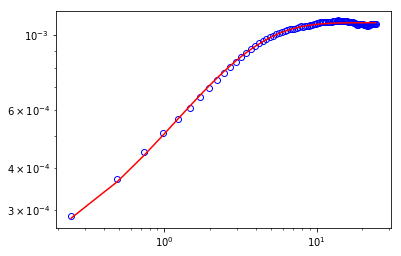

3.6312747027338395
[2.28785327e+00 9.99956593e-01 9.91721440e-05 4.37752810e-04]


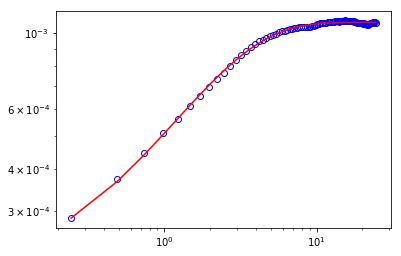

3.7243843104962457
[2.22032067e+00 9.77649654e-01 9.63643606e-05 4.25370191e-04]


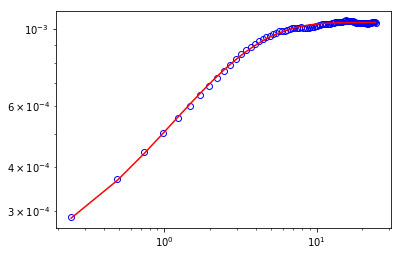

3.8174939182586516
[1.85558478e+00 8.20253627e-01 5.87026425e-05 4.33828377e-04]


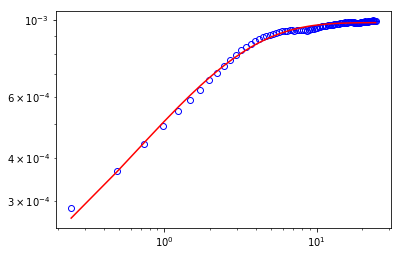

3.9106035260210583
[1.81702941e+00 7.85649131e-01 5.47109066e-05 4.28456649e-04]


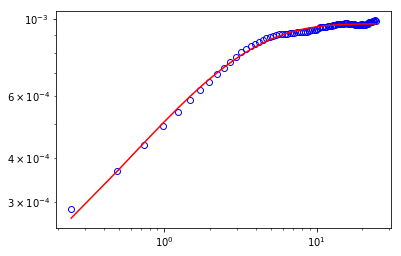

4.003713133783464
[1.72432633e+00 7.98037544e-01 5.81846223e-05 3.95780363e-04]


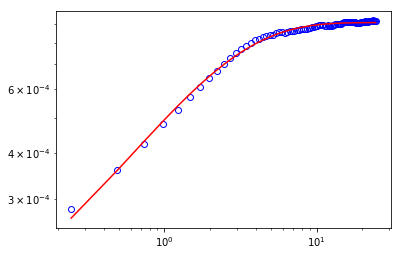

4.09682274154587
[1.55637365e+00 6.79032809e-01 2.43283680e-05 4.20908068e-04]


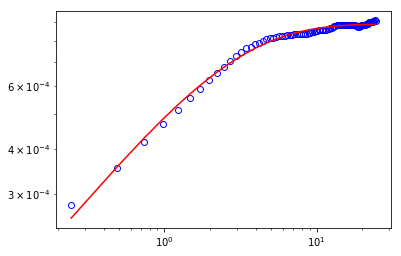

4.189932349308276
[1.59525692e+00 7.30097260e-01 4.64143142e-05 3.75104923e-04]


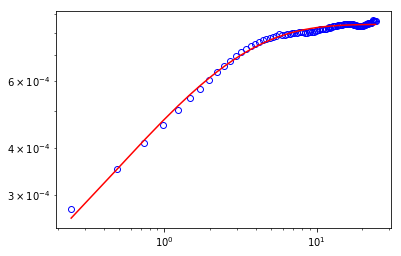

4.283041957070682
[1.61769532e+00 8.65236073e-01 7.84241125e-05 3.05856233e-04]


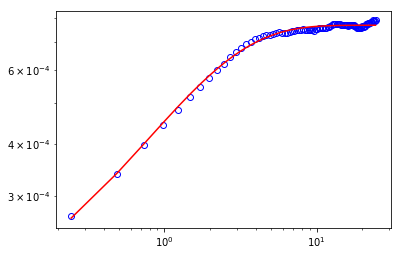

4.376151564833089
[1.55741336e+00 7.93140877e-01 6.45504468e-05 3.07283707e-04]


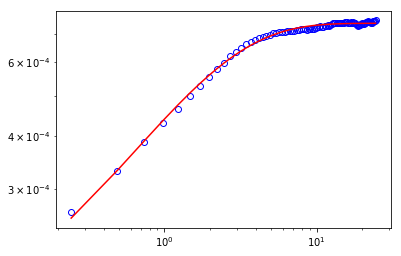

4.469261172595495
[1.71608823e+00 9.71521520e-01 9.38719814e-05 2.41334344e-04]


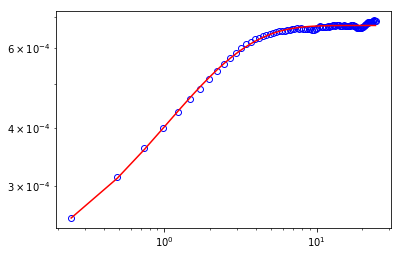

4.562370780357901
[1.47803680e+00 8.38363356e-01 7.52579352e-05 2.38296666e-04]


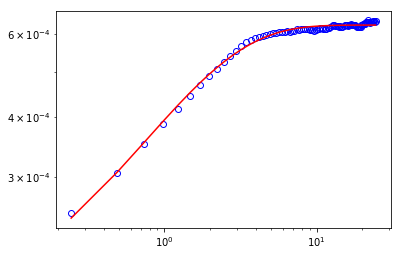

In [13]:
#beta = 1
import math 
i=0
num = 30
ini = 20
Q = np.zeros([num])
#A_q_DICF = np.zeros([num])
B_q_DICF = np.zeros([num])
apo_2 = np.linspace(timestep, timestep*num_intervals, num_intervals-1)
apo22 = np.linspace(0.01, timestep*num_intervals, (num_intervals-1)*10)
f_q = np.zeros([num, np.size(DICF_array[:,1])])
f_q_fit = np.zeros([num, np.size(apo22)])
dif_coef = 0;
Time = np.zeros([num])
Betas = np.zeros([num])
for h in range(ini,ini + num,1):
    alli_2 = DICF_array[:,h]
    plt.loglog(apo_2, alli_2,'bo',ms = 6, fillstyle = 'none', label='linear')
    
    
    q = (2*np.pi)*h/(d_pix*512)
    
    
    
    def func( x, tau, beta, B, A_fit):
        return 2*A_fit*(1 - np.exp(-(x/tau)**beta)) + 2*B
        #return 2*A_q_F[i]*(1 - np.exp(-(x/tau)**beta)) +2*B
        #return 2*A_q_F[i]*(1-np.exp(-x*(q**2)*D)) + 2*B
        #return 2*A_q_F[i]*(1-np.exp(-(x*(q**2)*D)**beta)) + 2*B
    print(q)
    popt, pcov = curve_fit(func, apo_2[:], alli_2[:],bounds=([0.9, 0.6, 0.000000005, 0.000003], [7.0 , 1.0, 0.01 , 0.1]), method = 'trf')
    #popt, pcov = curve_fit(func, apo_2, alli_2,  method = 'lm')
    print(popt)
    #dif_coef = dif_coef+popt[1]
    plt.loglog(apo_2, func(apo_2, *popt), 'r-',
             label='fit: tau=%5.3f, beta=%5.3f, B=%5.3f, A_fit=%5.3f' % tuple(popt))
    
    
    f_q[i,:] = 1 - (DICF_array[:,h] - 2*popt[2])/(2*popt[3])
    f_q_fit[i,:] = np.exp(-((apo22/popt[0])**popt[1]))
    #l=1/(popt[0]*q**2)
    Q[i] = q 
    Betas[i] = popt[1]
    B_q_DICF[i] = popt[2]
    Time[i] = popt[0]*math.gamma(1/popt[1])/popt[1]
    i=i+1        
    plt.show()
    
#def func2(Z,Dif):
    #return 1/(Dif*Z**2)
#popt_D, pcov_D = curve_fit(func2, Q, Time) 

#print(popt_D)
#dif_coef = dif_coef/len(Q) 


#plt.show()
#plt.loglog(Q,Time, 'bo',fillstyle = 'none', ms = 7, label = 'Measurements') 
#plt.loglog(Q, func2(Q, *popt_D), 'r-', label = 'Fit')
#plt.xlabel(r'q ($1/\mu m$)')
#plt.ylabel(r'$\tau$ (s)')
#plt.legend(loc='upper right')
plt.show()
#plt.loglog(Q, A_q_F, 'bP', ms = 6, label = 'A(q)')
#plt.loglog(Q,B_q_DICF,'r.', ms = 6, label = 'B(q)')
#plt.xlabel(r'q ($1/\mu m$)')
#plt.ylabel(r'Arb units')
#plt.legend(loc = 'upper right')


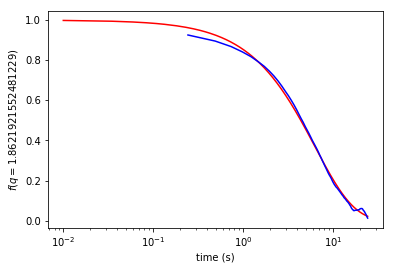

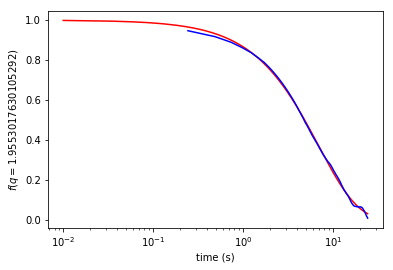

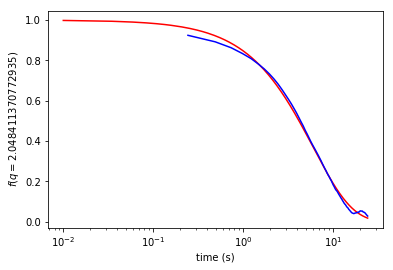

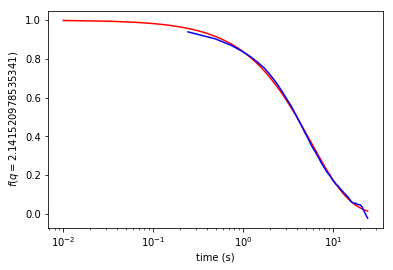

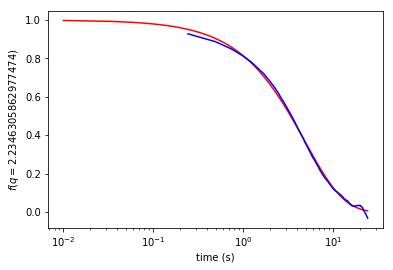

...

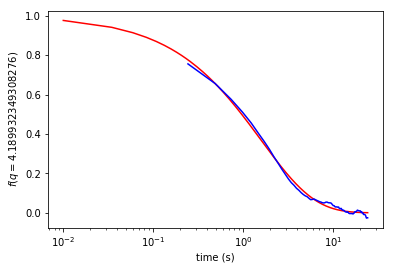

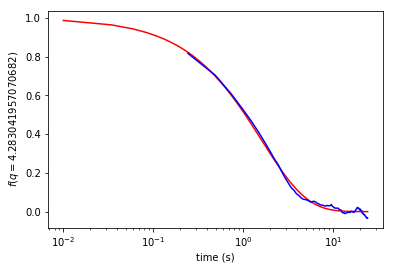

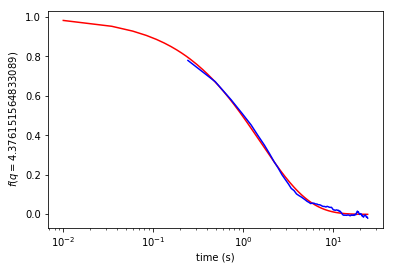

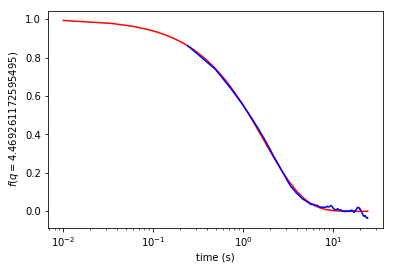

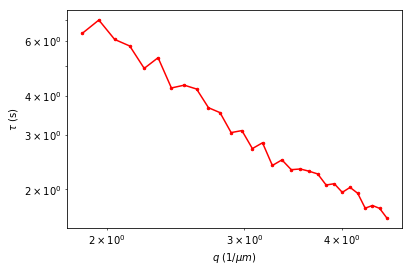

0.93796226393205


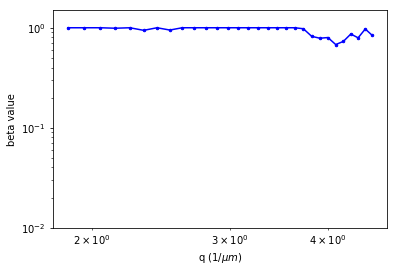

In [14]:
plt.show()
for qs in range ( 0, num -1 ):
    plt.show()
    plt.semilogx(apo22, f_q_fit[qs,:],'r-', ms = 5)
    plt.semilogx(apo_2, f_q[qs,:],'b-', ms = 5)
    plt.xlabel(r'time (s)')
    plt.ylabel(r'$f(q =$' + str((2*np.pi)*(qs + ini)/(d_pix*512))+')')
    #print(f_q_fit[qs,:])
    np.savetxt(Filename + 'f_q_2_2_' + str((2*np.pi)*(qs + ini)/(d_pix*512))+ '.txt', np.c_[apo_2,f_q[qs,:]])
    np.savetxt(Filename + 'f_q_fit_2_2_' + str((2*np.pi)*(qs + ini)/(d_pix*512))+ '.txt', np.c_[apo22,f_q_fit[qs,:]])

    





plt.show()
plt.loglog(Q, Time, 'r.-', ms = 5)
plt.xlabel(r'$q$ ($1/ \mu m$)')
plt.ylabel(r'$\tau$ (s)')
plt.show()
plt.loglog(Q, Betas,'b.-', ms = 5)
plt.ylim((0.01, 1.5)) 
plt.xlabel(r'q ($1/ \mu m$)')
plt.ylabel(r'beta value')
media_bet = np.mean(Betas[:])
print(media_bet)

In [11]:
np.savetxt(Filename + 'tau_vs_q2_2' + '.txt', np.c_[Q**2, Time])
np.savetxt(Filename + 'beta_vs_q_2' + '.txt', np.c_[Q, Betas])
np.savetxt(Filename + 'tau_vs_q_single_2' + '.txt', np.c_[Q, Time])
#np.savetxt(Filename + 'tau_vs_q2_3da' + '.txt', np.c_[Q**2, Time])
#np.savetxt(Filename + 'beta_vs_q_3da' + '.txt', np.c_[Q, Betas])

In [ ]:
#Arreglo para evaluar F(Q,t)
FQt_array = np.zeros([num_intervals-1,363]) 
l= 0
m=pixels 

for n in range(0,num_intervals-1):
    shift_corr= np.fft.fftshift(Fourier_sp_corr[l:m,:])
    center = [(pixels/2)-1,(pixels/2)-1]
    
    y, x = np.indices((shift_corr.shape))
    #print(x)
    #print(y)
    
    r = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    r = r.astype(np.int)
   
    #print(np.min(r))
    tbin = np.bincount(r.ravel(), shift_corr.ravel())
    #print("rravel es ", r.ravel())
    #print("mag spe es", shift_corr)
    nr = np.bincount(r.ravel())
    radialprofile = tbin / nr
    #print("radial profile is", radialprofile)
    #print("nr es", nr)
    #print(magnitude_spectrum_diff[511,511])
    #print((magnitude_spectrum_diff[255,256]+magnitude_spectrum_diff[255,254]+magnitude_spectrum_diff[256,255]+magnitude_spectrum_diff[254,255]+magnitude_spectrum_diff[256,256]+magnitude_spectrum_diff[254,256]+magnitude_spectrum_diff[254,254]+magnitude_spectrum_diff[256,254])/8)
    #print("The max is r ",np.max(r))
    plt.plot(),plt.imshow(20*cv.log(shift_corr), cmap = 'jet')
    plt.title('Magnitude Spectrum_corr'), plt.xticks([]), plt.yticks([])
    plt.show()
    l=l+pixels
    m=m+pixels
    t=np.linspace(0,362,num =363)
    plt.loglog(t,radialprofile , label='linear')
    plt.show()
    FQt_array[n,:] = radialprofile

#print("The array then is", FQt_array)